# Telecom Churn

Statistical Quantitative Data:

In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

Business Objective:
    
Actions taken to obtain qualitative data-
In this project, we will analyse customer-level data of a leading telecom firm, build predictive models to identify customers 
at high risk of churn and identify the main indicators of churn.

## Step 1: Reading and Understanding the Data
Let us first import NumPy and Pandas and read the day dataset of Telecom_Churn

In [1]:
# Supress Warnings

import warnings
warnings.filterwarnings('ignore')

In [2]:
# import necessary libraries to read the csv file
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_classif

from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.utils import parallel_backend
from sklearn import metrics



import xgboost as xgb
from xgboost import XGBClassifier
from xgboost import plot_importance
import gc # for deleting unused variables
%matplotlib inline

In [3]:
telecom=pd.read_csv('telecom_churn_data.csv')
telecom.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,...,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,...,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3.58
1,7001865778,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,34.047,...,0,NaN,1.0,1.0,NaN,1006,0.0,0.0,0.00,0.00
2,7001625959,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,167.690,...,0,NaN,NaN,NaN,1.0,1103,0.0,0.0,4.17,0.00
3,7001204172,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,221.338,...,0,NaN,NaN,NaN,NaN,2491,0.0,0.0,0.00,0.00
4,7000142493,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,261.636,...,0,0.0,NaN,NaN,NaN,1526,0.0,0.0,0.00,0.00


In [4]:
telecom.shape

(99999, 226)

In [5]:
telecom.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 226 entries, mobile_number to sep_vbc_3g
dtypes: float64(179), int64(35), object(12)
memory usage: 172.4+ MB


In [6]:
telecom.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,...,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,...,99999.000000,25153.000000,25571.000000,26339.000000,25922.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000
mean,7.001207e+09,109.0,0.0,0.0,0.0,282.987358,278.536648,279.154731,261.645069,132.395875,...,0.084581,0.914404,0.908764,0.890808,0.860968,1219.854749,68.170248,66.839062,60.021204,3.299373
std,6.956694e+05,0.0,0.0,0.0,0.0,328.439770,338.156291,344.474791,341.998630,297.207406,...,0.650457,0.279772,0.287950,0.311885,0.345987,954.733842,267.580450,271.201856,253.938223,32.408353
min,7.000000e+09,109.0,0.0,0.0,0.0,-2258.709000,-2014.045000,-945.808000,-1899.505000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,180.000000,0.000000,0.000000,0.000000,0.000000
25%,7.000606e+09,109.0,0.0,0.0,0.0,93.411500,86.980500,84.126000,62.685000,7.380000,...,0.000000,1.000000,1.000000,1.000000,1.000000,467.000000,0.000000,0.000000,0.000000,0.000000
50%,7.001205e+09,109.0,0.0,0.0,0.0,197.704000,191.640000,192.080000,176.849000,34.310000,...,0.000000,1.000000,1.000000,1.000000,1.000000,863.000000,0.000000,0.000000,0.000000,0.000000
75%,7.001812e+09,109.0,0.0,0.0,0.0,371.060000,365.344500,369.370500,353.466500,118.740000,...,0.000000,1.000000,1.000000,1.000000,1.000000,1807.500000,0.000000,0.000000,0.000000,0.000000
max,7.002411e+09,109.0,0.0,0.0,0.0,27731.088000,35145.834000,33543.624000,38805.617000,7376.710000,...,49.000000,1.000000,1.000000,1.000000,1.000000,4337.000000,12916.220000,9165.600000,11166.210000,2618.570000


## Step 2: Data Preprocessing

#### Checking for null values

In [7]:
# Checking the null values
telecom.isnull().values.sum()

3594931

In [8]:
round(100*(telecom.loc[:,'mobile_number':'roam_og_mou_9'].isnull().mean()), 2)

mobile_number           0.00
circle_id               0.00
loc_og_t2o_mou          1.02
std_og_t2o_mou          1.02
loc_ic_t2o_mou          1.02
last_date_of_month_6    0.00
last_date_of_month_7    0.60
last_date_of_month_8    1.10
last_date_of_month_9    1.66
arpu_6                  0.00
arpu_7                  0.00
arpu_8                  0.00
arpu_9                  0.00
onnet_mou_6             3.94
onnet_mou_7             3.86
onnet_mou_8             5.38
onnet_mou_9             7.75
offnet_mou_6            3.94
offnet_mou_7            3.86
offnet_mou_8            5.38
offnet_mou_9            7.75
roam_ic_mou_6           3.94
roam_ic_mou_7           3.86
roam_ic_mou_8           5.38
roam_ic_mou_9           7.75
roam_og_mou_6           3.94
roam_og_mou_7           3.86
roam_og_mou_8           5.38
roam_og_mou_9           7.75
dtype: float64

In [9]:
round(100*(telecom.loc[:,'loc_og_t2t_mou_6':'spl_og_mou_9'].isnull().mean()), 2)

loc_og_t2t_mou_6    3.94
loc_og_t2t_mou_7    3.86
loc_og_t2t_mou_8    5.38
loc_og_t2t_mou_9    7.75
loc_og_t2m_mou_6    3.94
loc_og_t2m_mou_7    3.86
loc_og_t2m_mou_8    5.38
loc_og_t2m_mou_9    7.75
loc_og_t2f_mou_6    3.94
loc_og_t2f_mou_7    3.86
loc_og_t2f_mou_8    5.38
loc_og_t2f_mou_9    7.75
loc_og_t2c_mou_6    3.94
loc_og_t2c_mou_7    3.86
loc_og_t2c_mou_8    5.38
loc_og_t2c_mou_9    7.75
loc_og_mou_6        3.94
loc_og_mou_7        3.86
loc_og_mou_8        5.38
loc_og_mou_9        7.75
std_og_t2t_mou_6    3.94
std_og_t2t_mou_7    3.86
std_og_t2t_mou_8    5.38
std_og_t2t_mou_9    7.75
std_og_t2m_mou_6    3.94
std_og_t2m_mou_7    3.86
std_og_t2m_mou_8    5.38
std_og_t2m_mou_9    7.75
std_og_t2f_mou_6    3.94
std_og_t2f_mou_7    3.86
std_og_t2f_mou_8    5.38
std_og_t2f_mou_9    7.75
std_og_t2c_mou_6    3.94
std_og_t2c_mou_7    3.86
std_og_t2c_mou_8    5.38
std_og_t2c_mou_9    7.75
std_og_mou_6        3.94
std_og_mou_7        3.86
std_og_mou_8        5.38
std_og_mou_9        7.75


In [10]:
round(100*(telecom.loc[:,'og_others_6':'total_ic_mou_9'].isnull().mean()), 2)

og_others_6         3.94
og_others_7         3.86
og_others_8         5.38
og_others_9         7.75
total_og_mou_6      0.00
total_og_mou_7      0.00
total_og_mou_8      0.00
total_og_mou_9      0.00
loc_ic_t2t_mou_6    3.94
loc_ic_t2t_mou_7    3.86
loc_ic_t2t_mou_8    5.38
loc_ic_t2t_mou_9    7.75
loc_ic_t2m_mou_6    3.94
loc_ic_t2m_mou_7    3.86
loc_ic_t2m_mou_8    5.38
loc_ic_t2m_mou_9    7.75
loc_ic_t2f_mou_6    3.94
loc_ic_t2f_mou_7    3.86
loc_ic_t2f_mou_8    5.38
loc_ic_t2f_mou_9    7.75
loc_ic_mou_6        3.94
loc_ic_mou_7        3.86
loc_ic_mou_8        5.38
loc_ic_mou_9        7.75
std_ic_t2t_mou_6    3.94
std_ic_t2t_mou_7    3.86
std_ic_t2t_mou_8    5.38
std_ic_t2t_mou_9    7.75
std_ic_t2m_mou_6    3.94
std_ic_t2m_mou_7    3.86
std_ic_t2m_mou_8    5.38
std_ic_t2m_mou_9    7.75
std_ic_t2f_mou_6    3.94
std_ic_t2f_mou_7    3.86
std_ic_t2f_mou_8    5.38
std_ic_t2f_mou_9    7.75
std_ic_t2o_mou_6    3.94
std_ic_t2o_mou_7    3.86
std_ic_t2o_mou_8    5.38
std_ic_t2o_mou_9    7.75


In [11]:
round(100*(telecom.loc[:,'spl_ic_mou_6':'date_of_last_rech_9'].isnull().mean()), 2)

spl_ic_mou_6           3.94
spl_ic_mou_7           3.86
spl_ic_mou_8           5.38
spl_ic_mou_9           7.75
isd_ic_mou_6           3.94
isd_ic_mou_7           3.86
isd_ic_mou_8           5.38
isd_ic_mou_9           7.75
ic_others_6            3.94
ic_others_7            3.86
ic_others_8            5.38
ic_others_9            7.75
total_rech_num_6       0.00
total_rech_num_7       0.00
total_rech_num_8       0.00
total_rech_num_9       0.00
total_rech_amt_6       0.00
total_rech_amt_7       0.00
total_rech_amt_8       0.00
total_rech_amt_9       0.00
max_rech_amt_6         0.00
max_rech_amt_7         0.00
max_rech_amt_8         0.00
max_rech_amt_9         0.00
date_of_last_rech_6    1.61
date_of_last_rech_7    1.77
date_of_last_rech_8    3.62
date_of_last_rech_9    4.76
dtype: float64

In [12]:
round(100*(telecom.loc[:,'last_day_rch_amt_6':'av_rech_amt_data_9'].isnull().mean()), 2)

last_day_rch_amt_6           0.00
last_day_rch_amt_7           0.00
last_day_rch_amt_8           0.00
last_day_rch_amt_9           0.00
date_of_last_rech_data_6    74.85
date_of_last_rech_data_7    74.43
date_of_last_rech_data_8    73.66
date_of_last_rech_data_9    74.08
total_rech_data_6           74.85
total_rech_data_7           74.43
total_rech_data_8           73.66
total_rech_data_9           74.08
max_rech_data_6             74.85
max_rech_data_7             74.43
max_rech_data_8             73.66
max_rech_data_9             74.08
count_rech_2g_6             74.85
count_rech_2g_7             74.43
count_rech_2g_8             73.66
count_rech_2g_9             74.08
count_rech_3g_6             74.85
count_rech_3g_7             74.43
count_rech_3g_8             73.66
count_rech_3g_9             74.08
av_rech_amt_data_6          74.85
av_rech_amt_data_7          74.43
av_rech_amt_data_8          73.66
av_rech_amt_data_9          74.08
dtype: float64

In [13]:
round(100*(telecom.loc[:,'vol_2g_mb_6':'sep_vbc_3g'].isnull().mean()), 2)

vol_2g_mb_6          0.00
vol_2g_mb_7          0.00
vol_2g_mb_8          0.00
vol_2g_mb_9          0.00
vol_3g_mb_6          0.00
vol_3g_mb_7          0.00
vol_3g_mb_8          0.00
vol_3g_mb_9          0.00
arpu_3g_6           74.85
arpu_3g_7           74.43
arpu_3g_8           73.66
arpu_3g_9           74.08
arpu_2g_6           74.85
arpu_2g_7           74.43
arpu_2g_8           73.66
arpu_2g_9           74.08
night_pck_user_6    74.85
night_pck_user_7    74.43
night_pck_user_8    73.66
night_pck_user_9    74.08
monthly_2g_6         0.00
monthly_2g_7         0.00
monthly_2g_8         0.00
monthly_2g_9         0.00
sachet_2g_6          0.00
sachet_2g_7          0.00
sachet_2g_8          0.00
sachet_2g_9          0.00
monthly_3g_6         0.00
monthly_3g_7         0.00
monthly_3g_8         0.00
monthly_3g_9         0.00
sachet_3g_6          0.00
sachet_3g_7          0.00
sachet_3g_8          0.00
sachet_3g_9          0.00
fb_user_6           74.85
fb_user_7           74.43
fb_user_8   

In [14]:
# Let us remove those columns having null value percentage of more than 70%

telecom=telecom.drop(telecom.loc[:,'date_of_last_rech_data_6':'date_of_last_rech_data_9'].columns,axis=1)

In [15]:
telecom=telecom.drop(telecom.loc[:,'arpu_3g_6' : 'night_pck_user_9'].columns,axis=1)

In [16]:
telecom=telecom.drop(telecom.loc[:,'fb_user_6' : 'fb_user_9'].columns,axis=1)

In [17]:
telecom.columns

Index(['mobile_number', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou',
       'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7',
       'last_date_of_month_8', 'last_date_of_month_9', 'arpu_6',
       ...
       'monthly_3g_9', 'sachet_3g_6', 'sachet_3g_7', 'sachet_3g_8',
       'sachet_3g_9', 'aon', 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g',
       'sep_vbc_3g'],
      dtype='object', length=206)

In [18]:
# Renaming the columns to format given in the dataset

telecom.rename(columns = {'jun_vbc_3g': 'vbc_3g_6',
                          'jul_vbc_3g': 'vbc_3g_7',
                          'aug_vbc_3g': 'vbc_3g_8',
                          'sep_vbc_3g':'vbc_3g_9'}, inplace = True)


### Imputation

In [19]:
# Here we are imputing the null values with mode values in these columns

telecom['total_rech_data_6'].fillna(telecom['total_rech_data_6'].mode()[0], inplace=True)

telecom['total_rech_data_7'].fillna(telecom['total_rech_data_7'].mode()[0], inplace=True)

telecom['total_rech_data_8'].fillna(telecom['total_rech_data_8'].mode()[0], inplace=True)

telecom['total_rech_data_9'].fillna(telecom['total_rech_data_9'].mode()[0], inplace=True)


In [20]:
# Here we are imputing the null values with mode values in these columns

telecom['max_rech_data_6'].fillna(telecom['max_rech_data_6'].mode()[0], inplace=True)

telecom['max_rech_data_7'].fillna(telecom['max_rech_data_7'].mode()[0], inplace=True)

telecom['max_rech_data_8'].fillna(telecom['max_rech_data_8'].mode()[0], inplace=True)

telecom['max_rech_data_9'].fillna(telecom['max_rech_data_9'].mode()[0], inplace=True)

In [21]:
# Here we are imputing the null values with mode values in these columns

telecom['count_rech_2g_6'].fillna(telecom['count_rech_2g_6'].mode()[0], inplace=True)

telecom['count_rech_2g_7'].fillna(telecom['count_rech_2g_7'].mode()[0], inplace=True)

telecom['count_rech_2g_8'].fillna(telecom['count_rech_2g_8'].mode()[0], inplace=True)

telecom['count_rech_2g_9'].fillna(telecom['count_rech_2g_9'].mode()[0], inplace=True)

In [22]:
# Here we are imputing the null values with mode values in these columns

telecom['count_rech_3g_6'].fillna(telecom['count_rech_3g_6'].mode()[0], inplace=True)

telecom['count_rech_3g_7'].fillna(telecom['count_rech_3g_7'].mode()[0], inplace=True)

telecom['count_rech_3g_8'].fillna(telecom['count_rech_3g_8'].mode()[0], inplace=True)

telecom['count_rech_3g_9'].fillna(telecom['count_rech_3g_9'].mode()[0], inplace=True)

In [23]:
# Here we are imputing the null values because there exists mean values in these columns

telecom['av_rech_amt_data_6'].fillna(telecom['av_rech_amt_data_6'].mean(), inplace=True)

telecom['av_rech_amt_data_7'].fillna(telecom['av_rech_amt_data_7'].mean(), inplace=True)

telecom['av_rech_amt_data_8'].fillna(telecom['av_rech_amt_data_8'].mean(), inplace=True)

telecom['av_rech_amt_data_9'].fillna(telecom['av_rech_amt_data_9'].mean(), inplace=True)

In [24]:
telecom.shape

(99999, 206)

In [25]:
# As dataframe's rows of the columns having null values with less percentage are dropped
telecom=telecom.dropna()

In [26]:
round(100*(telecom.isnull().mean()), 2)

mobile_number     0.0
circle_id         0.0
loc_og_t2o_mou    0.0
std_og_t2o_mou    0.0
loc_ic_t2o_mou    0.0
                 ... 
aon               0.0
vbc_3g_8          0.0
vbc_3g_7          0.0
vbc_3g_6          0.0
vbc_3g_9          0.0
Length: 206, dtype: float64

In [27]:
# Let us check whether telecom dataframe is having null value anymore
telecom.isnull().values.any()

False

In [28]:
telecom.shape

(84185, 206)

#### Checking for Outliers

In [29]:
# Checking outliers at 25%, 50%, 75%, 90% , 95% and 1
telecom.describe(percentiles=[.25, .5, .75, .90, .95, 1])

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,...,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9
count,8.418500e+04,84185.0,84185.0,84185.0,84185.0,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,...,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000
mean,7.001227e+09,109.0,0.0,0.0,0.0,294.902871,298.714947,304.333608,290.683456,133.736664,...,0.092831,0.076914,0.084302,0.092534,0.094126,1273.130083,74.943136,71.805762,63.273043,3.737929
std,6.879239e+05,0.0,0.0,0.0,0.0,328.760913,342.675529,352.369638,350.229101,297.864522,...,0.400950,0.578251,0.638150,0.700907,0.688381,965.107844,278.726313,281.320228,260.105991,34.528453
min,7.000000e+09,109.0,0.0,0.0,0.0,-810.661000,-622.509000,-345.129000,-1474.195000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,180.000000,0.000000,0.000000,0.000000,0.000000
25%,7.000641e+09,109.0,0.0,0.0,0.0,101.690000,103.141000,106.726000,93.483000,7.990000,...,0.000000,0.000000,0.000000,0.000000,0.000000,485.000000,0.000000,0.000000,0.000000,0.000000
50%,7.001235e+09,109.0,0.0,0.0,0.0,209.143000,211.112000,215.082000,204.795000,35.430000,...,0.000000,0.000000,0.000000,0.000000,0.000000,936.000000,0.000000,0.000000,0.000000,0.000000
75%,7.001822e+09,109.0,0.0,0.0,0.0,385.127000,388.069000,396.269000,384.121000,120.580000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1948.000000,0.000000,0.000000,0.000000,0.000000
90%,7.002176e+09,109.0,0.0,0.0,0.0,636.318600,643.659200,649.600000,634.646000,348.140000,...,0.000000,0.000000,0.000000,0.000000,0.000000,2845.000000,200.604000,168.154000,131.262000,0.000000
95%,7.002291e+09,109.0,0.0,0.0,0.0,847.509800,855.624600,863.732800,843.289600,618.246000,...,1.000000,0.000000,0.000000,0.000000,0.000000,3144.000000,512.752000,485.210000,420.826000,2.258000
100%,7.002411e+09,109.0,0.0,0.0,0.0,27731.088000,35145.834000,33543.624000,38805.617000,7376.710000,...,11.000000,29.000000,33.000000,41.000000,49.000000,4337.000000,12916.220000,9165.600000,11166.210000,2618.570000


In [30]:
# We segregate the dataset in to object and non-object type to deal them accordingly
telecom_non_object=telecom.select_dtypes(exclude=['object'])
telecom_non_object

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,...,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9
1,7001865778,109,0.0,0.0,0.0,34.047,355.074,268.321,86.285,24.11,...,0,0,0,0,0,1006,0.00,0.00,0.00,0.0
2,7001625959,109,0.0,0.0,0.0,167.690,189.058,210.226,290.714,11.54,...,0,0,0,0,0,1103,0.00,0.00,4.17,0.0
3,7001204172,109,0.0,0.0,0.0,221.338,251.102,508.054,389.500,99.91,...,0,0,0,0,0,2491,0.00,0.00,0.00,0.0
4,7000142493,109,0.0,0.0,0.0,261.636,309.876,238.174,163.426,50.31,...,0,0,0,0,0,1526,0.00,0.00,0.00,0.0
5,7000286308,109,0.0,0.0,0.0,50.258,58.810,83.386,170.826,50.16,...,0,0,0,0,0,1471,0.00,0.00,0.00,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99991,7000342369,109,0.0,0.0,0.0,118.065,158.212,171.692,145.714,26.24,...,0,0,0,0,0,256,0.00,0.00,0.00,0.0
99992,7000641584,109,0.0,0.0,0.0,100.073,155.667,213.010,194.063,80.44,...,0,0,0,0,0,1168,0.00,0.00,0.00,0.0
99994,7001548952,109,0.0,0.0,0.0,18.471,69.161,57.530,29.950,5.40,...,0,0,0,0,0,3199,0.00,0.00,0.00,0.0
99995,7000607688,109,0.0,0.0,0.0,112.201,77.811,79.081,140.835,29.26,...,0,0,0,0,0,2052,0.00,0.00,0.00,0.0


In [31]:
telecom_non_object.columns

Index(['mobile_number', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou',
       'loc_ic_t2o_mou', 'arpu_6', 'arpu_7', 'arpu_8', 'arpu_9', 'onnet_mou_6',
       ...
       'monthly_3g_9', 'sachet_3g_6', 'sachet_3g_7', 'sachet_3g_8',
       'sachet_3g_9', 'aon', 'vbc_3g_8', 'vbc_3g_7', 'vbc_3g_6', 'vbc_3g_9'],
      dtype='object', length=198)

In [32]:
telecom_non_object.dtypes

mobile_number       int64
circle_id           int64
loc_og_t2o_mou    float64
std_og_t2o_mou    float64
loc_ic_t2o_mou    float64
                   ...   
aon                 int64
vbc_3g_8          float64
vbc_3g_7          float64
vbc_3g_6          float64
vbc_3g_9          float64
Length: 198, dtype: object

In [33]:
telecom_non_object.shape

(84185, 198)

In [34]:
# Remove columns having only '0' values

zero_col=[]
a=0
for col in telecom_non_object.columns:
    a=a+1
    count=0
    for row in telecom_non_object[col]:
        if row==0:
            count=count+1
        #count=0
    if len(telecom_non_object[col])==count:  
        zero_col.append(col)
    
#for col in telecom_non_object.columns:
    if len(telecom_non_object[col])==count:   
        telecom_non_object.drop([col],axis=1,inplace=True)

#print(\n)        
print('Total no. of columns',a,'\n')
#print(\n)
print('Columns having only zero values',zero_col,'\n')
print('no. of columns having only zero values',len(zero_col))

Total no. of columns 198 

Columns having only zero values ['loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8', 'std_og_t2c_mou_9', 'std_ic_t2o_mou_6', 'std_ic_t2o_mou_7', 'std_ic_t2o_mou_8', 'std_ic_t2o_mou_9'] 

no. of columns having only zero values 11


In [35]:
telecom_non_object.shape

(84185, 187)

In [36]:
telecom_non_object.describe()

,mobile_number,circle_id,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,...,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9
count,8.418500e+04,84185.0,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,...,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000
mean,7.001227e+09,109.0,294.902871,298.714947,304.333608,290.683456,133.736664,139.335098,138.625100,133.463409,...,0.092831,0.076914,0.084302,0.092534,0.094126,1273.130083,74.943136,71.805762,63.273043,3.737929
std,6.879239e+05,0.0,328.760913,342.675529,352.369638,350.229101,297.864522,314.771030,315.778408,311.957477,...,0.400950,0.578251,0.638150,0.700907,0.688381,965.107844,278.726313,281.320228,260.105991,34.528453
min,7.000000e+09,109.0,-810.661000,-622.509000,-345.129000,-1474.195000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,180.000000,0.000000,0.000000,0.000000,0.000000
25%,7.000641e+09,109.0,101.690000,103.141000,106.726000,93.483000,7.990000,7.910000,7.860000,6.380000,...,0.000000,0.000000,0.000000,0.000000,0.000000,485.000000,0.000000,0.000000,0.000000,0.000000
50%,7.001235e+09,109.0,209.143000,211.112000,215.082000,204.795000,35.430000,35.390000,35.080000,32.110000,...,0.000000,0.000000,0.000000,0.000000,0.000000,936.000000,0.000000,0.000000,0.000000,0.000000
75%,7.001822e+09,109.0,385.127000,388.069000,396.269000,384.121000,120.580000,122.960000,122.430000,116.080000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1948.000000,0.000000,0.000000,0.000000,0.000000
max,7.002411e+09,109.0,27731.088000,35145.834000,33543.624000,38805.617000,7376.710000,8157.780000,10752.560000,10427.460000,...,11.000000,29.000000,33.000000,41.000000,49.000000,4337.000000,12916.220000,9165.600000,11166.210000,2618.570000


#### Dealing with outliers using quantiles

In [37]:
telecom_non_object.describe(percentiles=[.25, .10, .70, .90, .95, 1])

,mobile_number,circle_id,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,...,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9
count,8.418500e+04,84185.0,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,...,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000
mean,7.001227e+09,109.0,294.902871,298.714947,304.333608,290.683456,133.736664,139.335098,138.625100,133.463409,...,0.092831,0.076914,0.084302,0.092534,0.094126,1273.130083,74.943136,71.805762,63.273043,3.737929
std,6.879239e+05,0.0,328.760913,342.675529,352.369638,350.229101,297.864522,314.771030,315.778408,311.957477,...,0.400950,0.578251,0.638150,0.700907,0.688381,965.107844,278.726313,281.320228,260.105991,34.528453
min,7.000000e+09,109.0,-810.661000,-622.509000,-345.129000,-1474.195000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,180.000000,0.000000,0.000000,0.000000,0.000000
10%,7.000265e+09,109.0,46.118200,48.192800,48.216800,32.645200,0.480000,0.550000,0.480000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,301.400000,0.000000,0.000000,0.000000,0.000000
25%,7.000641e+09,109.0,101.690000,103.141000,106.726000,93.483000,7.990000,7.910000,7.860000,6.380000,...,0.000000,0.000000,0.000000,0.000000,0.000000,485.000000,0.000000,0.000000,0.000000,0.000000
50%,7.001235e+09,109.0,209.143000,211.112000,215.082000,204.795000,35.430000,35.390000,35.080000,32.110000,...,0.000000,0.000000,0.000000,0.000000,0.000000,936.000000,0.000000,0.000000,0.000000,0.000000
70%,7.001704e+09,109.0,338.712000,340.449400,348.483400,335.175400,92.960000,93.256000,93.390000,87.510000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1623.000000,0.000000,0.000000,0.000000,0.000000
90%,7.002176e+09,109.0,636.318600,643.659200,649.600000,634.646000,348.140000,362.880000,360.830000,350.002000,...,0.000000,0.000000,0.000000,0.000000,0.000000,2845.000000,200.604000,168.154000,131.262000,0.000000
95%,7.002291e+09,109.0,847.509800,855.624600,863.732800,843.289600,618.246000,649.656000,642.810000,625.742000,...,1.000000,0.000000,0.000000,0.000000,0.000000,3144.000000,512.752000,485.210000,420.826000,2.258000


In [38]:
# We use 'quantiles' method to deal with outliers. We do have negative values and high positive values as the extreme
# values or outliers which should be removed.

low = .05
high = .95
quant_telecom = telecom_non_object.quantile([low, high])
print(quant_telecom)

      mobile_number  circle_id    arpu_6    arpu_7    arpu_8    arpu_9  \
0.05   7.000139e+09      109.0   21.0920   25.5382   23.4344    8.7300   
0.95   7.002291e+09      109.0  847.5098  855.6246  863.7328  843.2896   

      onnet_mou_6  onnet_mou_7  onnet_mou_8  onnet_mou_9  ...  monthly_3g_9  \
0.05        0.000        0.000         0.00        0.000  ...           0.0   
0.95      618.246      649.656       642.81      625.742  ...           1.0   

      sachet_3g_6  sachet_3g_7  sachet_3g_8  sachet_3g_9     aon  vbc_3g_8  \
0.05          0.0          0.0          0.0          0.0   239.0     0.000   
0.95          0.0          0.0          0.0          0.0  3144.0   512.752   

      vbc_3g_7  vbc_3g_6  vbc_3g_9  
0.05      0.00     0.000     0.000  
0.95    485.21   420.826     2.258  

[2 rows x 187 columns]


In [39]:
# Extracting the data seperating it from low and high quantiles or outliers
telecom_non_object = telecom_non_object.apply(lambda x: x[(x>quant_telecom.loc[low,x.name]) | 
                                    (x<quant_telecom.loc[high,x.name])], axis=0)

In [40]:
telecom_non_object=telecom_non_object.drop(['mobile_number','circle_id'],axis=1)

In [41]:
telecom_non_object.head()

,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,...,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9
1,34.047,355.074,268.321,86.285,24.11,78.68,7.68,18.34,15.74,99.84,...,0,NaN,NaN,NaN,NaN,1006,0.0,0.0,0.00,0.0
2,167.690,189.058,210.226,290.714,11.54,55.24,37.26,74.81,143.33,220.59,...,0,NaN,NaN,NaN,NaN,1103,0.0,0.0,4.17,0.0
3,221.338,251.102,508.054,389.500,99.91,54.39,310.98,241.71,123.31,109.01,...,0,NaN,NaN,NaN,NaN,2491,0.0,0.0,0.00,0.0
4,261.636,309.876,238.174,163.426,50.31,149.44,83.89,58.78,76.96,91.88,...,0,NaN,NaN,NaN,NaN,1526,0.0,0.0,0.00,0.0
5,50.258,58.810,83.386,170.826,50.16,43.63,85.48,138.79,19.28,13.44,...,0,NaN,NaN,NaN,NaN,1471,0.0,0.0,0.00,0.0


In [42]:
#telecom_non_object = pd.concat([telecom.loc[:,'mobile_number'], telecom_non_object], axis=1)
round((telecom_non_object['isd_og_mou_6'].isna().sum()/telecom_non_object.shape[0]),2)

0.95

In [43]:
# Remove columns having only 'NaN' values

null_col=[]
a=0
for col in telecom_non_object.columns:
    a=a+1
    count=0
    for row in telecom_non_object[col]:
        if row==np.nan:
            count=count+1
        #count=0
    if round((telecom_non_object[col].isna().sum()/telecom_non_object.shape[0]),2)> 0.90:  
        null_col.append(col)
    
#for col in telecom_non_object.columns:
     
        telecom_non_object.drop([col],axis=1,inplace=True)

#print(\n)        
print('Total no. of columns',a,'\n')
#print(\n)
print('Columns having only nan values',null_col,'\n')
print('no. of columns having only nan values',len(null_col))

Total no. of columns 185 

Columns having only nan values ['isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8', 'isd_og_mou_9', 'og_others_7', 'og_others_8', 'og_others_9', 'sachet_3g_6', 'sachet_3g_7', 'sachet_3g_8', 'sachet_3g_9'] 

no. of columns having only nan values 11


In [44]:
telecom_non_object.shape

(84185, 174)

In [45]:
telecom_non_object_50=telecom_non_object.iloc[:,:50]

In [46]:
telecom_non_object_50.isna().sum()

arpu_6              0
arpu_7              0
arpu_8              0
arpu_9              0
onnet_mou_6         0
onnet_mou_7         0
onnet_mou_8         0
onnet_mou_9         0
offnet_mou_6        0
offnet_mou_7        0
offnet_mou_8        0
offnet_mou_9        0
roam_ic_mou_6       0
roam_ic_mou_7       0
roam_ic_mou_8       0
roam_ic_mou_9       0
roam_og_mou_6       0
roam_og_mou_7       0
roam_og_mou_8       0
roam_og_mou_9       0
loc_og_t2t_mou_6    0
loc_og_t2t_mou_7    0
loc_og_t2t_mou_8    0
loc_og_t2t_mou_9    0
loc_og_t2m_mou_6    0
loc_og_t2m_mou_7    0
loc_og_t2m_mou_8    0
loc_og_t2m_mou_9    0
loc_og_t2f_mou_6    0
loc_og_t2f_mou_7    0
loc_og_t2f_mou_8    0
loc_og_t2f_mou_9    0
loc_og_t2c_mou_6    0
loc_og_t2c_mou_7    0
loc_og_t2c_mou_8    0
loc_og_t2c_mou_9    0
loc_og_mou_6        0
loc_og_mou_7        0
loc_og_mou_8        0
loc_og_mou_9        0
std_og_t2t_mou_6    0
std_og_t2t_mou_7    0
std_og_t2t_mou_8    0
std_og_t2t_mou_9    0
std_og_t2m_mou_6    0
std_og_t2m

In [47]:
telecom_non_object_100=telecom_non_object.iloc[:,51:100]

In [48]:
telecom_non_object_100.isna().sum()

std_og_t2f_mou_9    0
std_og_mou_6        0
std_og_mou_7        0
std_og_mou_8        0
std_og_mou_9        0
spl_og_mou_6        0
spl_og_mou_7        0
spl_og_mou_8        0
spl_og_mou_9        0
og_others_6         0
total_og_mou_6      0
total_og_mou_7      0
total_og_mou_8      0
total_og_mou_9      0
loc_ic_t2t_mou_6    0
loc_ic_t2t_mou_7    0
loc_ic_t2t_mou_8    0
loc_ic_t2t_mou_9    0
loc_ic_t2m_mou_6    0
loc_ic_t2m_mou_7    0
loc_ic_t2m_mou_8    0
loc_ic_t2m_mou_9    0
loc_ic_t2f_mou_6    0
loc_ic_t2f_mou_7    0
loc_ic_t2f_mou_8    0
loc_ic_t2f_mou_9    0
loc_ic_mou_6        0
loc_ic_mou_7        0
loc_ic_mou_8        0
loc_ic_mou_9        0
std_ic_t2t_mou_6    0
std_ic_t2t_mou_7    0
std_ic_t2t_mou_8    0
std_ic_t2t_mou_9    0
std_ic_t2m_mou_6    0
std_ic_t2m_mou_7    0
std_ic_t2m_mou_8    0
std_ic_t2m_mou_9    0
std_ic_t2f_mou_6    0
std_ic_t2f_mou_7    0
std_ic_t2f_mou_8    0
std_ic_t2f_mou_9    0
std_ic_mou_6        0
std_ic_mou_7        0
std_ic_mou_8        0
std_ic_mou

In [49]:
telecom_non_object_150=telecom_non_object.iloc[:,101:150]

In [50]:
telecom_non_object_150.isna().sum()

spl_ic_mou_6          0
spl_ic_mou_7          0
spl_ic_mou_8          0
spl_ic_mou_9          0
isd_ic_mou_6          0
isd_ic_mou_7          0
isd_ic_mou_8          0
isd_ic_mou_9          0
ic_others_6           0
ic_others_7           0
ic_others_8           0
ic_others_9           0
total_rech_num_6      0
total_rech_num_7      0
total_rech_num_8      0
total_rech_num_9      0
total_rech_amt_6      0
total_rech_amt_7      0
total_rech_amt_8      0
total_rech_amt_9      0
max_rech_amt_6        0
max_rech_amt_7        0
max_rech_amt_8        0
max_rech_amt_9        0
last_day_rch_amt_6    0
last_day_rch_amt_7    0
last_day_rch_amt_8    0
last_day_rch_amt_9    0
total_rech_data_6     0
total_rech_data_7     0
total_rech_data_8     0
total_rech_data_9     0
max_rech_data_6       0
max_rech_data_7       0
max_rech_data_8       0
max_rech_data_9       0
count_rech_2g_6       0
count_rech_2g_7       0
count_rech_2g_8       0
count_rech_2g_9       0
count_rech_3g_6       0
count_rech_3g_7 

In [51]:
telecom_non_object_175=telecom_non_object.iloc[:,151:175]

In [52]:
telecom_non_object_175.isna().sum()

vol_2g_mb_8     0
vol_2g_mb_9     0
vol_3g_mb_6     0
vol_3g_mb_7     0
vol_3g_mb_8     0
vol_3g_mb_9     0
monthly_2g_6    0
monthly_2g_7    0
monthly_2g_8    0
monthly_2g_9    0
sachet_2g_6     0
sachet_2g_7     0
sachet_2g_8     0
sachet_2g_9     0
monthly_3g_6    0
monthly_3g_7    0
monthly_3g_8    0
monthly_3g_9    0
aon             0
vbc_3g_8        0
vbc_3g_7        0
vbc_3g_6        0
vbc_3g_9        0
dtype: int64

In [53]:
telecom_non_object.columns

Index(['arpu_6', 'arpu_7', 'arpu_8', 'arpu_9', 'onnet_mou_6', 'onnet_mou_7',
       'onnet_mou_8', 'onnet_mou_9', 'offnet_mou_6', 'offnet_mou_7',
       ...
       'sachet_2g_9', 'monthly_3g_6', 'monthly_3g_7', 'monthly_3g_8',
       'monthly_3g_9', 'aon', 'vbc_3g_8', 'vbc_3g_7', 'vbc_3g_6', 'vbc_3g_9'],
      dtype='object', length=174)

In [54]:
telecom_non_object.columns

Index(['arpu_6', 'arpu_7', 'arpu_8', 'arpu_9', 'onnet_mou_6', 'onnet_mou_7',
       'onnet_mou_8', 'onnet_mou_9', 'offnet_mou_6', 'offnet_mou_7',
       ...
       'sachet_2g_9', 'monthly_3g_6', 'monthly_3g_7', 'monthly_3g_8',
       'monthly_3g_9', 'aon', 'vbc_3g_8', 'vbc_3g_7', 'vbc_3g_6', 'vbc_3g_9'],
      dtype='object', length=174)

In [55]:
telecom_non_object.head()

,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,...,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9
1,34.047,355.074,268.321,86.285,24.11,78.68,7.68,18.34,15.74,99.84,...,0,0,0,0,0,1006,0.0,0.0,0.00,0.0
2,167.690,189.058,210.226,290.714,11.54,55.24,37.26,74.81,143.33,220.59,...,1,0,0,0,0,1103,0.0,0.0,4.17,0.0
3,221.338,251.102,508.054,389.500,99.91,54.39,310.98,241.71,123.31,109.01,...,0,0,0,0,0,2491,0.0,0.0,0.00,0.0
4,261.636,309.876,238.174,163.426,50.31,149.44,83.89,58.78,76.96,91.88,...,0,0,0,0,0,1526,0.0,0.0,0.00,0.0
5,50.258,58.810,83.386,170.826,50.16,43.63,85.48,138.79,19.28,13.44,...,0,0,0,0,0,1471,0.0,0.0,0.00,0.0


In [56]:
telecom_non_object.describe()

,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,...,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9
count,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,...,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000
mean,294.902871,298.714947,304.333608,290.683456,133.736664,139.335098,138.625100,133.463409,200.245199,205.193976,...,0.446659,0.075263,0.080252,0.086785,0.092831,1273.130083,74.943136,71.805762,63.273043,3.737929
std,328.760913,342.675529,352.369638,350.229101,297.864522,314.771030,315.778408,311.957477,314.996690,329.672368,...,1.428000,0.364311,0.397683,0.397296,0.400950,965.107844,278.726313,281.320228,260.105991,34.528453
min,-810.661000,-622.509000,-345.129000,-1474.195000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,180.000000,0.000000,0.000000,0.000000,0.000000
25%,101.690000,103.141000,106.726000,93.483000,7.990000,7.910000,7.860000,6.380000,36.510000,36.310000,...,0.000000,0.000000,0.000000,0.000000,0.000000,485.000000,0.000000,0.000000,0.000000,0.000000
50%,209.143000,211.112000,215.082000,204.795000,35.430000,35.390000,35.080000,32.110000,98.690000,98.580000,...,0.000000,0.000000,0.000000,0.000000,0.000000,936.000000,0.000000,0.000000,0.000000,0.000000
75%,385.127000,388.069000,396.269000,384.121000,120.580000,122.960000,122.430000,116.080000,236.490000,238.210000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1948.000000,0.000000,0.000000,0.000000,0.000000
max,27731.088000,35145.834000,33543.624000,38805.617000,7376.710000,8157.780000,10752.560000,10427.460000,8362.360000,9667.130000,...,40.000000,14.000000,16.000000,16.000000,11.000000,4337.000000,12916.220000,9165.600000,11166.210000,2618.570000


In [57]:
telecom_non_object.dropna()

,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,...,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9
1,34.047,355.074,268.321,86.285,24.11,78.68,7.68,18.34,15.74,99.84,...,0,0,0,0,0,1006,0.00,0.00,0.00,0.0
2,167.690,189.058,210.226,290.714,11.54,55.24,37.26,74.81,143.33,220.59,...,1,0,0,0,0,1103,0.00,0.00,4.17,0.0
3,221.338,251.102,508.054,389.500,99.91,54.39,310.98,241.71,123.31,109.01,...,0,0,0,0,0,2491,0.00,0.00,0.00,0.0
4,261.636,309.876,238.174,163.426,50.31,149.44,83.89,58.78,76.96,91.88,...,0,0,0,0,0,1526,0.00,0.00,0.00,0.0
5,50.258,58.810,83.386,170.826,50.16,43.63,85.48,138.79,19.28,13.44,...,0,0,0,0,0,1471,0.00,0.00,0.00,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99991,118.065,158.212,171.692,145.714,26.24,43.61,33.43,19.88,42.23,64.83,...,0,0,0,0,0,256,0.00,0.00,0.00,0.0
99992,100.073,155.667,213.010,194.063,80.44,74.33,101.34,103.66,64.08,130.31,...,0,0,0,0,0,1168,0.00,0.00,0.00,0.0
99994,18.471,69.161,57.530,29.950,5.40,3.36,5.91,0.00,15.19,54.46,...,0,0,0,0,0,3199,0.00,0.00,0.00,0.0
99995,112.201,77.811,79.081,140.835,29.26,18.13,16.06,49.49,100.83,69.01,...,0,0,0,0,0,2052,0.00,0.00,0.00,0.0


In [58]:
telecom_non_object.isna().values.sum()

0

In [59]:
telecom_non_object.head()

,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,...,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9
1,34.047,355.074,268.321,86.285,24.11,78.68,7.68,18.34,15.74,99.84,...,0,0,0,0,0,1006,0.0,0.0,0.00,0.0
2,167.690,189.058,210.226,290.714,11.54,55.24,37.26,74.81,143.33,220.59,...,1,0,0,0,0,1103,0.0,0.0,4.17,0.0
3,221.338,251.102,508.054,389.500,99.91,54.39,310.98,241.71,123.31,109.01,...,0,0,0,0,0,2491,0.0,0.0,0.00,0.0
4,261.636,309.876,238.174,163.426,50.31,149.44,83.89,58.78,76.96,91.88,...,0,0,0,0,0,1526,0.0,0.0,0.00,0.0
5,50.258,58.810,83.386,170.826,50.16,43.63,85.48,138.79,19.28,13.44,...,0,0,0,0,0,1471,0.0,0.0,0.00,0.0


In [60]:
telecom_non_object

,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,...,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9
1,34.047,355.074,268.321,86.285,24.11,78.68,7.68,18.34,15.74,99.84,...,0,0,0,0,0,1006,0.00,0.00,0.00,0.0
2,167.690,189.058,210.226,290.714,11.54,55.24,37.26,74.81,143.33,220.59,...,1,0,0,0,0,1103,0.00,0.00,4.17,0.0
3,221.338,251.102,508.054,389.500,99.91,54.39,310.98,241.71,123.31,109.01,...,0,0,0,0,0,2491,0.00,0.00,0.00,0.0
4,261.636,309.876,238.174,163.426,50.31,149.44,83.89,58.78,76.96,91.88,...,0,0,0,0,0,1526,0.00,0.00,0.00,0.0
5,50.258,58.810,83.386,170.826,50.16,43.63,85.48,138.79,19.28,13.44,...,0,0,0,0,0,1471,0.00,0.00,0.00,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99991,118.065,158.212,171.692,145.714,26.24,43.61,33.43,19.88,42.23,64.83,...,0,0,0,0,0,256,0.00,0.00,0.00,0.0
99992,100.073,155.667,213.010,194.063,80.44,74.33,101.34,103.66,64.08,130.31,...,0,0,0,0,0,1168,0.00,0.00,0.00,0.0
99994,18.471,69.161,57.530,29.950,5.40,3.36,5.91,0.00,15.19,54.46,...,0,0,0,0,0,3199,0.00,0.00,0.00,0.0
99995,112.201,77.811,79.081,140.835,29.26,18.13,16.06,49.49,100.83,69.01,...,0,0,0,0,0,2052,0.00,0.00,0.00,0.0


In [61]:
telecom_merge= telecom_non_object.copy()

In [62]:
telecom_merge.isnull().values.sum()

0

In [63]:
telecom_merge.head()

,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,...,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9
1,34.047,355.074,268.321,86.285,24.11,78.68,7.68,18.34,15.74,99.84,...,0,0,0,0,0,1006,0.0,0.0,0.00,0.0
2,167.690,189.058,210.226,290.714,11.54,55.24,37.26,74.81,143.33,220.59,...,1,0,0,0,0,1103,0.0,0.0,4.17,0.0
3,221.338,251.102,508.054,389.500,99.91,54.39,310.98,241.71,123.31,109.01,...,0,0,0,0,0,2491,0.0,0.0,0.00,0.0
4,261.636,309.876,238.174,163.426,50.31,149.44,83.89,58.78,76.96,91.88,...,0,0,0,0,0,1526,0.0,0.0,0.00,0.0
5,50.258,58.810,83.386,170.826,50.16,43.63,85.48,138.79,19.28,13.44,...,0,0,0,0,0,1471,0.0,0.0,0.00,0.0


## Step3: Deriving new features

#### Creating 'Churn' variable

In [64]:
telecom_merge.shape

(84185, 174)

In [65]:
telecom_merge['total_ic_mou_9']

1        188.04
2        517.74
3        305.38
4        205.31
5        205.39
          ...  
99991    122.68
99992     80.68
99994    154.43
99995    108.84
99997      2.21
Name: total_ic_mou_9, Length: 84185, dtype: float64

We will convert the continuous variables to boolean variables and then converted to binary variables. This is because to perform logical operations among boolean variables is necessary.

In [66]:
# Other than value 0, every value is converted to 'True' and if 0 then it is 'False'
telecom_merge.loc[(telecom_merge.total_ic_mou_9 != 0),'total_ic_mou_9']=True

In [67]:
telecom_merge['total_ic_mou_9']=telecom_merge['total_ic_mou_9'].astype('bool')
telecom_merge['total_ic_mou_9']

1        True
2        True
3        True
4        True
5        True
         ... 
99991    True
99992    True
99994    True
99995    True
99997    True
Name: total_ic_mou_9, Length: 84185, dtype: bool

In [68]:
telecom_merge.loc[(telecom_merge.total_og_mou_9 != 0),'total_og_mou_9']=True

In [69]:
telecom_merge['total_og_mou_9']=telecom_merge['total_og_mou_9'].astype('bool')
telecom_merge['total_og_mou_9']

1         True
2         True
3         True
4         True
5         True
         ...  
99991     True
99992     True
99994     True
99995     True
99997    False
Name: total_og_mou_9, Length: 84185, dtype: bool

In [70]:
telecom_merge.loc[(telecom_merge.vol_2g_mb_9 != 0),'vol_2g_mb_9']=True

In [71]:
telecom_merge['vol_2g_mb_9']=telecom_merge['vol_2g_mb_9'].astype(bool)
telecom_merge['vol_2g_mb_9']

1        False
2        False
3        False
4        False
5        False
         ...  
99991    False
99992    False
99994    False
99995    False
99997     True
Name: vol_2g_mb_9, Length: 84185, dtype: bool

In [72]:
telecom_merge.loc[(telecom_merge.vol_3g_mb_9 != 0),'vol_3g_mb_9']=True

In [73]:
telecom_merge['vol_3g_mb_9']=telecom_merge['vol_3g_mb_9'].astype(bool)
telecom_merge['vol_3g_mb_9']

1        False
2         True
3        False
4        False
5        False
         ...  
99991    False
99992    False
99994    False
99995    False
99997     True
Name: vol_3g_mb_9, Length: 84185, dtype: bool

In [74]:
# As per the condition given in the problem statement, either incoming or outgoing and either 2g network or 3g
# network used by the customer

telecom_merge['Churn']=(telecom_merge.total_ic_mou_9 & telecom_merge.total_og_mou_9)&(telecom_merge.vol_2g_mb_9 & telecom_merge.vol_3g_mb_9)

In [75]:
# Check the values of 'Churn' column
telecom_merge['Churn']

1        False
2        False
3        False
4        False
5        False
         ...  
99991    False
99992    False
99994    False
99995    False
99997    False
Name: Churn, Length: 84185, dtype: bool

In [76]:
# We convert boolean values to binary numbers 0 and 1

telecom_merge.loc[(telecom_merge.Churn != False),'Churn']=1

In [77]:
# We convert the datatype of column 'Churn' to 'int' type

telecom_merge['Churn']=telecom_merge['Churn'].astype(int)
telecom_merge['Churn']

1        0
2        0
3        0
4        0
5        0
        ..
99991    0
99992    0
99994    0
99995    0
99997    0
Name: Churn, Length: 84185, dtype: int32

So it seems that there is a high class imbalance with 86%-non churners and 14%-churners are there. we deal it with appropriate operations.

In [78]:
# As we have created new variable from 'total_ic_mou_9','total_og_mou_9','vol_2g_mb_9' and 'vol_3g_mb_9', we drop
# these variables which are of no use.

telecom_merge=telecom_merge.drop(['total_ic_mou_9','total_og_mou_9','vol_2g_mb_9','vol_3g_mb_9'],axis=1)

In [79]:
print(telecom_merge.columns.tolist())

['arpu_6', 'arpu_7', 'arpu_8', 'arpu_9', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'onnet_mou_9', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'offnet_mou_9', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_ic_mou_9', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'roam_og_mou_9', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2t_mou_9', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2m_mou_9', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2f_mou_9', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_t2c_mou_9', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'loc_og_mou_9', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2t_mou_9', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2m_mou_9', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_t2f_mou_9', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'std_og_mou_9', 'spl_og_mou

In [80]:
telecom_merge.shape

(84185, 171)

In [81]:
# We remove the column with suffix '_9'

telecom_merge = telecom_merge.drop([column for column in telecom_merge.columns if '_9' in column],axis=1)

In [82]:
telecom_merge.shape

(84185, 132)

In [83]:
# we don't need this variable
#telecom_merge.drop(['mobile_number'],axis=1,inplace=True)

#### Deriving new (categorical) features using qcut

In [84]:
telecom_merge.describe(percentiles=[.25, .50, .70, .99])

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,...,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,Churn
count,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,...,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000,84185.000000
mean,294.902871,298.714947,304.333608,133.736664,139.335098,138.625100,200.245199,205.193976,204.305349,10.013883,...,0.477650,0.504270,0.075263,0.080252,0.086785,1273.130083,74.943136,71.805762,63.273043,0.144966
std,328.760913,342.675529,352.369638,297.864522,314.771030,315.778408,314.996690,329.672368,330.854167,73.985265,...,1.706014,1.721666,0.364311,0.397683,0.397296,965.107844,278.726313,281.320228,260.105991,0.352069
min,-810.661000,-622.509000,-345.129000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,180.000000,0.000000,0.000000,0.000000,0.000000
25%,101.690000,103.141000,106.726000,7.990000,7.910000,7.860000,36.510000,36.310000,36.110000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,485.000000,0.000000,0.000000,0.000000,0.000000
50%,209.143000,211.112000,215.082000,35.430000,35.390000,35.080000,98.690000,98.580000,99.030000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,936.000000,0.000000,0.000000,0.000000,0.000000
70%,338.712000,340.449400,348.483400,92.960000,93.256000,93.390000,196.040000,197.410000,196.656000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1623.000000,0.000000,0.000000,0.000000,0.000000
99%,1416.230440,1457.931000,1491.506520,1426.619200,1505.908000,1512.804000,1530.498000,1571.657200,1549.460000,222.200800,...,9.000000,9.000000,2.000000,2.000000,2.000000,3651.000000,1311.137200,1324.830400,1228.467200,1.000000
max,27731.088000,35145.834000,33543.624000,7376.710000,8157.780000,10752.560000,8362.360000,9667.130000,14007.340000,13724.380000,...,48.000000,44.000000,14.000000,16.000000,16.000000,4337.000000,12916.220000,9165.600000,11166.210000,1.000000


In [85]:
bin_labels = ['Low', 'Medium', 'High']

telecom_merge['cat_loc_og_t2t_6'] = pd.qcut(telecom_merge['loc_og_t2t_mou_6'],
                              q=[0, 0.35, 0.70, 0.99],
                              labels=bin_labels)

telecom_merge['cat_loc_og_t2t_7'] = pd.qcut(telecom_merge['loc_og_t2t_mou_7'],
                              q=[0, 0.35, 0.70, 0.99],
                              labels=bin_labels)

telecom_merge['cat_loc_og_t2t_8'] = pd.qcut(telecom_merge['loc_og_t2t_mou_8'],
                              q=[0, 0.35, 0.70, 0.99],
                              labels=bin_labels)

In [86]:
bin_labels = ['Low', 'Medium', 'High']

telecom_merge['cat_loc_og_t2m_6'] = pd.qcut(telecom_merge['loc_og_t2m_mou_6'],
                              q=[0, 0.35, 0.70, 0.99],
                              labels=bin_labels)

telecom_merge['cat_loc_og_t2m_7'] = pd.qcut(telecom_merge['loc_og_t2m_mou_7'],
                              q=[0, 0.35, 0.70, 0.99],
                              labels=bin_labels)

telecom_merge['cat_loc_og_t2m_8'] = pd.qcut(telecom_merge['loc_og_t2m_mou_8'],
                              q=[0, 0.35, 0.70, 0.99],
                              labels=bin_labels)

In [87]:
bin_labels = ['Low', 'Medium', 'High']

telecom_merge['cat_total_og_6'] = pd.qcut(telecom_merge['total_og_mou_6'],
                              q=[0, 0.35, 0.70, 0.99],
                              labels=bin_labels)

telecom_merge['cat_total_og_7'] = pd.qcut(telecom_merge['total_og_mou_7'],
                              q=[0, 0.35, 0.70, 0.99],
                              labels=bin_labels)

telecom_merge['cat_total_og_8'] = pd.qcut(telecom_merge['total_og_mou_8'],
                              q=[0, 0.35, 0.70, 0.99],
                              labels=bin_labels)

In [88]:
bin_labels = ['Low', 'Medium', 'High']

telecom_merge['cat_loc_ic_t2t_6'] = pd.qcut(telecom_merge['loc_ic_t2t_mou_6'],
                              q=[0, 0.35, 0.70, 0.99],
                              labels=bin_labels)

telecom_merge['cat_loc_ic_t2t_7'] = pd.qcut(telecom_merge['loc_ic_t2t_mou_7'],
                              q=[0, 0.35, 0.70, 0.99],
                              labels=bin_labels)

telecom_merge['cat_loc_ic_t2t_8'] = pd.qcut(telecom_merge['loc_ic_t2t_mou_8'],
                              q=[0, 0.35, 0.70, 0.99],
                              labels=bin_labels)

In [89]:
bin_labels = ['Low', 'Medium', 'High']

telecom_merge['cat_loc_ic_t2m_6'] = pd.qcut(telecom_merge['loc_ic_t2m_mou_6'],
                              q=[0, 0.35, 0.70, 0.99],
                              labels=bin_labels)

telecom_merge['cat_loc_ic_t2m_7'] = pd.qcut(telecom_merge['loc_ic_t2m_mou_7'],
                              q=[0, 0.35, 0.70, 0.99],
                              labels=bin_labels)

telecom_merge['cat_loc_ic_t2m_8'] = pd.qcut(telecom_merge['loc_ic_t2m_mou_8'],
                              q=[0, 0.35, 0.70, 0.99],
                              labels=bin_labels)


In [90]:
bin_labels = ['Low', 'Medium', 'High']

telecom_merge['cat_total_ic_6'] = pd.qcut(telecom_merge['total_ic_mou_6'],
                              q=[0, 0.35, 0.70, 0.99],
                              labels=bin_labels)

telecom_merge['cat_total_ic_7'] = pd.qcut(telecom_merge['total_ic_mou_7'],
                              q=[0, 0.35, 0.70, 0.99],
                              labels=bin_labels)

telecom_merge['cat_total_ic_8'] = pd.qcut(telecom_merge['total_ic_mou_8'],
                              q=[0, 0.35, 0.70, 0.99],
                              labels=bin_labels)

In [91]:
telecom_merge.drop(['total_ic_mou_6','total_ic_mou_7','total_ic_mou_8',
                   'loc_ic_t2m_mou_6','loc_ic_t2m_mou_7','loc_ic_t2m_mou_8',
                   'loc_ic_t2t_mou_6','loc_ic_t2t_mou_7','loc_ic_t2t_mou_8',
                    'total_og_mou_6','total_og_mou_7','total_og_mou_8',
                    'loc_og_t2m_mou_6','loc_og_t2m_mou_7','loc_og_t2m_mou_8',
                    'loc_og_t2t_mou_6','loc_og_t2t_mou_7','loc_og_t2t_mou_8'],axis=1,inplace=True)

In [92]:
telecom_merge.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,...,cat_total_og_8,cat_loc_ic_t2t_6,cat_loc_ic_t2t_7,cat_loc_ic_t2t_8,cat_loc_ic_t2m_6,cat_loc_ic_t2m_7,cat_loc_ic_t2m_8,cat_total_ic_6,cat_total_ic_7,cat_total_ic_8
1,34.047,355.074,268.321,24.11,78.68,7.68,15.74,99.84,304.76,0.0,...,Medium,Low,Medium,Medium,Low,Medium,High,Low,Medium,High
2,167.690,189.058,210.226,11.54,55.24,37.26,143.33,220.59,208.36,0.0,...,Medium,High,High,High,Low,Low,Medium,High,High,High
3,221.338,251.102,508.054,99.91,54.39,310.98,123.31,109.01,71.68,0.0,...,High,High,Medium,Low,Medium,Medium,Low,High,Medium,Low
4,261.636,309.876,238.174,50.31,149.44,83.89,76.96,91.88,124.26,0.0,...,Medium,High,High,High,Medium,Medium,Medium,Medium,Medium,High
5,50.258,58.810,83.386,50.16,43.63,85.48,19.28,13.44,14.46,0.0,...,Medium,Medium,Medium,High,Medium,Medium,Medium,Medium,Medium,Medium


In [93]:
# To create new features, we take average of the first two columns i.e, 6th and 7th months

col_group = telecom_merge.loc[ :, ["total_rech_amt_6", "total_rech_amt_7"]]

telecom_merge['Avg_total_rech_amt_6_7_months'] = col_group.mean(axis=1)

telecom_merge['Avg_total_rech_amt_6_7_months']

1        229.0
2        241.5
3        270.0
4        273.0
5         60.0
         ...  
99991    160.0
99992    120.0
99994     85.0
99995    110.0
99997    369.5
Name: Avg_total_rech_amt_6_7_months, Length: 84185, dtype: float64

In [94]:
# Investigating the customers whose recharge amount is more than 70% of the total recharge amount
# in 6th and 7th months

telecom_merge.Avg_total_rech_amt_6_7_months.describe(percentiles=[.25, .10, .70, .90, .95, .99])

count    84185.000000
mean       344.834359
std        380.069550
min          0.000000
10%         67.500000
25%        126.500000
50%        248.000000
70%        390.000000
90%        728.300000
95%        971.500000
99%       1620.820000
max      37762.500000
Name: Avg_total_rech_amt_6_7_months, dtype: float64

In [95]:
X = telecom_merge.Avg_total_rech_amt_6_7_months.quantile(0.70);

print("70th percentile: ",X);

70th percentile:  390.0


In [96]:
telecom_merge_high_value = telecom_merge[telecom_merge['Avg_total_rech_amt_6_7_months']>=X]

In [97]:
telecom_merge_high_value.shape

(25335, 133)

### Create Dummy variables

In [98]:
# Choose only categorical variables with prefix 'cat_'
telecom_merge_smp = telecom_merge_high_value[[column for column in telecom_merge_high_value.columns if 'cat_' in column]]

In [99]:
print(telecom_merge_smp.columns.tolist())

['cat_loc_og_t2t_6', 'cat_loc_og_t2t_7', 'cat_loc_og_t2t_8', 'cat_loc_og_t2m_6', 'cat_loc_og_t2m_7', 'cat_loc_og_t2m_8', 'cat_total_og_6', 'cat_total_og_7', 'cat_total_og_8', 'cat_loc_ic_t2t_6', 'cat_loc_ic_t2t_7', 'cat_loc_ic_t2t_8', 'cat_loc_ic_t2m_6', 'cat_loc_ic_t2m_7', 'cat_loc_ic_t2m_8', 'cat_total_ic_6', 'cat_total_ic_7', 'cat_total_ic_8']


In [100]:
cat_list=telecom_merge_smp.columns.tolist()

In [101]:
# Creating a dummy variable for some of the categorical variables and dropping the first one.

dummy_telecom = pd.get_dummies(telecom_merge_smp[cat_list], drop_first=True)

In [102]:
# Adding the results to the master dataframe
telecom_merge_hv_dum = pd.concat([telecom_merge_high_value, dummy_telecom], axis=1)

#### Drop the repeated variables

In [103]:
# We drop the parent variables that are repeating after the creation of their dummy variables
telecom_merge_hv_dum=telecom_merge_hv_dum.drop(cat_list,axis=1)

In [104]:
telecom_merge_hv_dum.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,...,cat_loc_ic_t2m_7_Medium,cat_loc_ic_t2m_7_High,cat_loc_ic_t2m_8_Medium,cat_loc_ic_t2m_8_High,cat_total_ic_6_Medium,cat_total_ic_6_High,cat_total_ic_7_Medium,cat_total_ic_7_High,cat_total_ic_8_Medium,cat_total_ic_8_High
8,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.0,...,0,0,0,0,1,0,0,0,0,0
16,430.975,299.869,187.894,50.51,74.01,70.61,296.29,229.74,162.76,0.0,...,0,1,0,1,0,1,0,1,0,1
17,690.008,18.980,25.499,1185.91,9.28,7.79,61.64,0.00,5.54,0.0,...,0,0,0,0,1,0,0,0,0,0
21,514.453,597.753,637.760,102.41,132.11,85.14,757.93,896.68,983.39,0.0,...,1,0,0,1,1,0,1,0,0,1
33,977.020,2362.833,409.230,0.00,0.00,0.00,0.00,0.00,0.00,0.0,...,0,0,1,0,0,0,0,0,0,0


In [105]:
telecom_merge_hv_dum.shape

(25335, 151)

In [106]:
telecom_comp=telecom_merge_hv_dum.copy()

In [107]:
# We create a set to store unique variables/features

corr_features=set()
corr_matrix = telecom_comp.corr()

In [108]:
for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[i, j]) > 0.55:
            colname = corr_matrix.columns[i]
            corr_features.add(colname)

In [109]:
# Total number of correlated features
len(corr_features)

101

In [110]:
# Total correlated features
print(corr_features)

{'roam_ic_mou_8', 'count_rech_3g_8', 'total_rech_data_7', 'vbc_3g_7', 'std_ic_t2m_mou_8', 'roam_og_mou_8', 'spl_og_mou_7', 'sachet_2g_8', 'max_rech_amt_8', 'spl_og_mou_8', 'loc_og_t2f_mou_7', 'loc_og_mou_7', 'cat_loc_og_t2t_6_High', 'total_rech_num_8', 'monthly_2g_7', 'loc_ic_mou_8', 'std_ic_t2f_mou_8', 'count_rech_3g_6', 'roam_og_mou_7', 'cat_total_og_8_High', 'vbc_3g_8', 'total_rech_num_7', 'vbc_3g_6', 'offnet_mou_7', 'max_rech_amt_7', 'count_rech_2g_8', 'cat_loc_ic_t2t_7_High', 'isd_ic_mou_8', 'arpu_7', 'ic_others_7', 'sachet_2g_7', 'count_rech_3g_7', 'std_og_t2f_mou_8', 'monthly_3g_7', 'std_ic_mou_7', 'std_ic_t2m_mou_7', 'cat_total_ic_6_High', 'std_ic_t2t_mou_7', 'onnet_mou_8', 'total_rech_data_8', 'cat_loc_og_t2m_7_High', 'std_og_mou_8', 'Avg_total_rech_amt_6_7_months', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_mou_7', 'sachet_2g_6', 'av_rech_amt_data_6', 'monthly_3g_6', 'av_rech_amt_data_8', 'cat_loc_og_t2m_8_High', 'loc_ic_t2f_mou_7', 'monthly_2g_8', 'cat_loc_ic_t2m_8_High

In [111]:
# We remove the features which are highly correlated with each other which are not useful for building model

telecom_comp.drop(labels=corr_features, axis=1, inplace=True)

In [112]:
telecom_comp.shape

(25335, 50)

In [113]:
pd.set_option('display.max_columns', None)

print(telecom_comp.columns.tolist())

['arpu_6', 'onnet_mou_6', 'offnet_mou_6', 'roam_ic_mou_6', 'roam_ic_mou_7', 'loc_og_t2f_mou_6', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_mou_6', 'std_og_t2f_mou_6', 'spl_og_mou_6', 'og_others_6', 'loc_ic_t2f_mou_6', 'loc_ic_mou_6', 'std_ic_t2t_mou_6', 'std_ic_t2m_mou_6', 'std_ic_t2f_mou_6', 'spl_ic_mou_6', 'spl_ic_mou_7', 'spl_ic_mou_8', 'isd_ic_mou_6', 'ic_others_6', 'total_rech_num_6', 'max_rech_amt_6', 'total_rech_data_6', 'max_rech_data_6', 'max_rech_data_8', 'vol_2g_mb_6', 'monthly_2g_6', 'aon', 'Churn', 'cat_loc_og_t2t_6_Medium', 'cat_loc_og_t2t_7_Medium', 'cat_loc_og_t2t_8_Medium', 'cat_loc_og_t2m_6_Medium', 'cat_loc_og_t2m_7_Medium', 'cat_loc_og_t2m_8_Medium', 'cat_total_og_6_Medium', 'cat_total_og_7_Medium', 'cat_total_og_8_Medium', 'cat_loc_ic_t2t_6_Medium', 'cat_loc_ic_t2t_7_Medium', 'cat_loc_ic_t2t_8_Medium', 'cat_loc_ic_t2m_6_Medium', 'cat_loc_ic_t2m_7_Medium', 'cat_loc_ic_t2m_8_Medium', 'cat_total_ic_6_Medium', 'cat_total_ic_7_Medium', 'cat_tota

In [114]:
# As recommended, to take average of the first two months columns and we filter the data above 0.70 of avg recharge
# amount. This indicates that we can derive few columns from other remaining columns of 6th and 7th

# # As per the business's instructions, considering more than 2 months (good phase) will be a late decision to take action
# # So we take only two series and take average on it.

col_group_roam_ic_mou= telecom_comp.loc[ :, ["roam_ic_mou_6", "roam_ic_mou_7"]]

telecom_comp['roam_ic_mou_6_7_months'] = col_group_roam_ic_mou.mean(axis=1)

telecom_comp['roam_ic_mou_6_7_months']

8        0.000
16       1.415
17       2.380
21       0.000
33       0.000
         ...  
99965    0.000
99970    2.530
99974    0.000
99986    0.000
99988    0.000
Name: roam_ic_mou_6_7_months, Length: 25335, dtype: float64

In [115]:
col_group_spl_ic_mou= telecom_comp.loc[ :, ["spl_ic_mou_6", "spl_ic_mou_7"]]

telecom_comp['spl_ic_mou_6_7_months'] = col_group_spl_ic_mou.mean(axis=1)

telecom_comp['spl_ic_mou_6_7_months']

8        0.0
16       0.0
17       0.0
21       0.0
33       0.0
        ... 
99965    0.0
99970    0.0
99974    0.0
99986    0.0
99988    0.0
Name: spl_ic_mou_6_7_months, Length: 25335, dtype: float64

In [116]:
col_group_og_others= telecom_comp.reindex(columns =["og_others_6", "og_others_7"])

#tips_filtered = tips_df.reindex(columns = filtered_columns)
                                          
telecom_comp['og_others_6_7_months'] = col_group_og_others.mean(axis=1)

telecom_comp['og_others_6_7_months']

8        0.00
16       0.00
17       0.93
21       0.00
33       0.00
         ... 
99965    0.00
99970    0.00
99974    3.08
99986    0.00
99988    0.00
Name: og_others_6_7_months, Length: 25335, dtype: float64

In [117]:
col_group_loc_og_t2c_mou= telecom_comp.reindex(columns= ['loc_og_t2c_mou_6', 'loc_og_t2c_mou_7'])

telecom_comp['loc_og_t2c_mou_6_7_months'] = col_group_loc_og_t2c_mou.mean(axis=1)

telecom_comp['loc_og_t2c_mou_6_7_months']

8         0.000
16        0.000
17        0.000
21        0.000
33        0.000
          ...  
99965     0.000
99970     3.500
99974     0.465
99986    16.335
99988     0.000
Name: loc_og_t2c_mou_6_7_months, Length: 25335, dtype: float64

In [118]:
col_group_spl_ic_mou= telecom_comp.reindex(columns=['spl_ic_mou_6', 'spl_ic_mou_7'])

telecom_comp['spl_ic_mou_6_7_months'] = col_group_spl_ic_mou.mean(axis=1)

telecom_comp['spl_ic_mou_6_7_months']

8        0.0
16       0.0
17       0.0
21       0.0
33       0.0
        ... 
99965    0.0
99970    0.0
99974    0.0
99986    0.0
99988    0.0
Name: spl_ic_mou_6_7_months, Length: 25335, dtype: float64

In [119]:
# Drop the parent variables of 6th and 7th months from which we derived new variables

label_67=[


'og_others_6',
'spl_ic_mou_6','spl_ic_mou_7',


'roam_ic_mou_6','roam_ic_mou_7',

'spl_ic_mou_6', 'spl_ic_mou_7',
'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7'

]

In [120]:
telecom_comp.drop(labels=label_67, axis=1, inplace=True)

In [121]:
# Displaying the total columns
print(telecom_comp.columns.tolist())

['arpu_6', 'onnet_mou_6', 'offnet_mou_6', 'loc_og_t2f_mou_6', 'loc_og_t2c_mou_8', 'loc_og_mou_6', 'std_og_t2f_mou_6', 'spl_og_mou_6', 'loc_ic_t2f_mou_6', 'loc_ic_mou_6', 'std_ic_t2t_mou_6', 'std_ic_t2m_mou_6', 'std_ic_t2f_mou_6', 'spl_ic_mou_8', 'isd_ic_mou_6', 'ic_others_6', 'total_rech_num_6', 'max_rech_amt_6', 'total_rech_data_6', 'max_rech_data_6', 'max_rech_data_8', 'vol_2g_mb_6', 'monthly_2g_6', 'aon', 'Churn', 'cat_loc_og_t2t_6_Medium', 'cat_loc_og_t2t_7_Medium', 'cat_loc_og_t2t_8_Medium', 'cat_loc_og_t2m_6_Medium', 'cat_loc_og_t2m_7_Medium', 'cat_loc_og_t2m_8_Medium', 'cat_total_og_6_Medium', 'cat_total_og_7_Medium', 'cat_total_og_8_Medium', 'cat_loc_ic_t2t_6_Medium', 'cat_loc_ic_t2t_7_Medium', 'cat_loc_ic_t2t_8_Medium', 'cat_loc_ic_t2m_6_Medium', 'cat_loc_ic_t2m_7_Medium', 'cat_loc_ic_t2m_8_Medium', 'cat_total_ic_6_Medium', 'cat_total_ic_7_Medium', 'cat_total_ic_8_Medium', 'roam_ic_mou_6_7_months', 'spl_ic_mou_6_7_months', 'og_others_6_7_months', 'loc_og_t2c_mou_6_7_months']


In [122]:
telecom_comp.shape

(25335, 47)

In [123]:
telecom_numeric=telecom_comp.copy()
telecom_numeric

,arpu_6,onnet_mou_6,offnet_mou_6,loc_og_t2f_mou_6,loc_og_t2c_mou_8,loc_og_mou_6,std_og_t2f_mou_6,spl_og_mou_6,loc_ic_t2f_mou_6,loc_ic_mou_6,std_ic_t2t_mou_6,std_ic_t2m_mou_6,std_ic_t2f_mou_6,spl_ic_mou_8,isd_ic_mou_6,ic_others_6,total_rech_num_6,max_rech_amt_6,total_rech_data_6,max_rech_data_6,max_rech_data_8,vol_2g_mb_6,monthly_2g_6,aon,Churn,cat_loc_og_t2t_6_Medium,cat_loc_og_t2t_7_Medium,cat_loc_og_t2t_8_Medium,cat_loc_og_t2m_6_Medium,cat_loc_og_t2m_7_Medium,cat_loc_og_t2m_8_Medium,cat_total_og_6_Medium,cat_total_og_7_Medium,cat_total_og_8_Medium,cat_loc_ic_t2t_6_Medium,cat_loc_ic_t2t_7_Medium,cat_loc_ic_t2t_8_Medium,cat_loc_ic_t2m_6_Medium,cat_loc_ic_t2m_7_Medium,cat_loc_ic_t2m_8_Medium,cat_total_ic_6_Medium,cat_total_ic_7_Medium,cat_total_ic_8_Medium,roam_ic_mou_6_7_months,spl_ic_mou_6_7_months,og_others_6_7_months,loc_og_t2c_mou_6_7_months
8,378.721,413.69,94.66,0.00,7.15,378.09,0.00,0.00,0.00,81.43,0.00,22.43,0.00,0.0,0.0,0.00,19,90,1.0,154.0,23.0,0.00,0,315,0,0,0,1,1,1,1,0,0,1,1,1,0,1,0,0,1,0,0,0.000,0.0,0.00,0.000
16,430.975,50.51,296.29,0.00,0.00,315.91,0.00,0.00,8.71,276.86,68.79,18.68,0.51,0.0,0.0,0.00,10,110,1.0,154.0,25.0,0.00,0,511,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,1.415,0.0,0.00,0.000
17,690.008,1185.91,61.64,0.00,0.00,97.54,0.00,2.58,0.00,81.96,8.63,1.28,0.00,0.0,0.0,0.00,19,110,1.0,154.0,25.0,0.00,0,667,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,2.380,0.0,0.93,0.000
21,514.453,102.41,757.93,0.75,0.00,97.04,0.00,0.00,4.61,125.33,14.06,67.69,0.00,0.0,0.0,0.00,22,50,1.0,154.0,25.0,0.00,0,720,0,0,1,1,1,1,0,0,0,0,0,1,1,0,1,0,1,1,0,0.000,0.0,0.00,0.000
33,977.020,0.00,0.00,0.00,0.56,0.00,0.00,0.00,1.73,3.48,0.00,2.95,0.23,0.0,0.0,1.23,7,252,5.0,252.0,455.0,87.05,0,1328,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0.000,0.0,0.00,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99965,292.930,18.43,510.24,0.00,0.00,7.49,0.00,0.00,0.00,13.08,2.21,0.49,0.00,0.0,0.0,0.00,17,36,1.0,154.0,25.0,0.00,0,464,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0.000,0.0,0.00,0.000
99970,261.269,5.01,329.58,0.16,20.85,13.01,0.00,0.00,1.98,24.16,0.00,0.76,0.00,0.0,0.0,0.00,11,90,1.0,23.0,25.0,0.00,0,1022,0,0,0,0,0,1,1,1,0,0,0,0,0,0,1,0,0,0,0,2.530,0.0,0.00,3.500
99974,414.303,17.56,428.41,2.71,0.13,415.91,9.59,2.18,1.20,100.44,0.00,6.03,11.33,0.0,0.0,0.00,8,120,1.0,154.0,25.0,0.00,0,3054,0,1,0,0,0,0,0,0,0,0,1,0,0,1,1,1,1,1,0,0.000,0.0,3.08,0.465
99986,644.973,806.73,784.76,16.28,9.15,1300.43,0.00,15.96,29.96,566.26,2.31,12.14,0.00,0.0,0.0,0.00,6,550,1.0,17.0,25.0,34.28,0,2696,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000,0.0,0.00,16.335


In [124]:
telecom_numeric.isna().any()

arpu_6                       False
onnet_mou_6                  False
offnet_mou_6                 False
loc_og_t2f_mou_6             False
loc_og_t2c_mou_8             False
loc_og_mou_6                 False
std_og_t2f_mou_6             False
spl_og_mou_6                 False
loc_ic_t2f_mou_6             False
loc_ic_mou_6                 False
std_ic_t2t_mou_6             False
std_ic_t2m_mou_6             False
std_ic_t2f_mou_6             False
spl_ic_mou_8                 False
isd_ic_mou_6                 False
ic_others_6                  False
total_rech_num_6             False
max_rech_amt_6               False
total_rech_data_6            False
max_rech_data_6              False
max_rech_data_8              False
vol_2g_mb_6                  False
monthly_2g_6                 False
aon                          False
Churn                        False
cat_loc_og_t2t_6_Medium      False
cat_loc_og_t2t_7_Medium      False
cat_loc_og_t2t_8_Medium      False
cat_loc_og_t2m_6_Med

In [125]:
telecom_imp=telecom_numeric.copy()

In [126]:
telecom_imp.head()

,arpu_6,onnet_mou_6,offnet_mou_6,loc_og_t2f_mou_6,loc_og_t2c_mou_8,loc_og_mou_6,std_og_t2f_mou_6,spl_og_mou_6,loc_ic_t2f_mou_6,loc_ic_mou_6,std_ic_t2t_mou_6,std_ic_t2m_mou_6,std_ic_t2f_mou_6,spl_ic_mou_8,isd_ic_mou_6,ic_others_6,total_rech_num_6,max_rech_amt_6,total_rech_data_6,max_rech_data_6,max_rech_data_8,vol_2g_mb_6,monthly_2g_6,aon,Churn,cat_loc_og_t2t_6_Medium,cat_loc_og_t2t_7_Medium,cat_loc_og_t2t_8_Medium,cat_loc_og_t2m_6_Medium,cat_loc_og_t2m_7_Medium,cat_loc_og_t2m_8_Medium,cat_total_og_6_Medium,cat_total_og_7_Medium,cat_total_og_8_Medium,cat_loc_ic_t2t_6_Medium,cat_loc_ic_t2t_7_Medium,cat_loc_ic_t2t_8_Medium,cat_loc_ic_t2m_6_Medium,cat_loc_ic_t2m_7_Medium,cat_loc_ic_t2m_8_Medium,cat_total_ic_6_Medium,cat_total_ic_7_Medium,cat_total_ic_8_Medium,roam_ic_mou_6_7_months,spl_ic_mou_6_7_months,og_others_6_7_months,loc_og_t2c_mou_6_7_months
8,378.721,413.69,94.66,0.00,7.15,378.09,0.0,0.00,0.00,81.43,0.00,22.43,0.00,0.0,0.0,0.00,19,90,1.0,154.0,23.0,0.00,0,315,0,0,0,1,1,1,1,0,0,1,1,1,0,1,0,0,1,0,0,0.000,0.0,0.00,0.0
16,430.975,50.51,296.29,0.00,0.00,315.91,0.0,0.00,8.71,276.86,68.79,18.68,0.51,0.0,0.0,0.00,10,110,1.0,154.0,25.0,0.00,0,511,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,1.415,0.0,0.00,0.0
17,690.008,1185.91,61.64,0.00,0.00,97.54,0.0,2.58,0.00,81.96,8.63,1.28,0.00,0.0,0.0,0.00,19,110,1.0,154.0,25.0,0.00,0,667,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,2.380,0.0,0.93,0.0
21,514.453,102.41,757.93,0.75,0.00,97.04,0.0,0.00,4.61,125.33,14.06,67.69,0.00,0.0,0.0,0.00,22,50,1.0,154.0,25.0,0.00,0,720,0,0,1,1,1,1,0,0,0,0,0,1,1,0,1,0,1,1,0,0.000,0.0,0.00,0.0
33,977.020,0.00,0.00,0.00,0.56,0.00,0.0,0.00,1.73,3.48,0.00,2.95,0.23,0.0,0.0,1.23,7,252,5.0,252.0,455.0,87.05,0,1328,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0.000,0.0,0.00,0.0


In [127]:
print(telecom_imp.columns.tolist())

['arpu_6', 'onnet_mou_6', 'offnet_mou_6', 'loc_og_t2f_mou_6', 'loc_og_t2c_mou_8', 'loc_og_mou_6', 'std_og_t2f_mou_6', 'spl_og_mou_6', 'loc_ic_t2f_mou_6', 'loc_ic_mou_6', 'std_ic_t2t_mou_6', 'std_ic_t2m_mou_6', 'std_ic_t2f_mou_6', 'spl_ic_mou_8', 'isd_ic_mou_6', 'ic_others_6', 'total_rech_num_6', 'max_rech_amt_6', 'total_rech_data_6', 'max_rech_data_6', 'max_rech_data_8', 'vol_2g_mb_6', 'monthly_2g_6', 'aon', 'Churn', 'cat_loc_og_t2t_6_Medium', 'cat_loc_og_t2t_7_Medium', 'cat_loc_og_t2t_8_Medium', 'cat_loc_og_t2m_6_Medium', 'cat_loc_og_t2m_7_Medium', 'cat_loc_og_t2m_8_Medium', 'cat_total_og_6_Medium', 'cat_total_og_7_Medium', 'cat_total_og_8_Medium', 'cat_loc_ic_t2t_6_Medium', 'cat_loc_ic_t2t_7_Medium', 'cat_loc_ic_t2t_8_Medium', 'cat_loc_ic_t2m_6_Medium', 'cat_loc_ic_t2m_7_Medium', 'cat_loc_ic_t2m_8_Medium', 'cat_total_ic_6_Medium', 'cat_total_ic_7_Medium', 'cat_total_ic_8_Medium', 'roam_ic_mou_6_7_months', 'spl_ic_mou_6_7_months', 'og_others_6_7_months', 'loc_og_t2c_mou_6_7_months']


In [128]:
imp_cols=telecom_imp.columns.tolist()

In [129]:
telecom_imp=telecom_imp.loc[:,imp_cols]

In [130]:
telecom_imp.shape

(25335, 47)

### Handling Imbalanced Data

Text(0.5, 1.0, 'Percentage of Customers will or will not Churn')

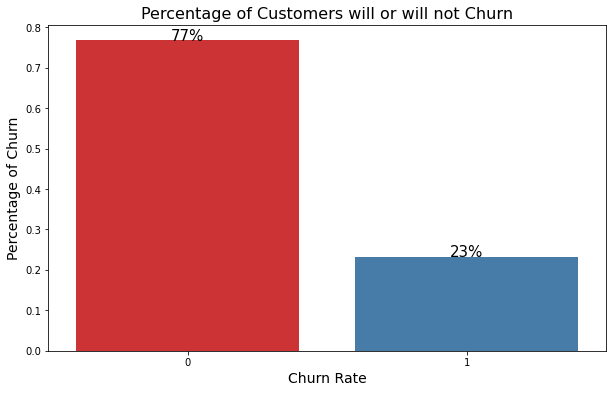

In [131]:
#Ploting barplot for target 

plt.figure(figsize=(10,6))
bar_graph = sns.barplot(telecom_imp['Churn'], telecom_imp['Churn'], palette='Set1', estimator=lambda x: len(x) / len(telecom_imp) )

#Anotating the graph
for i in bar_graph.patches:
        width, height = i.get_width(), i.get_height()
        x, y = i.get_xy() 
        bar_graph.text(x+width/2, 
               y+height, 
               '{:.0%}'.format(height), 
               horizontalalignment='center',fontsize=15)

#Setting the labels
plt.xlabel('Churn Rate', fontsize=14)
plt.ylabel('Percentage of Churn', fontsize=14)
plt.title('Percentage of Customers will or will not Churn', fontsize=16)

In [132]:
# Putting feature variable to X
X = telecom_imp.drop(['Churn'], axis=1)

In [133]:
X.head()

,arpu_6,onnet_mou_6,offnet_mou_6,loc_og_t2f_mou_6,loc_og_t2c_mou_8,loc_og_mou_6,std_og_t2f_mou_6,spl_og_mou_6,loc_ic_t2f_mou_6,loc_ic_mou_6,std_ic_t2t_mou_6,std_ic_t2m_mou_6,std_ic_t2f_mou_6,spl_ic_mou_8,isd_ic_mou_6,ic_others_6,total_rech_num_6,max_rech_amt_6,total_rech_data_6,max_rech_data_6,max_rech_data_8,vol_2g_mb_6,monthly_2g_6,aon,cat_loc_og_t2t_6_Medium,cat_loc_og_t2t_7_Medium,cat_loc_og_t2t_8_Medium,cat_loc_og_t2m_6_Medium,cat_loc_og_t2m_7_Medium,cat_loc_og_t2m_8_Medium,cat_total_og_6_Medium,cat_total_og_7_Medium,cat_total_og_8_Medium,cat_loc_ic_t2t_6_Medium,cat_loc_ic_t2t_7_Medium,cat_loc_ic_t2t_8_Medium,cat_loc_ic_t2m_6_Medium,cat_loc_ic_t2m_7_Medium,cat_loc_ic_t2m_8_Medium,cat_total_ic_6_Medium,cat_total_ic_7_Medium,cat_total_ic_8_Medium,roam_ic_mou_6_7_months,spl_ic_mou_6_7_months,og_others_6_7_months,loc_og_t2c_mou_6_7_months
8,378.721,413.69,94.66,0.00,7.15,378.09,0.0,0.00,0.00,81.43,0.00,22.43,0.00,0.0,0.0,0.00,19,90,1.0,154.0,23.0,0.00,0,315,0,0,1,1,1,1,0,0,1,1,1,0,1,0,0,1,0,0,0.000,0.0,0.00,0.0
16,430.975,50.51,296.29,0.00,0.00,315.91,0.0,0.00,8.71,276.86,68.79,18.68,0.51,0.0,0.0,0.00,10,110,1.0,154.0,25.0,0.00,0,511,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,1.415,0.0,0.00,0.0
17,690.008,1185.91,61.64,0.00,0.00,97.54,0.0,2.58,0.00,81.96,8.63,1.28,0.00,0.0,0.0,0.00,19,110,1.0,154.0,25.0,0.00,0,667,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,2.380,0.0,0.93,0.0
21,514.453,102.41,757.93,0.75,0.00,97.04,0.0,0.00,4.61,125.33,14.06,67.69,0.00,0.0,0.0,0.00,22,50,1.0,154.0,25.0,0.00,0,720,0,1,1,1,1,0,0,0,0,0,1,1,0,1,0,1,1,0,0.000,0.0,0.00,0.0
33,977.020,0.00,0.00,0.00,0.56,0.00,0.0,0.00,1.73,3.48,0.00,2.95,0.23,0.0,0.0,1.23,7,252,5.0,252.0,455.0,87.05,0,1328,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0.000,0.0,0.00,0.0


In [134]:
# Putting response variable to y
y = telecom_imp['Churn']

In [135]:
y.head()

8     0
16    0
17    0
21    0
33    1
Name: Churn, dtype: int32

In [136]:
# # target variable distribution
100*(telecom_imp['Churn'].astype('int').value_counts()/len(telecom_imp.index))

0    76.791001
1    23.208999
Name: Churn, dtype: float64

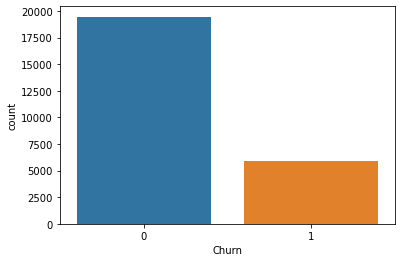

In [137]:
sns.countplot(y)

In [138]:
# To handle imbalanced data here we use SMOTE Analysis

from imblearn.over_sampling import SMOTE
smote=SMOTE()
X_smote,y_smote=smote.fit_resample(X,y)

In [139]:
X_smote.head()

,arpu_6,onnet_mou_6,offnet_mou_6,loc_og_t2f_mou_6,loc_og_t2c_mou_8,loc_og_mou_6,std_og_t2f_mou_6,spl_og_mou_6,loc_ic_t2f_mou_6,loc_ic_mou_6,std_ic_t2t_mou_6,std_ic_t2m_mou_6,std_ic_t2f_mou_6,spl_ic_mou_8,isd_ic_mou_6,ic_others_6,total_rech_num_6,max_rech_amt_6,total_rech_data_6,max_rech_data_6,max_rech_data_8,vol_2g_mb_6,monthly_2g_6,aon,cat_loc_og_t2t_6_Medium,cat_loc_og_t2t_7_Medium,cat_loc_og_t2t_8_Medium,cat_loc_og_t2m_6_Medium,cat_loc_og_t2m_7_Medium,cat_loc_og_t2m_8_Medium,cat_total_og_6_Medium,cat_total_og_7_Medium,cat_total_og_8_Medium,cat_loc_ic_t2t_6_Medium,cat_loc_ic_t2t_7_Medium,cat_loc_ic_t2t_8_Medium,cat_loc_ic_t2m_6_Medium,cat_loc_ic_t2m_7_Medium,cat_loc_ic_t2m_8_Medium,cat_total_ic_6_Medium,cat_total_ic_7_Medium,cat_total_ic_8_Medium,roam_ic_mou_6_7_months,spl_ic_mou_6_7_months,og_others_6_7_months,loc_og_t2c_mou_6_7_months
0,378.721,413.69,94.66,0.00,7.15,378.09,0.0,0.00,0.00,81.43,0.00,22.43,0.00,0.0,0.0,0.00,19,90,1.0,154.0,23.0,0.00,0,315,0,0,1,1,1,1,0,0,1,1,1,0,1,0,0,1,0,0,0.000,0.0,0.00,0.0
1,430.975,50.51,296.29,0.00,0.00,315.91,0.0,0.00,8.71,276.86,68.79,18.68,0.51,0.0,0.0,0.00,10,110,1.0,154.0,25.0,0.00,0,511,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,1.415,0.0,0.00,0.0
2,690.008,1185.91,61.64,0.00,0.00,97.54,0.0,2.58,0.00,81.96,8.63,1.28,0.00,0.0,0.0,0.00,19,110,1.0,154.0,25.0,0.00,0,667,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,2.380,0.0,0.93,0.0
3,514.453,102.41,757.93,0.75,0.00,97.04,0.0,0.00,4.61,125.33,14.06,67.69,0.00,0.0,0.0,0.00,22,50,1.0,154.0,25.0,0.00,0,720,0,1,1,1,1,0,0,0,0,0,1,1,0,1,0,1,1,0,0.000,0.0,0.00,0.0
4,977.020,0.00,0.00,0.00,0.56,0.00,0.0,0.00,1.73,3.48,0.00,2.95,0.23,0.0,0.0,1.23,7,252,5.0,252.0,455.0,87.05,0,1328,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0.000,0.0,0.00,0.0


In [140]:
type(X_smote)

pandas.core.frame.DataFrame

In [141]:
y_smote.value_counts()

1    19455
0    19455
Name: Churn, dtype: int64

In [142]:
type(y_smote)

pandas.core.series.Series

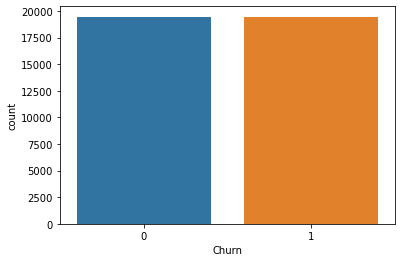

In [143]:
sns.countplot(y_smote)

## Step4: Train-Test Split

In [144]:
from sklearn.model_selection import train_test_split

In [145]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X_smote, y_smote, train_size=0.7, test_size=0.3, random_state=100)

### Step4a: Performing PCA analysis for Dimensionality Reduction

#### Scaling before PCA

In [146]:
X_p_train=X_train.copy()
X_p_test=X_test.copy()

In [147]:
X_p_train.shape

(27237, 46)

In [148]:
y_pca_train=y_train.copy()
y_pca_test=y_test.copy()

In [149]:
X_cov_matrix=X_p_train.cov()

In [150]:
eig_vals, eig_vecs= np.linalg.eig(X_cov_matrix)
print('Eigen Vectors \n%s', eig_vecs)
print('\nEigen Values \n%s', eig_vals)

Eigen Vectors 
%s [[-2.11917475e-03  5.90897329e-01 -3.61106224e-02 ... -5.41234446e-06
  -6.50578725e-06  8.58900980e-06]
 [ 4.02117756e-02  3.18135145e-01  8.32892780e-01 ...  1.89974609e-05
   1.60481238e-05  3.02867075e-05]
 [ 2.00327659e-02  5.64166831e-01 -5.29544021e-01 ...  1.16010833e-05
   3.72429073e-05  3.24994823e-05]
 ...
 [ 1.05897589e-05 -7.92666477e-07  3.05690093e-06 ...  2.75310270e-03
  -1.72391794e-04  1.33190110e-03]
 [ 1.68668177e-04  3.81965605e-04  1.52873216e-04 ...  1.62518347e-03
  -9.61560037e-04 -1.44707423e-03]
 [ 2.72763641e-04  4.65178493e-04  1.49380793e-05 ... -2.98528203e-04
  -3.53053876e-04 -2.27957564e-04]]

Eigen Values 
%s [9.96576954e+05 3.58775670e+05 1.85495938e+05 1.33480664e+05
 1.00926406e+05 7.30211780e+04 5.29320756e+04 2.06329465e+04
 1.00204164e+04 8.19919880e+03 5.48306830e+03 4.80861290e+03
 4.20242521e+03 3.27747142e+03 2.25679772e+03 3.69982744e+02
 3.40785671e+02 2.73894547e+02 1.49870656e+02 1.18725155e+02
 5.16086549e+01 4.87490

In [151]:
eig_pairs= [(np.abs(eig_vals[i]), eig_vecs[:,i]) for i in range(len(eig_vals))]

eig_pairs.sort(key=lambda x:x[0],reverse=True)

print('Eigen Values in Descending Order: ')
for i in eig_pairs:
    print(i[0])

Eigen Values in Descending Order: 
996576.9538613562
358775.6701441133
185495.93807181105
133480.66417461535
100926.40567989781
73021.17800876789
52932.075612938905
20632.946530384354
10020.416357230288
8199.19879538114
5483.068300333626
4808.612901768147
4202.42521341404
3277.471422910402
2256.7977218722153
369.98274389866276
340.7856712572986
273.8945469097537
149.87065557008805
118.72515533413637
51.60865494548669
48.749042371430676
18.186082699062688
3.7473517793118147
3.3952875532397226
0.6129909595454073
0.31171225202595926
0.24471054306218587
0.22221934844875046
0.20030573252087971
0.15805072686943417
0.15205573657492735
0.13882435953140182
0.12464946507188562
0.12121804455231773
0.1197704084261342
0.11528649534875299
0.10262399832953208
0.10170547835067953
0.09927739237508436
0.08639006394610084
0.08365151612337249
0.07701223601105532
0.07081464005906964
0.014200219016950772
0.009283733297104507


In [152]:
tot=sum(eig_vals)
var_exp =[(i/tot)*100 for i in sorted(eig_vals, reverse=True)]
cum_var_exp=np.cumsum(var_exp)
print("Variance  captured  by each component is \n",var_exp)
print(40*'-')
print("Cumulative  variance  captured as we travel each component \n",cum_var_exp)

Variance  captured  by each component is 
 [50.80760709391464, 18.291144715828924, 9.456976405638263, 6.80512740510565, 5.145442251415606, 3.722774550855627, 2.6985894967642645, 1.0519113816988372, 0.5108620816716375, 0.4180125471159331, 0.27953845289423135, 0.2451532859887444, 0.21424855176252167, 0.1670924454670175, 0.11505633508687078, 0.018862505108809564, 0.017373976411344527, 0.013963724999497152, 0.0076407239336700366, 0.006052860264336372, 0.002631118703835179, 0.002485329588864667, 0.000927165073175033, 0.00019104794276874704, 0.00017309896170834163, 3.125157942297511e-05, 1.589175182702201e-05, 1.2475862576861998e-05, 1.1329213766085694e-05, 1.021201114188664e-05, 8.057761320463956e-06, 7.752123998393686e-06, 7.077560329693383e-06, 6.35489414169221e-06, 6.179953044713506e-06, 6.106149484206605e-06, 5.877550084033697e-06, 5.231989125707598e-06, 5.1851610287777715e-06, 5.061372055171377e-06, 4.4043487146525845e-06, 4.264731737513021e-06, 3.926247153832811e-06, 3.610280565567585

In [153]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [154]:
X_p_sc_train = scaler.fit_transform(X_p_train)
X_p_sc_test = scaler.transform(X_p_test)

In [155]:
df_X_p_sc_train=pd.DataFrame(data=X_p_sc_train,columns=X_p_train.columns)
df_X_p_sc_test=pd.DataFrame(data=X_p_sc_test,columns=X_p_test.columns)

In [156]:
df_X_p_sc_train.describe()

,arpu_6,onnet_mou_6,offnet_mou_6,loc_og_t2f_mou_6,loc_og_t2c_mou_8,loc_og_mou_6,std_og_t2f_mou_6,spl_og_mou_6,loc_ic_t2f_mou_6,loc_ic_mou_6,std_ic_t2t_mou_6,std_ic_t2m_mou_6,std_ic_t2f_mou_6,spl_ic_mou_8,isd_ic_mou_6,ic_others_6,total_rech_num_6,max_rech_amt_6,total_rech_data_6,max_rech_data_6,max_rech_data_8,vol_2g_mb_6,monthly_2g_6,aon,cat_loc_og_t2t_6_Medium,cat_loc_og_t2t_7_Medium,cat_loc_og_t2t_8_Medium,cat_loc_og_t2m_6_Medium,cat_loc_og_t2m_7_Medium,cat_loc_og_t2m_8_Medium,cat_total_og_6_Medium,cat_total_og_7_Medium,cat_total_og_8_Medium,cat_loc_ic_t2t_6_Medium,cat_loc_ic_t2t_7_Medium,cat_loc_ic_t2t_8_Medium,cat_loc_ic_t2m_6_Medium,cat_loc_ic_t2m_7_Medium,cat_loc_ic_t2m_8_Medium,cat_total_ic_6_Medium,cat_total_ic_7_Medium,cat_total_ic_8_Medium,roam_ic_mou_6_7_months,spl_ic_mou_6_7_months,og_others_6_7_months,loc_og_t2c_mou_6_7_months
count,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04,2.723700e+04
mean,-1.072376e-16,-2.219875e-17,2.680583e-17,-7.935137e-16,6.875683e-16,1.082974e-16,1.123142e-16,4.099606e-16,5.442078e-17,2.011176e-17,5.371917e-16,-1.889054e-16,7.638780e-16,-4.390225e-16,1.246009e-15,7.057561e-17,1.065181e-16,-2.973700e-16,-1.950674e-15,9.875714e-17,-1.490325e-16,4.530720e-16,1.423268e-15,-1.068932e-16,1.183203e-15,-4.026265e-16,1.057168e-15,-1.683306e-15,-2.282322e-16,-1.218543e-15,2.158187e-15,2.784651e-15,-9.478860e-16,-2.000497e-16,3.019617e-16,-9.351113e-16,5.922575e-16,-3.408075e-16,1.272030e-15,-3.286035e-16,-5.127562e-16,1.187279e-15,-7.688994e-16,9.410299e-16,5.462255e-16,6.271189e-16
std,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00,1.000018e+00
min,-1.627504e+00,-6.244396e-01,-9.017417e-01,-3.862571e-01,-2.717306e-01,-8.030534e-01,-1.841631e-01,-3.530029e-01,-3.616144e-01,-8.477858e-01,-2.035489e-01,-3.551648e-01,-1.713946e-01,-2.527656e-01,-1.649524e-01,-1.021587e-01,-1.223100e+00,-1.190394e+00,-3.618228e-01,-1.971592e+00,-9.404304e-01,-3.488959e-01,-3.610746e-01,-1.167203e+00,-5.668214e-01,-5.647858e-01,-5.506978e-01,-5.390811e-01,-5.190714e-01,-5.160495e-01,-5.305657e-01,-5.054212e-01,-5.185584e-01,-6.129804e-01,-6.058422e-01,-5.957682e-01,-5.889817e-01,-5.822540e-01,-5.694786e-01,-5.932229e-01,-5.902822e-01,-5.757534e-01,-2.334389e-01,-3.414206e-01,-3.188411e-01,-3.015781e-01
25%,-5.306739e-01,-5.295931e-01,-5.927071e-01,-3.862571e-01,-2.717306e-01,-6.175056e-01,-1.841631e-01,-3.530029e-01,-3.580520e-01,-6.159428e-01,-2.035489e-01,-3.440649e-01,-1.713946e-01,-2.527656e-01,-1.649524e-01,-1.021587e-01,-6.532942e-01,-4.824303e-01,-3.618228e-01,-6.844903e-02,-7.210092e-01,-3.488959e-01,-3.610746e-01,-8.551949e-01,-5.668214e-01,-5.647858e-01,-5.506978e-01,-5.390811e-01,-5.190714e-01,-5.160495e-01,-5.305657e-01,-5.054212e-01,-5.185584e-01,-6.129804e-01,-6.058422e-01,-5.957682e-01,-5.889817e-01,-5.822540e-01,-5.694786e-01,-5.932229e-01,-5.902822e-01,-5.757534e-01,-2.334389e-01,-3.414206e-01,-3.188411e-01,-3.015781e-01
50%,-2.295441e-01,-3.64

In [157]:
from sklearn.decomposition import PCA

pca = PCA()
df_X_pca_train = pca.fit_transform(df_X_p_sc_train)
df_X_pca_test = pca.transform(df_X_p_sc_test)

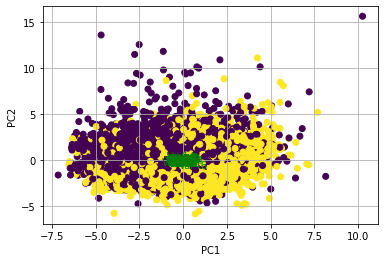

In [158]:
def myplot(score,coeff,labels=None):
    xs = score[:,0]
    ys = score[:,1]
    n = coeff.shape[0]

    plt.scatter(xs ,ys, c = y_pca_test) #without scaling
    for i in range(n):
        plt.arrow(0, 0, coeff[i,0], coeff[i,1],color = 'r',alpha = 0.5)
        if labels is None:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, "Var"+str(i+1), color = 'g', ha = 'center', va = 'center')
        else:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, labels[i], color = 'g', ha = 'center', va = 'center')

plt.xlabel("PC{}".format(1))
plt.ylabel("PC{}".format(2))
plt.grid()

#Call the function. 
myplot(df_X_pca_test[:,0:47], pca.components_) 
plt.show()

In [159]:
explained_variance_all = pca.explained_variance_ratio_
print(explained_variance_all)

[0.10918331 0.06198892 0.04546374 0.03982871 0.03761081 0.03564989
 0.03252148 0.03227589 0.02694438 0.02632599 0.02532041 0.02414843
 0.02385783 0.02271727 0.02240196 0.02190978 0.02129091 0.01979325
 0.01934952 0.018634   0.01834093 0.01819614 0.01767129 0.01718935
 0.01630504 0.01602164 0.01577589 0.01513719 0.01409089 0.01407548
 0.01391389 0.01366319 0.0133854  0.01273658 0.01257273 0.01208584
 0.01191477 0.01106383 0.01071062 0.01023343 0.01000059 0.00883126
 0.00818529 0.00793202 0.00720059 0.00554965]


<BarContainer object of 46 artists>

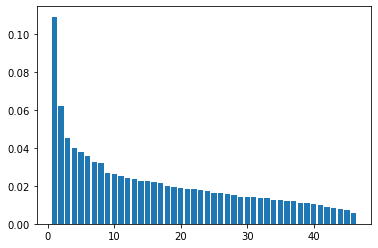

In [160]:
plt.bar(range(1,len(pca.explained_variance_ratio_)+1), pca.explained_variance_ratio_)

In [161]:
var_cumu = np.cumsum(pca.explained_variance_ratio_)

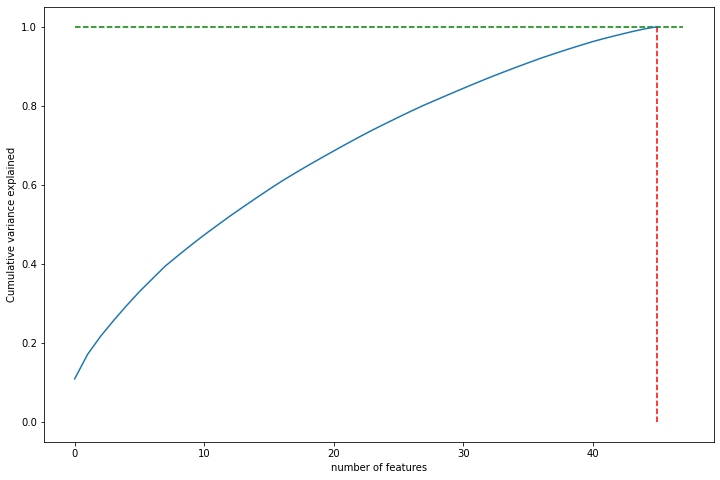

In [162]:
#making the scree plot
fig = plt.figure(figsize=[12,8])
plt.vlines(x=45, ymax=1, ymin=0, colors="r", linestyles="--")
plt.hlines(y=1.0, xmax=47, xmin=0, colors="g", linestyles="--")
plt.plot(var_cumu)
plt.ylabel("Cumulative variance explained")
plt.xlabel("number of features")
plt.show()

In [163]:
# Let us take components which can describe almost 95% variance
pca8 = PCA(n_components=8, random_state=42)
X_pca_train = pca8.fit_transform(X_p_sc_train)
X_pca_test = pca8.transform(X_p_sc_test)

In [164]:
print(pd.DataFrame(pca8.components_,columns=X_p_train.columns,
                   index = ['PC-1','PC-2','PC-3','PC-4','PC-5',
                            'PC-6','PC-7','PC-8']))

        arpu_6  onnet_mou_6  offnet_mou_6  loc_og_t2f_mou_6  loc_og_t2c_mou_8  \
PC-1  0.140867     0.002033      0.086894          0.129935         -0.008910   
PC-2  0.249207     0.305416      0.317075         -0.038448          0.115367   
PC-3  0.361018     0.107199      0.199523          0.229588         -0.061262   
PC-4  0.157865    -0.120324      0.074687          0.092742          0.257282   
PC-5  0.041207     0.053373     -0.148069         -0.136950          0.227238   
PC-6  0.078402    -0.014343     -0.024090         -0.235512         -0.019190   
PC-7 -0.242529    -0.089369     -0.057236          0.061423          0.412862   
PC-8 -0.052575     0.026624     -0.042775          0.082996         -0.041803   

      loc_og_mou_6  std_og_t2f_mou_6  spl_og_mou_6  loc_ic_t2f_mou_6  \
PC-1      0.221312          0.033246     -0.003924          0.124490   
PC-2      0.193927         -0.023405      0.200891         -0.045941   
PC-3      0.163859          0.161168     -0.014213    

In [165]:
X_pca_train.shape

(27237, 8)

In [166]:
explained_variance_8 = pca8.explained_variance_ratio_
print(explained_variance_8)

[0.10918328 0.06198819 0.04544188 0.03979245 0.03759204 0.03556577
 0.03240375 0.03211073]


<BarContainer object of 8 artists>

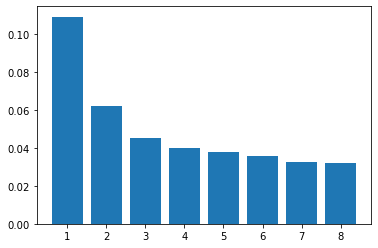

In [167]:
plt.bar(range(1,len(explained_variance_8)+1), explained_variance_8)

In [168]:
var_cumu = np.cumsum(explained_variance_8)

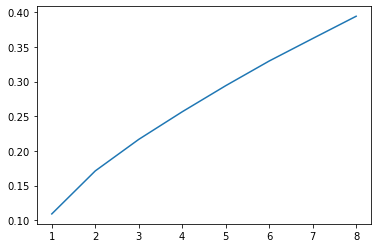

In [169]:
#making the scree plot
plt.plot(range(1,len(var_cumu)+1), var_cumu)

### Step5a: Classification Model to predict

#### Model 1: Random Classifier Model

In [170]:
from sklearn.ensemble import RandomForestClassifier

classifier = RandomForestClassifier(max_depth=2, random_state=0)
classifier.fit(X_pca_train, y_pca_train)

RandomForestClassifier(max_depth=2, random_state=0)

In [171]:
X_pca_train.shape

(27237, 8)

#### Evaluation

In [172]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score

In [173]:
# Predicting the Test set results
y_pca_pred_test = classifier.predict(X_pca_test)

In [174]:
c_m_test = confusion_matrix(y_pca_test, y_pca_pred_test)
print(c_m_test)

[[4179 1620]
 [1607 4267]]


In [175]:
rcm_acc_test= accuracy_score(y_pca_test, y_pca_pred_test)
print('Accuracy: ',rcm_acc_test)

Accuracy:  0.7235500728176133


In [176]:
# roc auc
roc_auc_RFC_test=metrics.roc_auc_score(y_pca_test, y_pca_pred_test)
print("ROC AUC Random Forest Classifier ",roc_auc_RFC_test)

ROC AUC Random Forest Classifier  0.7235315042342019


In [177]:
results = pd.DataFrame({'Model':['Random Classifier for Test'],'Accuracy': [rcm_acc_test], 'ROC-AUC':[roc_auc_RFC_test]})
results = results[['Model', 'Accuracy', 'ROC-AUC']]
results

,Model,Accuracy,ROC-AUC
0,Random Classifier for Test,0.72355,0.723532


#### Model 2: Decision Tree Classifier Model

In [178]:
from sklearn.tree import DecisionTreeClassifier

In [179]:
dt = DecisionTreeClassifier(max_depth=3)
dt.fit(X_pca_train, y_pca_train)

DecisionTreeClassifier(max_depth=3)

In [180]:
# Importing required packages for visualization
from IPython.display import Image  
from six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz

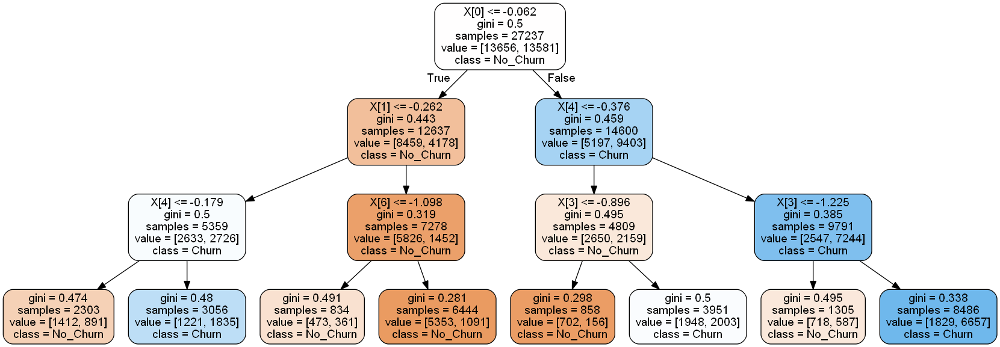

In [181]:
#plotting tree with max_depth=3
dot_data = StringIO()  

export_graphviz(dt, out_file=dot_data, filled=True, rounded=True,
                feature_names=None, 
                class_names=['No_Churn', "Churn"])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

In [182]:
#y_pca_pred_dt = dt.predict(X_pca_test).astype(int)
acc_decision_tree = dt.score(X_pca_train,y_pca_train) 
print('Accuracy of decision tree: ', acc_decision_tree)

Accuracy of decision tree:  0.7031978558578404


#### Evaluating model performance

In [183]:
from sklearn.metrics import confusion_matrix, accuracy_score

In [184]:
y_pca_test_pred=dt.predict(X_pca_test)

In [185]:
acc_dtc_test=accuracy_score(y_pca_test, y_pca_test_pred)
print('Accuracy of decision tree: ',acc_dtc_test)

Accuracy of decision tree:  0.6993917587595305


In [186]:
c_dtc_m_test=confusion_matrix(y_pca_test, y_pca_test_pred)
print(c_dtc_m_test)

[[3639 2160]
 [1349 4525]]


In [187]:
# roc auc
roc_auc_DTC_test=metrics.roc_auc_score(y_pca_test, y_pca_test_pred)
print("ROC AUC Decision Tree Classifier ",roc_auc_DTC_test)

ROC AUC Decision Tree Classifier  0.6989329374354107


Creating helper functions to evaluate model performance and help plot the decision tree

In [188]:
def get_dt_graph(dt_classifier):
    dot_data = StringIO()
    export_graphviz(dt_classifier, out_file=dot_data, filled=True,rounded=True,
                    feature_names=None,
                    class_names=['Churn', "No_Churn"])
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    return graph

In [189]:
def evaluate_model(dt_classifier):
    print("Test Accuracy :", accuracy_score(y_pca_test, dt_classifier.predict(X_pca_test)))
    print("Test Confusion Matrix:")
    print(confusion_matrix(y_pca_test, dt_classifier.predict(X_pca_test)))

##### Without setting any hyper-parameters

In [190]:
dt_default = DecisionTreeClassifier(random_state=42)
dt_default.fit(X_pca_train, y_pca_train)

DecisionTreeClassifier(random_state=42)

In [191]:
evaluate_model(dt_default)

Test Accuracy : 0.7133556069562238
Test Confusion Matrix:
[[4112 1687]
 [1659 4215]]


#### Controlling the depth of the tree

In [192]:
dt_depth = DecisionTreeClassifier(max_depth=3)
dt_depth.fit(X_pca_train, y_pca_train)

DecisionTreeClassifier(max_depth=3)

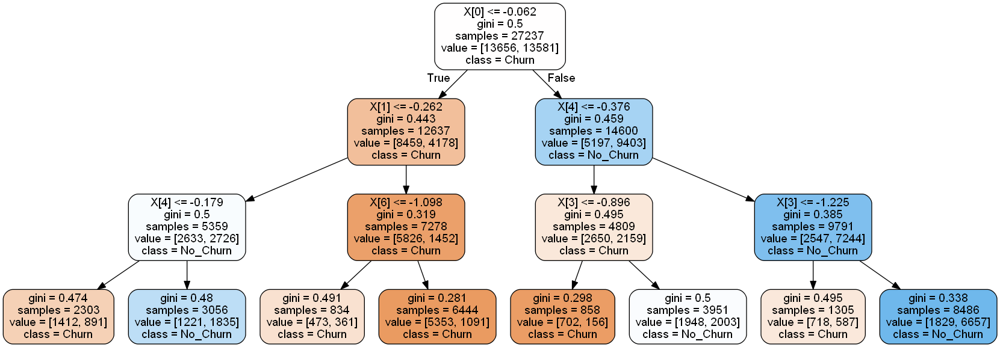

In [193]:
gph = get_dt_graph(dt_depth) 
Image(gph.create_png())

In [194]:
evaluate_model(dt_depth)

Test Accuracy : 0.6993917587595305
Test Confusion Matrix:
[[3639 2160]
 [1349 4525]]


#### Hyper parameter Tuning

In [195]:
dt = DecisionTreeClassifier(random_state=42)

In [196]:
from sklearn.model_selection import GridSearchCV

In [197]:
# Create the parameter grid based on the results of random search 
params = {
    'max_depth': [2, 3, 5, 10, 20],
    'min_samples_leaf': [5, 10, 20, 50, 100],
    'criterion': ["gini", "entropy"]
}

In [198]:
# Instantiate the grid search model
grid_search = GridSearchCV(estimator=dt, 
                           param_grid=params, 
                           cv=4, n_jobs=3, verbose=1, scoring = "accuracy")

In [199]:
X_pca_train.shape

(27237, 8)

In [200]:
%%time
grid_search.fit(X_pca_train, y_pca_train)

Fitting 4 folds for each of 50 candidates, totalling 200 fits
Wall time: 15.5 s


GridSearchCV(cv=4, estimator=DecisionTreeClassifier(random_state=42), n_jobs=3,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 3, 5, 10, 20],
                         'min_samples_leaf': [5, 10, 20, 50, 100]},
             scoring='accuracy', verbose=1)

In [201]:
score_df = pd.DataFrame(grid_search.cv_results_)
score_df.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
0,0.065571,0.005104,0.002243,4.315023e-04,gini,2,5,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.682673,0.677926,0.666324,0.669702,0.674156,0.006479,41
1,0.062910,0.003002,0.001995,7.996802e-07,gini,2,10,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.682673,0.677926,0.666324,0.669702,0.674156,0.006479,41
2,0.064489,0.003929,0.002215,3.813631e-04,gini,2,20,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.682673,0.677926,0.666324,0.669702,0.674156,0.006479,41
3,0.067807,0.001921,0.001995,7.053721e-04,gini,2,50,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.682673,0.677926,0.666324,0.669702,0.674156,0.006479,41
4,0.065596,0.001681,0.001997,5.209869e-06,gini,2,100,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.682673,0.677926,0.666324,0.669702,0.674156,0.006479,41


In [202]:
score_df.nlargest(5,"mean_test_score")

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
48,0.330505,0.012129,0.001747,4.332604e-04,entropy,20,50,"{'criterion': 'entropy', 'max_depth': 20, 'min...",0.754772,0.745778,0.757380,0.755471,0.753350,0.004475,1
43,0.307692,0.002707,0.002244,4.320178e-04,entropy,10,50,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.756388,0.746071,0.756646,0.753855,0.753240,0.004280,2
17,0.210635,0.005746,0.001875,8.932235e-04,gini,10,20,"{'criterion': 'gini', 'max_depth': 10, 'min_sa...",0.763142,0.744015,0.750037,0.754149,0.752836,0.006957,3
42,0.344971,0.011760,0.001995,3.526258e-07,entropy,10,20,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.752863,0.748715,0.753708,0.754002,0.752322,0.002124,4
16,0.230299,0.019222,0.002376,4.213413e-04,gini,10,10,"{'criterion': 'gini', 'max_depth': 10, 'min_sa...",0.754919,0.744603,0.752093,0.750771,0.750596,0.003771,5


In [203]:
grid_search.best_estimator_

DecisionTreeClassifier(criterion='entropy', max_depth=20, min_samples_leaf=50,
                       random_state=42)

In [204]:
dt_best = grid_search.best_estimator_

In [205]:
evaluate_model(dt_best)

Test Accuracy : 0.7568748393729119
Test Confusion Matrix:
[[4338 1461]
 [1377 4497]]


In [206]:
from sklearn.metrics import classification_report

In [207]:
print(classification_report(y_pca_test, dt_best.predict(X_pca_test)))

              precision    recall  f1-score   support

           0       0.76      0.75      0.75      5799
           1       0.75      0.77      0.76      5874

    accuracy                           0.76     11673
   macro avg       0.76      0.76      0.76     11673
weighted avg       0.76      0.76      0.76     11673



In [208]:
gph = get_dt_graph(dt_best)
Image(gph.create_png())

In [209]:
DTC=DecisionTreeClassifier(max_depth=5, min_samples_leaf=20, random_state=42)

In [210]:
DTC.fit(X_pca_train,y_pca_train)

DecisionTreeClassifier(max_depth=5, min_samples_leaf=20, random_state=42)

In [211]:
# Predicting on Test

In [212]:
y_pca_pred_DTC_test = DTC.predict(X_pca_test).astype(int)

In [213]:
acc_dtc_test=accuracy_score(y_pca_test, y_pca_pred_DTC_test)
print('Accuracy of decision tree for Test: ',acc_dtc_test )

Accuracy of decision tree for Test:  0.7308318341471772


In [214]:
# roc auc
roc_auc_DTC_test=metrics.roc_auc_score(y_pca_test, y_pca_pred_DTC_test)
print("ROC AUC Random Forest Classifier for Test",roc_auc_DTC_test)

ROC AUC Random Forest Classifier for Test 0.7306566892498989


In [215]:
tempResults = pd.DataFrame({'Model':['Decision Tree classifier for Test'], 
                            'Accuracy': [acc_dtc_test], 'ROC-AUC':[roc_auc_DTC_test]})
results = pd.concat([results, tempResults])
results = results[['Model', 'Accuracy', 'ROC-AUC']]
results

,Model,Accuracy,ROC-AUC
0,Random Classifier for Test,0.723550,0.723532
0,Decision Tree classifier for Test,0.730832,0.730657


### Step 5b: Logistic Regression Model through PCA

In [216]:
from sklearn.linear_model import LogisticRegression

In [217]:
logreg_pca=LogisticRegression(solver='lbfgs')

In [218]:
logreg_pca.fit(X_pca_train,y_pca_train)

LogisticRegression()

In [219]:
y_pca_test_pred = logreg_pca.predict(X_pca_test)

In [220]:
# Predicting on Test data

In [221]:
logreg_pca.predict(X_pca_test)

array([1, 0, 0, ..., 1, 0, 1])

In [222]:
lor_pca_acc_test=logreg_pca.score(X_pca_test, y_pca_test)
print("Accuracy of logistic Regression(PCA)for Test: ",lor_pca_acc_test)

Accuracy of logistic Regression(PCA)for Test:  0.7748650732459522


In [223]:
c_logregpca_m_test=confusion_matrix(y_pca_test, y_pca_test_pred)
print(c_logregpca_m_test)

[[4619 1180]
 [1448 4426]]


In [224]:
# roc auc
roc_auc_logreg_test=metrics.roc_auc_score(y_pca_test, y_pca_test_pred)
print("ROC AUC under logreg(PCA) for Test",roc_auc_logreg_test)

ROC AUC under logreg(PCA) for Test 0.7750032982686424


In [225]:
tempResults = pd.DataFrame({'Model':['Logistic regression(PCA) for Test'], 
                            'Accuracy': [lor_pca_acc_test], 'ROC-AUC':[roc_auc_logreg_test]})
results = pd.concat([results, tempResults])
results = results[['Model', 'Accuracy', 'ROC-AUC']]
results

,Model,Accuracy,ROC-AUC
0,Random Classifier for Test,0.723550,0.723532
0,Decision Tree classifier for Test,0.730832,0.730657
0,Logistic regression(PCA) for Test,0.774865,0.775003


### Adaboost

In [226]:
# adaboost classifier with max 600 decision trees of depth=2
# learning_rate/shrinkage=1.5

# base estimator
tree = DecisionTreeClassifier(max_depth=2)

# adaboost with the tree as base estimator
adaboost_model_1 = AdaBoostClassifier(
    base_estimator=tree,
    n_estimators=600,
    learning_rate=1.5,
    algorithm="SAMME")

In [227]:
# fit
adaboost_model_1.fit(X_pca_train, y_pca_train)

AdaBoostClassifier(algorithm='SAMME',
                   base_estimator=DecisionTreeClassifier(max_depth=2),
                   learning_rate=1.5, n_estimators=600)

In [228]:
# predictions
# the second column represents the probability of a churning
predictions = adaboost_model_1.predict_proba(X_pca_test)
predictions[:10]

array([[0.47106022, 0.52893978],
       [0.52218423, 0.47781577],
       [0.49883637, 0.50116363],
       [0.50592812, 0.49407188],
       [0.50133953, 0.49866047],
       [0.51256978, 0.48743022],
       [0.48301907, 0.51698093],
       [0.50846275, 0.49153725],
       [0.48542598, 0.51457402],
       [0.50817294, 0.49182706]])

In [229]:
# metrics: AUC
metrics.roc_auc_score(y_pca_test, predictions[:,1])

0.8465371379177713

#### Adaboost-Hyperparameter Tuning

In [230]:
# parameter grid
param_grid = {"base_estimator__max_depth" : [2,5],
              "n_estimators": [200,400,600]
             }

In [231]:
# base estimator
tree = DecisionTreeClassifier()

# adaboost with the tree as base estimator
# learning rate is arbitrarily set to 0.6

ABC = AdaBoostClassifier(
    base_estimator=tree,
    learning_rate=0.6,
    algorithm="SAMME")

In [232]:
# run grid search
folds = 3
grid_search_ABC = GridSearchCV(ABC, 
                               cv = folds,
                               param_grid=param_grid, 
                               scoring = 'roc_auc', 
                               n_jobs=8,
                               return_train_score=True,                         
                               verbose = 1)

Note: The step below for grid_search takes approximately 15-20 mins to execute based on machine's processing speed

In [233]:
# fit 
grid_search_ABC.fit(X_pca_train, y_pca_train)

Fitting 3 folds for each of 6 candidates, totalling 18 fits


GridSearchCV(cv=3,
             estimator=AdaBoostClassifier(algorithm='SAMME',
                                          base_estimator=DecisionTreeClassifier(),
                                          learning_rate=0.6),
             n_jobs=8,
             param_grid={'base_estimator__max_depth': [2, 5],
                         'n_estimators': [200, 400, 600]},
             return_train_score=True, scoring='roc_auc', verbose=1)

In [234]:
# cv results
cv_results = pd.DataFrame(grid_search_ABC.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_base_estimator__max_depth,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
0,27.851713,0.199046,0.416685,0.008053,2,200,"{'base_estimator__max_depth': 2, 'n_estimators...",0.837565,0.837034,0.827460,0.834019,0.004644,6,0.846516,0.844599,0.843826,0.844980,0.001131
1,54.948176,0.317865,0.754349,0.030936,2,400,"{'base_estimator__max_depth': 2, 'n_estimators...",0.840487,0.843258,0.830412,0.838052,0.005520,5,0.851225,0.852769,0.847596,0.850530,0.002168
2,82.480898,0.217073,1.146348,0.108982,2,600,"{'base_estimator__max_depth': 2, 'n_estimators...",0.841726,0.843522,0.830790,0.838679,0.005627,4,0.853154,0.853080,0.848562,0.851599,0.002148
3,64.608529,0.163249,0.404339,0.033978,5,200,"{'base_estimator__max_depth': 5, 'n_estimators...",0.842187,0.849142,0.841052,0.844127,0.003576,3,0.876730,0.882987,0.871759,0.877159,0.004594
4,107.817295,6.486304,0.545511,0.082638,5,400,"{'base_estimator__max_depth': 5, 'n_estimators...",0.844754,0.851355,0.850178,0.848762,0.002875,2,0.884432,0.888870,0.887654,0.886985,0.001873
5,123.595941,1.169379,0.408700,0.029357,5,600,"{'base_estimator__max_depth': 5, 'n_estimators...",0.845207,0.851372,0.850315,0.848965,0.002692,1,0.887886,0.890033,0.888329,0.888749,0.000925


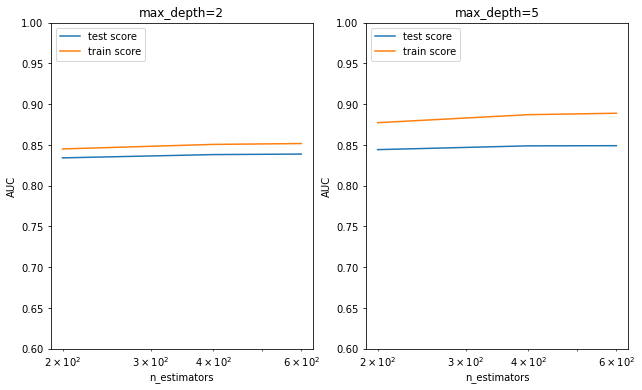

In [235]:
# plotting AUC with hyperparameter combinations

plt.figure(figsize=(16,6))
for n, depth in enumerate(param_grid['base_estimator__max_depth']):
    

    # subplot 1/n
    plt.subplot(1,3, n+1)
    depth_df = cv_results[cv_results['param_base_estimator__max_depth']==depth]

    plt.plot(depth_df["param_n_estimators"], depth_df["mean_test_score"])
    plt.plot(depth_df["param_n_estimators"], depth_df["mean_train_score"])
    plt.xlabel('n_estimators')
    plt.ylabel('AUC')
    plt.title("max_depth={0}".format(depth))
    plt.ylim([0.60, 1])
    plt.legend(['test score', 'train score'], loc='upper left')
    plt.xscale('log')

The results above show that:
The ensemble with max_depth=5 is clearly overfitting (training auc is almost 1, while the test score is much lower)
At max_depth=2, the model performs slightly better with a higher test score
Thus, we should go ahead with max_depth=2 and n_estimators=600.
Note that we haven't experimented with many other important hyperparameters till now, such as learning rate, subsample etc., and the results might be considerably improved by tuning them. We'll next experiment with these hyperparameters.

In [236]:
grid_search_ABC.best_estimator_

AdaBoostClassifier(algorithm='SAMME',
                   base_estimator=DecisionTreeClassifier(max_depth=5),
                   learning_rate=0.6, n_estimators=600)

In [237]:
# model performance on test data with chosen hyperparameters

# base estimator
tree = DecisionTreeClassifier(max_depth=2)

# adaboost with the tree as base estimator
# learning rate is arbitrarily set, we'll discuss learning_rate below
ABC = AdaBoostClassifier(
    base_estimator=DecisionTreeClassifier(max_depth=5),
    learning_rate=0.6,
    n_estimators=600,
    algorithm="SAMME")

ABC.fit(X_pca_train, y_pca_train)

AdaBoostClassifier(algorithm='SAMME',
                   base_estimator=DecisionTreeClassifier(max_depth=5),
                   learning_rate=0.6, n_estimators=600)

In [238]:
# predict on test data
ABC_predictions_test = ABC.predict_proba(X_pca_test)
ABC_predictions_test[:10]

array([[0.4142954 , 0.5857046 ],
       [0.54943525, 0.45056475],
       [0.52224475, 0.47775525],
       [0.5026274 , 0.4973726 ],
       [0.52676086, 0.47323914],
       [0.56257272, 0.43742728],
       [0.4822085 , 0.5177915 ],
       [0.50450984, 0.49549016],
       [0.44078861, 0.55921139],
       [0.48617423, 0.51382577]])

In [239]:
ABC_pca_acc_tes=ABC.score(X_pca_test, y_pca_test)
print("Accuracy of Adaboost(PCA)for Test: ",ABC_pca_acc_tes)

Accuracy of Adaboost(PCA)for Test:  0.7772637710956909


In [240]:
# roc auc
roc_auc_ABC_test=metrics.roc_auc_score(y_pca_test, ABC_predictions_test[:, 1])
print("ROC AUC under Adaboost for Test",roc_auc_ABC_test)

ROC AUC under Adaboost for Test 0.8503637313631675


In [241]:
tempResults = pd.DataFrame({'Model':['Adaboost(PCA) for Test'], 'Accuracy': [ABC_pca_acc_tes],
                            'ROC-AUC':[roc_auc_ABC_test]})
results = pd.concat([results, tempResults])
results = results[['Model', 'Accuracy','ROC-AUC']]
results

,Model,Accuracy,ROC-AUC
0,Random Classifier for Test,0.723550,0.723532
0,Decision Tree classifier for Test,0.730832,0.730657
0,Logistic regression(PCA) for Test,0.774865,0.775003
0,Adaboost(PCA) for Test,0.777264,0.850364


### Gradient Boosting Classifier

In [242]:
# parameter grid
param_grid = {"learning_rate": [0.2, 0.6, 0.9],
              "subsample": [0.3, 0.6, 0.9]
             }

In [243]:
# adaboost with the tree as base estimator
GBC = GradientBoostingClassifier(max_depth=2, n_estimators=200)

In [244]:
# run grid search
folds = 3
grid_search_GBC = GridSearchCV(GBC, 
                               cv = folds,
                               param_grid=param_grid, 
                               scoring = 'roc_auc', 
                               n_jobs=8,
                               return_train_score=True,                         
                               verbose = 1)

grid_search_GBC.fit(X_pca_train, y_pca_train)

Fitting 3 folds for each of 9 candidates, totalling 27 fits


GridSearchCV(cv=3,
             estimator=GradientBoostingClassifier(max_depth=2,
                                                  n_estimators=200),
             n_jobs=8,
             param_grid={'learning_rate': [0.2, 0.6, 0.9],
                         'subsample': [0.3, 0.6, 0.9]},
             return_train_score=True, scoring='roc_auc', verbose=1)

In [245]:
cv_results = pd.DataFrame(grid_search_GBC.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_learning_rate,param_subsample,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
0,7.996815,0.055260,0.063334,0.001880,0.2,0.3,"{'learning_rate': 0.2, 'subsample': 0.3}",0.851255,0.854225,0.852429,0.852636,0.001221,3,0.875737,0.872602,0.871097,0.873145,0.001933
1,14.473376,0.133377,0.052334,0.015124,0.2,0.6,"{'learning_rate': 0.2, 'subsample': 0.6}",0.854839,0.857855,0.853139,0.855278,0.001950,1,0.879111,0.876304,0.876372,0.877262,0.001308
2,20.972435,0.334360,0.065991,0.002172,0.2,0.9,"{'learning_rate': 0.2, 'subsample': 0.9}",0.854879,0.856237,0.853773,0.854963,0.001008,2,0.878897,0.877018,0.877560,0.877825,0.000790
3,7.983649,0.155754,0.061353,0.004056,0.6,0.3,"{'learning_rate': 0.6, 'subsample': 0.3}",0.829750,0.833866,0.831268,0.831628,0.001700,7,0.862876,0.861533,0.865831,0.863413,0.001795
4,15.394303,0.057907,0.053022,0.017052,0.6,0.6,"{'learning_rate': 0.6, 'subsample': 0.6}",0.839017,0.841527,0.845603,0.842049,0.002714,5,0.891825,0.888816,0.890331,0.890324,0.001228


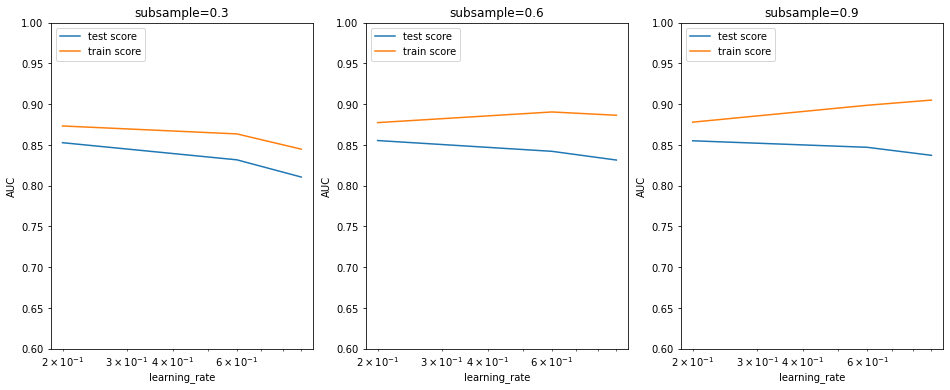

In [246]:
# # plotting
plt.figure(figsize=(16,6))


for n, subsample in enumerate(param_grid['subsample']):
    

    # subplot 1/n
    plt.subplot(1,len(param_grid['subsample']), n+1)
    df = cv_results[cv_results['param_subsample']==subsample]

    plt.plot(df["param_learning_rate"], df["mean_test_score"])
    plt.plot(df["param_learning_rate"], df["mean_train_score"])
    plt.xlabel('learning_rate')
    plt.ylabel('AUC')
    plt.title("subsample={0}".format(subsample))
    plt.ylim([0.60, 1])
    plt.legend(['test score', 'train score'], loc='upper left')
    plt.xscale('log')

It is clear from the plot above that the model with a lower subsample ratio performs better, while those with higher subsamples tend to overfit.
Also, a lower learning rate results in less overfitting.

In [247]:
grid_search_GBC.best_estimator_

GradientBoostingClassifier(learning_rate=0.2, max_depth=2, n_estimators=200,
                           subsample=0.6)

In [248]:
GBC=GradientBoostingClassifier(learning_rate=0.2,
                               n_estimators=200,
                               subsample=0.6,
                               max_depth=2)

In [249]:
GBC.fit(X_pca_train,y_pca_train)

GradientBoostingClassifier(learning_rate=0.2, max_depth=2, n_estimators=200,
                           subsample=0.6)

In [250]:
# predict on test data
GBC_predictions_test = GBC.predict_proba(X_pca_test)
GBC_predictions_test[:10]

array([[0.01753845, 0.98246155],
       [0.85451028, 0.14548972],
       [0.65545703, 0.34454297],
       [0.70752034, 0.29247966],
       [0.4390743 , 0.5609257 ],
       [0.91092714, 0.08907286],
       [0.12477823, 0.87522177],
       [0.76062258, 0.23937742],
       [0.24096491, 0.75903509],
       [0.73095306, 0.26904694]])

In [251]:
GBC_pca_acc_tes=GBC.score(X_pca_test, y_pca_test)
print("Accuracy of GradientBoost(PCA)for Test: ",GBC_pca_acc_tes)

Accuracy of GradientBoost(PCA)for Test:  0.7860875524715155


In [252]:
# roc auc
roc_auc_GBC_test=metrics.roc_auc_score(y_pca_test, GBC_predictions_test[:, 1])
print("ROC AUC under GradientBoost for Test",roc_auc_GBC_test)

ROC AUC under GradientBoost for Test 0.8544991760346596


In [253]:
tempResults = pd.DataFrame({'Model':['GradientBoost(PCA) for Test'],  
                            'Accuracy': [GBC_pca_acc_tes], 'ROC-AUC':[roc_auc_GBC_test]})
results = pd.concat([results, tempResults])
results = results[['Model', 'Accuracy','ROC-AUC']]
results

,Model,Accuracy,ROC-AUC
0,Random Classifier for Test,0.723550,0.723532
0,Decision Tree classifier for Test,0.730832,0.730657
0,Logistic regression(PCA) for Test,0.774865,0.775003
0,Adaboost(PCA) for Test,0.777264,0.850364
0,GradientBoost(PCA) for Test,0.786088,0.854499


### XGBoosting Classifier

In [254]:
# fit model on training data with default hyperparameters
XGBmodel = XGBClassifier()
XGBmodel.fit(X_pca_train, y_pca_train)

[19:10:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=4, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [255]:
# make predictions for test data
# use predict_proba since we need probabilities to compute auc
y_xgb_pred = XGBmodel.predict_proba(X_pca_test)
y_xgb_pred[:10]

array([[0.03047574, 0.96952426],
       [0.84620523, 0.15379478],
       [0.7416118 , 0.25838822],
       [0.76396996, 0.23603004],
       [0.473952  , 0.526048  ],
       [0.8764653 , 0.1235347 ],
       [0.24599767, 0.75400233],
       [0.55042267, 0.44957736],
       [0.08865678, 0.9113432 ],
       [0.7011273 , 0.29887274]], dtype=float32)

In [256]:
# evaluate predictions
roc = metrics.roc_auc_score(y_pca_test, y_xgb_pred[:, 1])
print("AUC: %.2f%%" % (roc * 100.0))

AUC: 86.15%


In [257]:
# hyperparameter tuning with XGBoost

# creating a KFold object 
folds = 3

# specify range of hyperparameters
param_grid = {"base_estimator__max_depth" : [2, 5],
              'learning_rate': [0.2, 0.6], 
             'subsample': [0.3, 0.6, 0.9]}          


# specify model
xgb_model_exp = XGBClassifier(max_depth=2, n_estimators=200)

# set up GridSearchCV()
xgbmodel_cv = GridSearchCV(estimator = xgb_model_exp, 
                        param_grid = param_grid, 
                        scoring= 'roc_auc', 
                        cv = folds, 
                        n_jobs=8,
                        verbose = 1,
                        return_train_score=True)      


In [258]:
# fit the model
xgbmodel_cv.fit(X_pca_train, y_pca_train)       

Fitting 3 folds for each of 12 candidates, totalling 36 fits
[19:11:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "base_estimator__max_depth" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[19:11:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=2, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=200, n_jobs=None,
                                     num_parallel_tree=None, random_state=None,
                                     reg_alpha=None, reg_lambda=None,
                                     scale_pos_weight=None, subsample=None,
                                     tree_method=None, va

In [259]:
# cv results
cv_results = pd.DataFrame(xgbmodel_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_base_estimator__max_depth,param_learning_rate,param_subsample,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
0,8.882480,0.091424,0.032580,0.003083,2,0.2,0.3,"{'base_estimator__max_depth': 2, 'learning_rat...",0.853669,0.858279,0.853720,0.855223,0.002162,5,0.874031,0.872779,0.872447,0.873086,0.000682
1,9.117616,0.098041,0.032579,0.003291,2,0.2,0.6,"{'base_estimator__max_depth': 2, 'learning_rat...",0.854447,0.858459,0.856284,0.856397,0.001640,1,0.877244,0.874218,0.874856,0.875439,0.001302
2,9.323137,0.308749,0.032083,0.008491,2,0.2,0.9,"{'base_estimator__max_depth': 2, 'learning_rat...",0.854237,0.858209,0.854198,0.855548,0.001881,3,0.876790,0.874657,0.874400,0.875282,0.001071
3,9.529756,0.062563,0.032247,0.007522,2,0.6,0.3,"{'base_estimator__max_depth': 2, 'learning_rat...",0.838182,0.841065,0.836589,0.838612,0.001853,11,0.880026,0.874859,0.874328,0.876404,0.002570
4,9.717091,0.046399,0.025437,0.004257,2,0.6,0.6,"{'base_estimator__max_depth': 2, 'learning_rat...",0.845657,0.849382,0.850420,0.848486,0.002045,9,0.892723,0.889722,0.888800,0.890415,0.001675
5,9.182657,0.315607,0.025436,0.002544,2,0.6,0.9,"{'base_estimator__max_depth': 2, 'learning_rat...",0.850397,0.852917,0.852059,0.851791,0.001046,7,0.897513,0.896198,0.894173,0.895961,0.001374
6,8.701249,0.034926,0.027098,0.003112,5,0.2,0.3,"{'base_estimator__max_depth': 5, 'learning_rat...",0.853669,0.858279,0.853720,0.855223,0.002162,5,0.874031,0.872779,0.872447,0.873086,0.000682
7,8.923004,0.041674,0.034242,0.006166,5,0.2,0.6,"{'base_estimator__max_depth': 5, 'learning_rat...",0.854447,0.858459,0.856284,0.856397,0.001640,1,0.877244,0.874218,0.874856,0.875439,0.001302
8,9.190339,0.085739,0.025103,0.002948,5,0.2,0.9,"{'base_estimator__max_depth': 5, 'learning_rat...",0.854237,0.858209,0.854198,0.855548,0.001881,3,0.876790,0.874657,0.874400,0.875282,0.001071
9,8.864693,0.062515,0.027925,0.004231,5,0.6,0.3,"{'base_estimator__max_depth': 5, 'learning_rat...",0.838182,0.841065,0.836589,0.838612,0.001853,11,0.880026,0.874859,0.874328,0.876404,0.002570


In [260]:
# convert parameters to int for plotting on x-axis
cv_results['param_learning_rate'] = cv_results['param_learning_rate'].astype('float')
cv_results['param_max_depth'] = cv_results['param_base_estimator__max_depth'].astype('float')
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_base_estimator__max_depth,param_learning_rate,param_subsample,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score,param_max_depth
0,8.882480,0.091424,0.032580,0.003083,2,0.2,0.3,"{'base_estimator__max_depth': 2, 'learning_rat...",0.853669,0.858279,0.853720,0.855223,0.002162,5,0.874031,0.872779,0.872447,0.873086,0.000682,2.0
1,9.117616,0.098041,0.032579,0.003291,2,0.2,0.6,"{'base_estimator__max_depth': 2, 'learning_rat...",0.854447,0.858459,0.856284,0.856397,0.001640,1,0.877244,0.874218,0.874856,0.875439,0.001302,2.0
2,9.323137,0.308749,0.032083,0.008491,2,0.2,0.9,"{'base_estimator__max_depth': 2, 'learning_rat...",0.854237,0.858209,0.854198,0.855548,0.001881,3,0.876790,0.874657,0.874400,0.875282,0.001071,2.0
3,9.529756,0.062563,0.032247,0.007522,2,0.6,0.3,"{'base_estimator__max_depth': 2, 'learning_rat...",0.838182,0.841065,0.836589,0.838612,0.001853,11,0.880026,0.874859,0.874328,0.876404,0.002570,2.0
4,9.717091,0.046399,0.025437,0.004257,2,0.6,0.6,"{'base_estimator__max_depth': 2, 'learning_rat...",0.845657,0.849382,0.850420,0.848486,0.002045,9,0.892723,0.889722,0.888800,0.890415,0.001675,2.0


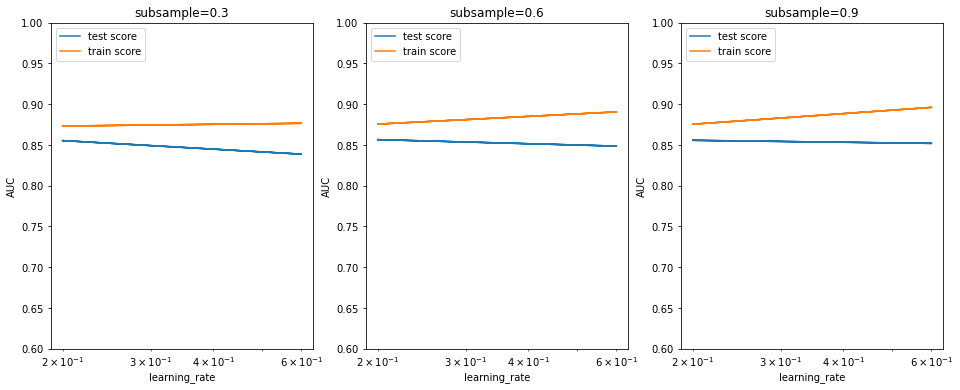

In [261]:
# # plotting
plt.figure(figsize=(16,6))

param_grid = {'learning_rate': [0.2, 0.6], 
             'subsample': [0.3, 0.6, 0.9]} 


for n, subsample in enumerate(param_grid['subsample']):
    

    # subplot 1/n
    plt.subplot(1,len(param_grid['subsample']), n+1)
    df = cv_results[cv_results['param_subsample']==subsample]

    plt.plot(df["param_learning_rate"], df["mean_test_score"])
    plt.plot(df["param_learning_rate"], df["mean_train_score"])
    plt.xlabel('learning_rate')
    plt.ylabel('AUC')
    plt.title("subsample={0}".format(subsample))
    plt.ylim([0.60, 1])
    plt.legend(['test score', 'train score'], loc='upper left')
    plt.xscale('log')

In [262]:
xgbmodel_cv.best_estimator_

XGBClassifier(base_estimator__max_depth=2, base_score=0.5, booster='gbtree',
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              gamma=0, gpu_id=-1, importance_type='gain',
              interaction_constraints='', learning_rate=0.2, max_delta_step=0,
              max_depth=2, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=200, n_jobs=4,
              num_parallel_tree=1, random_state=0, reg_alpha=0, reg_lambda=1,
              scale_pos_weight=1, subsample=0.6, tree_method='exact',
              validate_parameters=1, verbosity=None)

In [263]:
# chosen best hyperparameters from the above xgbmodel_cv model
# 'objective':'binary:logistic' outputs probability rather than label, which we need for auc
params = {'learning_rate': 0.2,
          'max_depth': 2, 
          'n_estimators':200,
           'n_jobs':4,
          'subsample':0.3,
         'objective':'binary:logistic'}

In [264]:
# fit model on training data
xgb_model = XGBClassifier(params = params)
xgb_model.fit(X_pca_train, y_pca_train)

[19:11:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "params" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[19:11:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=4, num_parallel_tree=1,
              params={'learning_rate': 0.2, 'max_depth': 2, 'n_estimators': 200,
                      'n_jobs': 4, 'objective': 'binary:logistic',
                      'subsample': 0.3},
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              subsample=1, tree_method='exact', validate_parameters=1,
              verbosity=None)

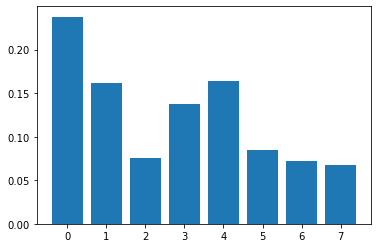

In [265]:
# plot
plt.bar(range(len(xgb_model.feature_importances_)), xgb_model.feature_importances_)
plt.show()

#### Predictions on Test Data

In [266]:
# predict
XGB_predictions_test = xgb_model.predict_proba(X_pca_test)
XGB_predictions_test[:10]

array([[0.03047574, 0.96952426],
       [0.84620523, 0.15379478],
       [0.7416118 , 0.25838822],
       [0.76396996, 0.23603004],
       [0.473952  , 0.526048  ],
       [0.8764653 , 0.1235347 ],
       [0.24599767, 0.75400233],
       [0.55042267, 0.44957736],
       [0.08865678, 0.9113432 ],
       [0.7011273 , 0.29887274]], dtype=float32)

In [267]:
XGB_pca_acc_test=xgb_model.score(X_pca_test, y_pca_test)
print("Accuracy of XGBoost(PCA)for Test: ",XGB_pca_acc_test)

Accuracy of XGBoost(PCA)for Test:  0.7906279448299495


In [268]:
# roc_auc
xgb_auc_test = metrics.roc_auc_score(y_pca_test,XGB_predictions_test[:, 1])
xgb_auc_test

0.8615004888248434

In [269]:
tempResults = pd.DataFrame({'Model':['XGBoost(PCA) for Test'],  
                            'Accuracy': [XGB_pca_acc_test], 'ROC-AUC':[xgb_auc_test]})
results = pd.concat([results, tempResults])
results = results[['Model', 'Accuracy','ROC-AUC']]
results


,Model,Accuracy,ROC-AUC
0,Random Classifier for Test,0.723550,0.723532
0,Decision Tree classifier for Test,0.730832,0.730657
0,Logistic regression(PCA) for Test,0.774865,0.775003
0,Adaboost(PCA) for Test,0.777264,0.850364
0,GradientBoost(PCA) for Test,0.786088,0.854499
0,XGBoost(PCA) for Test,0.790628,0.861500


### Feature Selection through RFE Method

### Feature Scaling

In [270]:
from sklearn.preprocessing import StandardScaler

In [271]:
X_log_train=X_train.copy()
X_log_test=X_test.copy()

In [272]:
# X_train_s=X_train.copy()
# X_test_s=X_test.copy()

In [273]:
col=X_train.columns.tolist()
col

['arpu_6',
 'onnet_mou_6',
 'offnet_mou_6',
 'loc_og_t2f_mou_6',
 'loc_og_t2c_mou_8',
 'loc_og_mou_6',
 'std_og_t2f_mou_6',
 'spl_og_mou_6',
 'loc_ic_t2f_mou_6',
 'loc_ic_mou_6',
 'std_ic_t2t_mou_6',
 'std_ic_t2m_mou_6',
 'std_ic_t2f_mou_6',
 'spl_ic_mou_8',
 'isd_ic_mou_6',
 'ic_others_6',
 'total_rech_num_6',
 'max_rech_amt_6',
 'total_rech_data_6',
 'max_rech_data_6',
 'max_rech_data_8',
 'vol_2g_mb_6',
 'monthly_2g_6',
 'aon',
 'cat_loc_og_t2t_6_Medium',
 'cat_loc_og_t2t_7_Medium',
 'cat_loc_og_t2t_8_Medium',
 'cat_loc_og_t2m_6_Medium',
 'cat_loc_og_t2m_7_Medium',
 'cat_loc_og_t2m_8_Medium',
 'cat_total_og_6_Medium',
 'cat_total_og_7_Medium',
 'cat_total_og_8_Medium',
 'cat_loc_ic_t2t_6_Medium',
 'cat_loc_ic_t2t_7_Medium',
 'cat_loc_ic_t2t_8_Medium',
 'cat_loc_ic_t2m_6_Medium',
 'cat_loc_ic_t2m_7_Medium',
 'cat_loc_ic_t2m_8_Medium',
 'cat_total_ic_6_Medium',
 'cat_total_ic_7_Medium',
 'cat_total_ic_8_Medium',
 'roam_ic_mou_6_7_months',
 'spl_ic_mou_6_7_months',
 'og_others_6_7_mont

In [274]:
y_log_train = y_train.copy()
y_log_test = y_test.copy()

In [275]:
### Checking the Churn Rate
churn = (sum(y_smote)/len(y_smote.index))*100
print("Churn Rate: ",churn)

Churn Rate:  50.0


We have almost 50% churn rate after SMOTE ANALYSIS

### 6.a Feature Selection Using RFE

#### K-Fold technique to deal with class imbalance

In [276]:
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
logreg = LogisticRegression()

In [277]:
# creating a KFold object with 3 splits 
folds = KFold(n_splits = 3, shuffle = True, random_state = 100)

# specify range of hyperparameters
hyper_params = [{'n_features_to_select': list(range(2,48))}]

# specify model

logreg.fit(X_log_train, y_log_train)
rfe = RFE(logreg)             

# set up GridSearchCV()
model_cv = GridSearchCV(estimator = rfe, 
                        param_grid = hyper_params, 
                        scoring= 'r2', 
                        cv = folds,
                        n_jobs=5,
                        verbose = 1,
                        return_train_score=True)      

# fit the model
model_cv.fit(X_log_train, y_log_train)                  

Fitting 3 folds for each of 46 candidates, totalling 138 fits


GridSearchCV(cv=KFold(n_splits=3, random_state=100, shuffle=True),
             estimator=RFE(estimator=LogisticRegression()), n_jobs=5,
             param_grid=[{'n_features_to_select': [2, 3, 4, 5, 6, 7, 8, 9, 10,
                                                   11, 12, 13, 14, 15, 16, 17,
                                                   18, 19, 20, 21, 22, 23, 24,
                                                   25, 26, 27, 28, 29, 30, 31, ...]}],
             return_train_score=True, scoring='r2', verbose=1)

In [278]:
# cv results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_features_to_select,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
0,18.967293,0.204938,0.013009,0.003581,2,{'n_features_to_select': 2},-0.654701,-0.771612,-0.609636,-0.678650,0.068261,46,-0.620677,-0.769361,-0.626987,-0.672342,0.068651
1,18.847030,0.131456,0.015018,0.006386,3,{'n_features_to_select': 3},-0.539247,-0.610797,-0.610076,-0.586707,0.033560,45,-0.517581,-0.581455,-0.625886,-0.574974,0.044452
2,18.673648,0.198434,0.009338,0.000453,4,{'n_features_to_select': 4},-0.484163,-0.457912,-0.531643,-0.491240,0.030514,44,-0.482335,-0.467345,-0.530051,-0.493244,0.026737
3,18.660675,0.199215,0.010333,0.001248,5,{'n_features_to_select': 5},-0.437894,-0.403720,-0.500799,-0.447471,0.040207,43,-0.440259,-0.410290,-0.498767,-0.449772,0.036742
4,18.605978,0.256807,0.010662,0.001229,6,{'n_features_to_select': 6},-0.404844,-0.386977,-0.442195,-0.411339,0.023005,42,-0.413384,-0.392888,-0.436860,-0.414377,0.017965
5,18.599983,0.088830,0.009679,0.000448,7,{'n_features_to_select': 7},-0.425996,-0.338953,-0.422807,-0.395918,0.040302,41,-0.424399,-0.348609,-0.404034,-0.392347,0.032025
6,18.703660,0.543875,0.014993,0.007820,8,{'n_features_to_select': 8},-0.411894,-0.336750,-0.410469,-0.386371,0.035092,40,-0.395540,-0.348389,-0.392798,-0.378909,0.021610
7,19.064270,0.132908,0.011678,0.001722,9,{'n_features_to_select': 9},-0.230780,-0.340715,-0.258010,-0.276502,0.046747,39,-0.246624,-0.337815,-0.230430,-0.271623,0.047270
8,18.598986,0.320834,0.020013,0.006166,10,{'n_features_to_select': 10},-0.214916,-0.333225,-0.246113,-0.264751,0.050065,37,-0.235169,-0.336714,-0.221618,-0.264500,0.051362
9,18.209999,0.130108,0.011661,0.001259,11,{'n_features_to_select': 11},-0.236068,-0.343799,-0.230690,-0.270186,0.052099,38,-0.251030,-0.348169,-0.196502,-0.265234,0.062727


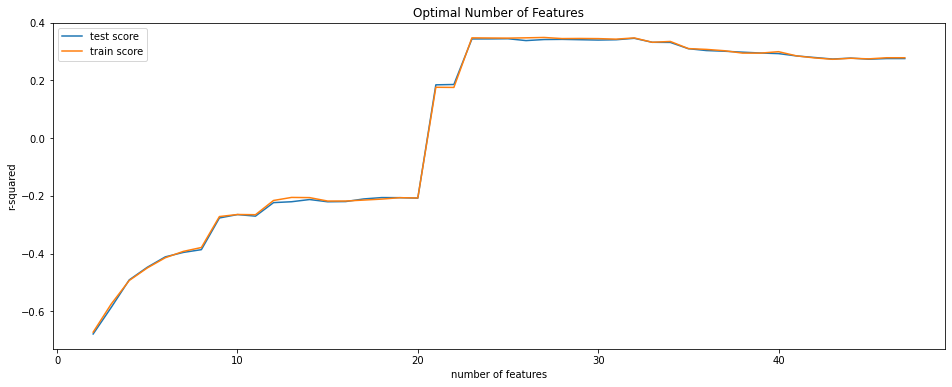

In [279]:
# plotting cv results
plt.figure(figsize=(16,6))

plt.plot(cv_results["param_n_features_to_select"], cv_results["mean_test_score"])
plt.plot(cv_results["param_n_features_to_select"], cv_results["mean_train_score"])
plt.xlabel('number of features')
plt.ylabel('r-squared')
plt.title("Optimal Number of Features")
plt.legend(['test score', 'train score'], loc='upper left')

In the above graph, we choose optimal number as 24, because after applying RFE() method the selection gradually reduces to significant number, to identify the important features. So,here the optimal number features obtained using KFold,GridSearchCV and RFE techniques is 24.

In [280]:
# # final model
from sklearn import metrics as sme
n_features_optimal = 24

logreg = LogisticRegression()
logreg.fit(X_log_train, y_log_train)

rfe = RFE(logreg, n_features_to_select=n_features_optimal)             
rfe = rfe.fit(X_log_train, y_log_train)

In [281]:
# RFE supported/non-supported boolean values
rfe.support_

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False,  True, False,
        True, False,  True, False,  True, False,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True, False,  True,  True,
       False])

In [282]:
# Below is the list of columns with RFE support expressed in terms of boolean values and also ranks suggested by RFE
list(zip(X_log_train.columns, rfe.support_, rfe.ranking_))

[('arpu_6', False, 11),
 ('onnet_mou_6', False, 8),
 ('offnet_mou_6', False, 10),
 ('loc_og_t2f_mou_6', False, 9),
 ('loc_og_t2c_mou_8', False, 23),
 ('loc_og_mou_6', False, 15),
 ('std_og_t2f_mou_6', False, 5),
 ('spl_og_mou_6', False, 14),
 ('loc_ic_t2f_mou_6', False, 12),
 ('loc_ic_mou_6', False, 19),
 ('std_ic_t2t_mou_6', False, 17),
 ('std_ic_t2m_mou_6', False, 22),
 ('std_ic_t2f_mou_6', False, 7),
 ('spl_ic_mou_8', False, 3),
 ('isd_ic_mou_6', False, 16),
 ('ic_others_6', False, 6),
 ('total_rech_num_6', True, 1),
 ('max_rech_amt_6', False, 21),
 ('total_rech_data_6', True, 1),
 ('max_rech_data_6', False, 4),
 ('max_rech_data_8', True, 1),
 ('vol_2g_mb_6', False, 20),
 ('monthly_2g_6', True, 1),
 ('aon', False, 18),
 ('cat_loc_og_t2t_6_Medium', True, 1),
 ('cat_loc_og_t2t_7_Medium', True, 1),
 ('cat_loc_og_t2t_8_Medium', True, 1),
 ('cat_loc_og_t2m_6_Medium', True, 1),
 ('cat_loc_og_t2m_7_Medium', True, 1),
 ('cat_loc_og_t2m_8_Medium', True, 1),
 ('cat_total_og_6_Medium', True, 1

In [283]:
col_rfe_support = X_log_train.columns[rfe.support_]

In [284]:
# The below are the columns selected by RFE procedure
col_rfe_support

Index(['total_rech_num_6', 'total_rech_data_6', 'max_rech_data_8',
       'monthly_2g_6', 'cat_loc_og_t2t_6_Medium', 'cat_loc_og_t2t_7_Medium',
       'cat_loc_og_t2t_8_Medium', 'cat_loc_og_t2m_6_Medium',
       'cat_loc_og_t2m_7_Medium', 'cat_loc_og_t2m_8_Medium',
       'cat_total_og_6_Medium', 'cat_total_og_7_Medium',
       'cat_total_og_8_Medium', 'cat_loc_ic_t2t_6_Medium',
       'cat_loc_ic_t2t_7_Medium', 'cat_loc_ic_t2t_8_Medium',
       'cat_loc_ic_t2m_6_Medium', 'cat_loc_ic_t2m_7_Medium',
       'cat_loc_ic_t2m_8_Medium', 'cat_total_ic_6_Medium',
       'cat_total_ic_7_Medium', 'cat_total_ic_8_Medium',
       'spl_ic_mou_6_7_months', 'og_others_6_7_months'],
      dtype='object')

### 6.b Correlation Matrix

In [285]:
# Let's copy X_l_train_s dataframe's columns to 'Sample' dataframe to check correlation among their features
Sample=X_log_train[col_rfe_support]

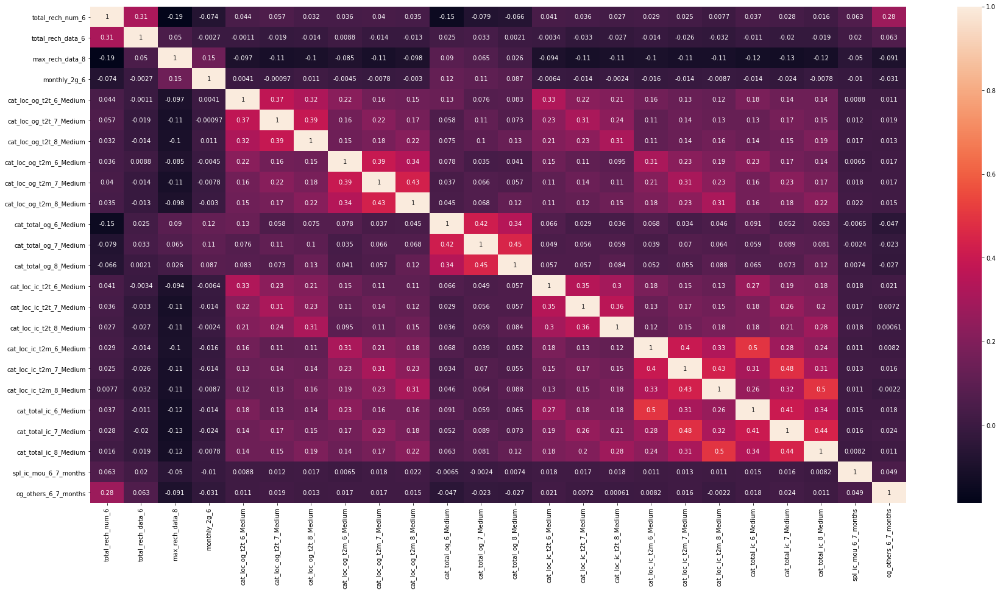

In [286]:
# Let's see the correlation matrix 
plt.figure(figsize = (30,15))        # Size of the figure
sns.heatmap(Sample.corr(),annot = True)

### Dropping highly correlated  features

In [287]:
# We create a set to store unique variables/features

corr_rfe_features=set()
corr_rfe_matrix = Sample.corr()

In [288]:
for i in range(len(corr_rfe_matrix.columns)):
    for j in range(i):
        if abs(corr_rfe_matrix.iloc[i, j]) > 0.40:
            colname = corr_rfe_matrix.columns[i]
            corr_rfe_features.add(colname)

In [289]:
# Total number of correlated features
len(corr_rfe_features)

8

In [290]:
# Total correlated features
print(corr_rfe_features)

{'cat_total_ic_8_Medium', 'cat_total_og_8_Medium', 'cat_total_og_7_Medium', 'cat_total_ic_7_Medium', 'cat_loc_ic_t2m_7_Medium', 'cat_total_ic_6_Medium', 'cat_loc_ic_t2m_8_Medium', 'cat_loc_og_t2m_8_Medium'}


In [291]:
# We remove the features which are highly correlated with each other which are not useful foe building model

Sample.drop(labels=corr_rfe_features, axis=1, inplace=True)

In [292]:
Sample.shape

(27237, 16)

In [293]:
col_non_corr_features=Sample.columns.tolist()
col_non_corr_features

['total_rech_num_6',
 'total_rech_data_6',
 'max_rech_data_8',
 'monthly_2g_6',
 'cat_loc_og_t2t_6_Medium',
 'cat_loc_og_t2t_7_Medium',
 'cat_loc_og_t2t_8_Medium',
 'cat_loc_og_t2m_6_Medium',
 'cat_loc_og_t2m_7_Medium',
 'cat_total_og_6_Medium',
 'cat_loc_ic_t2t_6_Medium',
 'cat_loc_ic_t2t_7_Medium',
 'cat_loc_ic_t2t_8_Medium',
 'cat_loc_ic_t2m_6_Medium',
 'spl_ic_mou_6_7_months',
 'og_others_6_7_months']

In [294]:
sca= StandardScaler()

In [295]:
X_log_train=X_log_train[col_non_corr_features]

### 6.c Assessing the model with Statsmodel

In [296]:
import statsmodels.api as sm
X_log_train_sm = sm.add_constant(X_log_train)
logm = sm.GLM(y_log_train,X_log_train_sm, family = sm.families.Binomial())
res = logm.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                27237
Model:                            GLM   Df Residuals:                    27220
Model Family:                Binomial   Df Model:                           16
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -11842.
Date:                Thu, 24 Nov 2022   Deviance:                       23684.
Time:                        19:18:11   Pearson chi2:                 1.25e+11
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                      -1.3994      0.041    -34.108      0.000      -1.480      -1.319
total_rech_num_6           -0.0152      0.002     -6.501      0.000      -0.020      -0.011
total_rech_data_6           0.3330      0.012     28.907      0.000       0.310       0.356
max_rech_data_8             0.0170      0.000     70.677      0.000       0.017       0.017
monthly_2g_6                0.1857      0.045      4.106      0.000       0.097       0.274
cat_loc_og_t2t_6_Medium    -0.3402      0.045     -7.583      0.000      -0.428      -0.252
cat_loc_og_t2t_7_Medium    -0.2328      0.045     -5.139      0.000      -0.322      -0.144
cat_loc_og_t2t_8_Medium    -0.2143      0.045     -4.772      0.000      -0.302      -0.126
cat_loc_og_t2m_6_Medium    -0.0733      0.045     -1.625      0.104      -0.162       0.015
cat_loc_og_t2m_7_Medium    -0.4182      0.045     -9.205      0.000      -0.507      -0.329
cat_total_og_6_Medium       0.3517      0.041      8.630      0.000       0.272       0.432
cat_loc_ic_t2t_6_Medium    -0.2716      0.042     -6.498      0.000      -0.354      -0.190
cat_loc_ic_t2t_7_Medium    -0.3315      0.042     -7.804      0.000      -0.415      -0.248
cat_loc_ic_t2t_8_Medium    -0.3324      0.042     -7.867      0.000      -0.415      -0.250
cat_loc_ic_t2m_6_Medium    -0.4230      0.040    -10.458      0.000      -0.502      -0.344
spl_ic_mou_6_7_months      -0.3262      0.146     -2.230      0.026      -0.613      -0.040
og_others_6_7_months       -0.0020      0.009     -0.231      0.817      -0.019       0.015
===========================================================================================
"""

### checking VIF values for features obtained from RFE

In [297]:
# Check for the VIF values of the feature variables. 
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [298]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_log_train.columns
vif['VIF'] = [variance_inflation_factor(X_log_train.values, i) for i in range(X_log_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,total_rech_num_6,2.56
1,total_rech_data_6,1.87
5,cat_loc_og_t2t_7_Medium,1.81
4,cat_loc_og_t2t_6_Medium,1.77
11,cat_loc_ic_t2t_7_Medium,1.77
10,cat_loc_ic_t2t_6_Medium,1.75
6,cat_loc_og_t2t_8_Medium,1.71
12,cat_loc_ic_t2t_8_Medium,1.70
7,cat_loc_og_t2m_6_Medium,1.67
8,cat_loc_og_t2m_7_Medium,1.56


In [299]:
results_summary = res.summary()
results_as_html = results_summary.tables[1].as_html()
res_df=pd.read_html(results_as_html, header=0, index_col=0)[0]

In [300]:
res_df

,coef,std err,z,P>|z|,[0.025,0.975]
const,-1.3994,0.041,-34.108,0.000,-1.480,-1.319
total_rech_num_6,-0.0152,0.002,-6.501,0.000,-0.020,-0.011
total_rech_data_6,0.3330,0.012,28.907,0.000,0.310,0.356
max_rech_data_8,0.0170,0.000,70.677,0.000,0.017,0.017
monthly_2g_6,0.1857,0.045,4.106,0.000,0.097,0.274
cat_loc_og_t2t_6_Medium,-0.3402,0.045,-7.583,0.000,-0.428,-0.252
cat_loc_og_t2t_7_Medium,-0.2328,0.045,-5.139,0.000,-0.322,-0.144
cat_loc_og_t2t_8_Medium,-0.2143,0.045,-4.772,0.000,-0.302,-0.126
cat_loc_og_t2m_6_Medium,-0.0733,0.045,-1.625,0.104,-0.162,0.015
cat_loc_og_t2m_7_Medium,-0.4182,0.045,-9.205,0.000,-0.507,-0.329


In [301]:
res_df.index.values

array(['const', 'total_rech_num_6', 'total_rech_data_6',
       'max_rech_data_8', 'monthly_2g_6', 'cat_loc_og_t2t_6_Medium',
       'cat_loc_og_t2t_7_Medium', 'cat_loc_og_t2t_8_Medium',
       'cat_loc_og_t2m_6_Medium', 'cat_loc_og_t2m_7_Medium',
       'cat_total_og_6_Medium', 'cat_loc_ic_t2t_6_Medium',
       'cat_loc_ic_t2t_7_Medium', 'cat_loc_ic_t2t_8_Medium',
       'cat_loc_ic_t2m_6_Medium', 'spl_ic_mou_6_7_months',
       'og_others_6_7_months'], dtype=object)

In [302]:
res_df['P>|z|'].idxmax()

'og_others_6_7_months'

In [303]:
res_df['P>|z|'].values

array([0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.104,
       0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.026, 0.817])

In [304]:
res_list=res_df['P>|z|'].values.tolist()
res_list

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.10400000000000001,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.026000000000000002,
 0.8170000000000001]

In [305]:
for i in range(len(res_list)):
    if res_list[i]>0.05:
        res_df.drop(res_df['P>|z|'].idxmax(),inplace=True)
        break

In [306]:
res_df.index.values

array(['const', 'total_rech_num_6', 'total_rech_data_6',
       'max_rech_data_8', 'monthly_2g_6', 'cat_loc_og_t2t_6_Medium',
       'cat_loc_og_t2t_7_Medium', 'cat_loc_og_t2t_8_Medium',
       'cat_loc_og_t2m_6_Medium', 'cat_loc_og_t2m_7_Medium',
       'cat_total_og_6_Medium', 'cat_loc_ic_t2t_6_Medium',
       'cat_loc_ic_t2t_7_Medium', 'cat_loc_ic_t2t_8_Medium',
       'cat_loc_ic_t2m_6_Medium', 'spl_ic_mou_6_7_months'], dtype=object)

In [307]:
res_df.index[1:,]

Index(['total_rech_num_6', 'total_rech_data_6', 'max_rech_data_8',
       'monthly_2g_6', 'cat_loc_og_t2t_6_Medium', 'cat_loc_og_t2t_7_Medium',
       'cat_loc_og_t2t_8_Medium', 'cat_loc_og_t2m_6_Medium',
       'cat_loc_og_t2m_7_Medium', 'cat_total_og_6_Medium',
       'cat_loc_ic_t2t_6_Medium', 'cat_loc_ic_t2t_7_Medium',
       'cat_loc_ic_t2t_8_Medium', 'cat_loc_ic_t2m_6_Medium',
       'spl_ic_mou_6_7_months'],
      dtype='object')

In [308]:
X_log_train=X_log_train[res_df.index[1:,]]
X_log_train

,total_rech_num_6,total_rech_data_6,max_rech_data_8,monthly_2g_6,cat_loc_og_t2t_6_Medium,cat_loc_og_t2t_7_Medium,cat_loc_og_t2t_8_Medium,cat_loc_og_t2m_6_Medium,cat_loc_og_t2m_7_Medium,cat_total_og_6_Medium,cat_loc_ic_t2t_6_Medium,cat_loc_ic_t2t_7_Medium,cat_loc_ic_t2t_8_Medium,cat_loc_ic_t2m_6_Medium,spl_ic_mou_6_7_months
2934,19,1.0,25.0,0,0,1,0,0,1,0,0,1,1,1,0.000000
22356,10,2.0,101.0,1,0,0,1,0,0,1,1,1,1,0,0.000000
11303,8,1.0,98.0,0,1,0,1,1,1,0,0,0,0,0,0.055000
14063,19,6.0,98.0,0,0,0,0,0,0,0,0,0,0,1,0.030000
13537,18,4.0,25.0,0,1,1,1,1,1,0,1,1,1,1,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16304,4,1.0,252.0,0,1,1,1,0,0,1,1,1,0,0,0.165000
79,5,1.0,252.0,0,0,0,0,0,0,0,0,0,0,0,0.000000
12119,8,3.0,252.0,1,1,0,1,1,0,1,0,1,0,1,0.000000
14147,7,1.0,154.0,1,0,0,0,0,0,0,0,0,0,0,0.000000


In [309]:
X_log_train.columns

Index(['total_rech_num_6', 'total_rech_data_6', 'max_rech_data_8',
       'monthly_2g_6', 'cat_loc_og_t2t_6_Medium', 'cat_loc_og_t2t_7_Medium',
       'cat_loc_og_t2t_8_Medium', 'cat_loc_og_t2m_6_Medium',
       'cat_loc_og_t2m_7_Medium', 'cat_total_og_6_Medium',
       'cat_loc_ic_t2t_6_Medium', 'cat_loc_ic_t2t_7_Medium',
       'cat_loc_ic_t2t_8_Medium', 'cat_loc_ic_t2m_6_Medium',
       'spl_ic_mou_6_7_months'],
      dtype='object')

In [310]:
#print(X_log_train.columns.tolist())

In [311]:
#X_log_train.shape

### Assessing the models with StatsModels

In [312]:
X_train_sm = sm.add_constant(X_log_train)
logm = sm.GLM(y_log_train,X_train_sm, family = sm.families.Binomial())
res = logm.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                27237
Model:                            GLM   Df Residuals:                    27221
Model Family:                Binomial   Df Model:                           15
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -11842.
Date:                Thu, 24 Nov 2022   Deviance:                       23684.
Time:                        19:18:14   Pearson chi2:                 1.25e+11
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                      -1.3993      0.041    -34.105      0.000      -1.480      -1.319
total_rech_num_6           -0.0153      0.002     -6.771      0.000      -0.020      -0.011
total_rech_data_6           0.3331      0.012     28.916      0.000       0.311       0.356
max_rech_data_8             0.0170      0.000     70.718      0.000       0.017       0.017
monthly_2g_6                0.1858      0.045      4.107      0.000       0.097       0.274
cat_loc_og_t2t_6_Medium    -0.3401      0.045     -7.582      0.000      -0.428      -0.252
cat_loc_og_t2t_7_Medium    -0.2328      0.045     -5.138      0.000      -0.322      -0.144
cat_loc_og_t2t_8_Medium    -0.2143      0.045     -4.772      0.000      -0.302      -0.126
cat_loc_og_t2m_6_Medium    -0.0734      0.045     -1.627      0.104      -0.162       0.015
cat_loc_og_t2m_7_Medium    -0.4182      0.045     -9.204      0.000      -0.507      -0.329
cat_total_og_6_Medium       0.3516      0.041      8.629      0.000       0.272       0.432
cat_loc_ic_t2t_6_Medium    -0.2717      0.042     -6.500      0.000      -0.354      -0.190
cat_loc_ic_t2t_7_Medium    -0.3315      0.042     -7.803      0.000      -0.415      -0.248
cat_loc_ic_t2t_8_Medium    -0.3323      0.042     -7.864      0.000      -0.415      -0.249
cat_loc_ic_t2m_6_Medium    -0.4230      0.040    -10.457      0.000      -0.502      -0.344
spl_ic_mou_6_7_months      -0.3272      0.146     -2.237      0.025      -0.614      -0.041
===========================================================================================
"""

In [313]:
#Dropping the feature with high p-value
#X_log_train.drop(['og_others_6_7_months'],axis=1,inplace=True)

In [314]:
results_summary = res.summary()
results_as_html = results_summary.tables[1].as_html()
res_df=pd.read_html(results_as_html, header=0, index_col=0)[0]

In [315]:
res_df['P>|z|'].idxmax()

'cat_loc_og_t2m_6_Medium'

In [316]:
res_list=res_df['P>|z|'].values.tolist()
res_list

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.10400000000000001,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.025]

In [317]:
for i in range(len(res_list)):
    if res_list[i]>0.05:
        res_df.drop(res_df['P>|z|'].idxmax(),inplace=True)
        break

In [318]:
res_df.index.values

array(['const', 'total_rech_num_6', 'total_rech_data_6',
       'max_rech_data_8', 'monthly_2g_6', 'cat_loc_og_t2t_6_Medium',
       'cat_loc_og_t2t_7_Medium', 'cat_loc_og_t2t_8_Medium',
       'cat_loc_og_t2m_7_Medium', 'cat_total_og_6_Medium',
       'cat_loc_ic_t2t_6_Medium', 'cat_loc_ic_t2t_7_Medium',
       'cat_loc_ic_t2t_8_Medium', 'cat_loc_ic_t2m_6_Medium',
       'spl_ic_mou_6_7_months'], dtype=object)

In [319]:
res_df.index[1:,]

Index(['total_rech_num_6', 'total_rech_data_6', 'max_rech_data_8',
       'monthly_2g_6', 'cat_loc_og_t2t_6_Medium', 'cat_loc_og_t2t_7_Medium',
       'cat_loc_og_t2t_8_Medium', 'cat_loc_og_t2m_7_Medium',
       'cat_total_og_6_Medium', 'cat_loc_ic_t2t_6_Medium',
       'cat_loc_ic_t2t_7_Medium', 'cat_loc_ic_t2t_8_Medium',
       'cat_loc_ic_t2m_6_Medium', 'spl_ic_mou_6_7_months'],
      dtype='object')

In [320]:
X_log_train=X_log_train[res_df.index[1:,]]
X_log_train

,total_rech_num_6,total_rech_data_6,max_rech_data_8,monthly_2g_6,cat_loc_og_t2t_6_Medium,cat_loc_og_t2t_7_Medium,cat_loc_og_t2t_8_Medium,cat_loc_og_t2m_7_Medium,cat_total_og_6_Medium,cat_loc_ic_t2t_6_Medium,cat_loc_ic_t2t_7_Medium,cat_loc_ic_t2t_8_Medium,cat_loc_ic_t2m_6_Medium,spl_ic_mou_6_7_months
2934,19,1.0,25.0,0,0,1,0,1,0,0,1,1,1,0.000000
22356,10,2.0,101.0,1,0,0,1,0,1,1,1,1,0,0.000000
11303,8,1.0,98.0,0,1,0,1,1,0,0,0,0,0,0.055000
14063,19,6.0,98.0,0,0,0,0,0,0,0,0,0,1,0.030000
13537,18,4.0,25.0,0,1,1,1,1,0,1,1,1,1,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16304,4,1.0,252.0,0,1,1,1,0,1,1,1,0,0,0.165000
79,5,1.0,252.0,0,0,0,0,0,0,0,0,0,0,0.000000
12119,8,3.0,252.0,1,1,0,1,0,1,0,1,0,1,0.000000
14147,7,1.0,154.0,1,0,0,0,0,0,0,0,0,0,0.000000


In [321]:
X_log_train.columns

Index(['total_rech_num_6', 'total_rech_data_6', 'max_rech_data_8',
       'monthly_2g_6', 'cat_loc_og_t2t_6_Medium', 'cat_loc_og_t2t_7_Medium',
       'cat_loc_og_t2t_8_Medium', 'cat_loc_og_t2m_7_Medium',
       'cat_total_og_6_Medium', 'cat_loc_ic_t2t_6_Medium',
       'cat_loc_ic_t2t_7_Medium', 'cat_loc_ic_t2t_8_Medium',
       'cat_loc_ic_t2m_6_Medium', 'spl_ic_mou_6_7_months'],
      dtype='object')

In [322]:
X_train_sm = sm.add_constant(X_log_train)
logm = sm.GLM(y_log_train,X_train_sm, family = sm.families.Binomial())
res = logm.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                27237
Model:                            GLM   Df Residuals:                    27222
Model Family:                Binomial   Df Model:                           14
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -11843.
Date:                Thu, 24 Nov 2022   Deviance:                       23687.
Time:                        19:18:15   Pearson chi2:                 1.26e+11
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                      -1.4033      0.041    -34.255      0.000      -1.484      -1.323
total_rech_num_6           -0.0153      0.002     -6.780      0.000      -0.020      -0.011
total_rech_data_6           0.3328      0.012     28.896      0.000       0.310       0.355
max_rech_data_8             0.0170      0.000     70.743      0.000       0.017       0.017
monthly_2g_6                0.1858      0.045      4.107      0.000       0.097       0.274
cat_loc_og_t2t_6_Medium    -0.3483      0.045     -7.816      0.000      -0.436      -0.261
cat_loc_og_t2t_7_Medium    -0.2328      0.045     -5.139      0.000      -0.322      -0.144
cat_loc_og_t2t_8_Medium    -0.2159      0.045     -4.809      0.000      -0.304      -0.128
cat_loc_og_t2m_7_Medium    -0.4424      0.043    -10.300      0.000      -0.527      -0.358
cat_total_og_6_Medium       0.3490      0.041      8.572      0.000       0.269       0.429
cat_loc_ic_t2t_6_Medium    -0.2740      0.042     -6.559      0.000      -0.356      -0.192
cat_loc_ic_t2t_7_Medium    -0.3310      0.042     -7.792      0.000      -0.414      -0.248
cat_loc_ic_t2t_8_Medium    -0.3318      0.042     -7.853      0.000      -0.415      -0.249
cat_loc_ic_t2m_6_Medium    -0.4376      0.039    -11.095      0.000      -0.515      -0.360
spl_ic_mou_6_7_months      -0.3275      0.146     -2.237      0.025      -0.614      -0.041
===========================================================================================
"""

In [323]:
# Selected Features
col_zero_pvalue=X_log_train.columns.tolist()

In [324]:
X_log_train.shape

(27237, 14)

In [325]:
X_log_test=X_log_test[col_zero_pvalue]

In [326]:
# Check the shape of X_l_test_s_2 dataframe
X_log_test.shape

(11673, 14)

In [327]:
# X_rfe_train is used for boosting classifiers

X_rfe_train=X_log_train.copy()

In [328]:
# X_rfe_test is used for boosting classifiers

X_rfe_test=X_log_test.copy()

In [329]:
# y_rfe_train and y_rfe_test is used for boosting classifiers

y_rfe_train = y_train.copy()
y_rfe_test = y_test.copy()

In [330]:
# Check the shape of X_log_test dataframe
X_log_test.shape

(11673, 14)

In [331]:
X_test_sm = sm.add_constant(X_log_test)
logm2 = sm.GLM(y_log_test,X_test_sm, family = sm.families.Binomial())
res2 = logm2.fit()
res2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                11673
Model:                            GLM   Df Residuals:                    11658
Model Family:                Binomial   Df Model:                           14
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4995.5
Date:                Thu, 24 Nov 2022   Deviance:                       9990.9
Time:                        19:18:16   Pearson chi2:                 1.94e+06
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                      -1.4312      0.063    -22.719      0.000      -1.555      -1.308
total_rech_num_6           -0.0154      0.003     -4.403      0.000      -0.022      -0.009
total_rech_data_6           0.3242      0.017     19.467      0.000       0.292       0.357
max_rech_data_8             0.0177      0.000     46.895      0.000       0.017       0.018
monthly_2g_6                0.0167      0.069      0.242      0.809      -0.118       0.151
cat_loc_og_t2t_6_Medium    -0.4041      0.068     -5.913      0.000      -0.538      -0.270
cat_loc_og_t2t_7_Medium    -0.2069      0.070     -2.967      0.003      -0.344      -0.070
cat_loc_og_t2t_8_Medium    -0.3526      0.070     -5.003      0.000      -0.491      -0.214
cat_loc_og_t2m_7_Medium    -0.5509      0.067     -8.234      0.000      -0.682      -0.420
cat_total_og_6_Medium       0.4043      0.063      6.395      0.000       0.280       0.528
cat_loc_ic_t2t_6_Medium    -0.2538      0.065     -3.913      0.000      -0.381      -0.127
cat_loc_ic_t2t_7_Medium    -0.2545      0.065     -3.900      0.000      -0.382      -0.127
cat_loc_ic_t2t_8_Medium    -0.3298      0.066     -4.997      0.000      -0.459      -0.200
cat_loc_ic_t2m_6_Medium    -0.3561      0.062     -5.781      0.000      -0.477      -0.235
spl_ic_mou_6_7_months      -0.3156      0.284     -1.113      0.266      -0.872       0.240
===========================================================================================
"""

In [332]:
results_summary = res2.summary()
results_as_html = results_summary.tables[1].as_html()
res_df=pd.read_html(results_as_html, header=0, index_col=0)[0]

In [333]:
res_list=res_df['P>|z|'].values.tolist()
res_list

[0.0,
 0.0,
 0.0,
 0.0,
 0.809,
 0.0,
 0.003,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.266]

In [334]:
for i in range(len(res_list)):
    if res_list[i]>0.05:
        res_df.drop(res_df['P>|z|'].idxmax(),inplace=True)
        break

In [335]:
res_df['P>|z|'].idxmax()

'spl_ic_mou_6_7_months'

In [336]:
res_df.index.values

array(['const', 'total_rech_num_6', 'total_rech_data_6',
       'max_rech_data_8', 'cat_loc_og_t2t_6_Medium',
       'cat_loc_og_t2t_7_Medium', 'cat_loc_og_t2t_8_Medium',
       'cat_loc_og_t2m_7_Medium', 'cat_total_og_6_Medium',
       'cat_loc_ic_t2t_6_Medium', 'cat_loc_ic_t2t_7_Medium',
       'cat_loc_ic_t2t_8_Medium', 'cat_loc_ic_t2m_6_Medium',
       'spl_ic_mou_6_7_months'], dtype=object)

In [337]:
res_df.index[1:,]

Index(['total_rech_num_6', 'total_rech_data_6', 'max_rech_data_8',
       'cat_loc_og_t2t_6_Medium', 'cat_loc_og_t2t_7_Medium',
       'cat_loc_og_t2t_8_Medium', 'cat_loc_og_t2m_7_Medium',
       'cat_total_og_6_Medium', 'cat_loc_ic_t2t_6_Medium',
       'cat_loc_ic_t2t_7_Medium', 'cat_loc_ic_t2t_8_Medium',
       'cat_loc_ic_t2m_6_Medium', 'spl_ic_mou_6_7_months'],
      dtype='object')

In [338]:
X_log_test=X_log_test[res_df.index[1:,]]
X_log_test

,total_rech_num_6,total_rech_data_6,max_rech_data_8,cat_loc_og_t2t_6_Medium,cat_loc_og_t2t_7_Medium,cat_loc_og_t2t_8_Medium,cat_loc_og_t2m_7_Medium,cat_total_og_6_Medium,cat_loc_ic_t2t_6_Medium,cat_loc_ic_t2t_7_Medium,cat_loc_ic_t2t_8_Medium,cat_loc_ic_t2m_6_Medium,spl_ic_mou_6_7_months
23292,13,2.000000,252.000000,0,0,0,0,0,0,0,0,0,0.000000
21048,9,1.000000,25.000000,1,1,0,1,0,0,0,0,1,0.000000
20880,40,12.000000,25.000000,1,0,1,0,1,1,0,1,1,0.000000
7281,15,1.000000,25.000000,1,0,0,0,0,0,0,0,0,0.075000
31559,7,1.000000,174.603032,0,0,0,0,0,0,0,0,0,0.007024
...,...,...,...,...,...,...,...,...,...,...,...,...,...
36415,8,2.525254,202.175024,0,0,0,0,0,0,0,0,0,0.000000
18128,2,1.000000,252.000000,1,0,0,0,0,0,0,0,0,0.000000
648,3,1.000000,25.000000,0,0,0,0,0,0,0,0,0,0.000000
5763,8,1.000000,25.000000,1,0,0,0,0,1,0,1,0,0.000000


In [339]:
X_log_test.columns

Index(['total_rech_num_6', 'total_rech_data_6', 'max_rech_data_8',
       'cat_loc_og_t2t_6_Medium', 'cat_loc_og_t2t_7_Medium',
       'cat_loc_og_t2t_8_Medium', 'cat_loc_og_t2m_7_Medium',
       'cat_total_og_6_Medium', 'cat_loc_ic_t2t_6_Medium',
       'cat_loc_ic_t2t_7_Medium', 'cat_loc_ic_t2t_8_Medium',
       'cat_loc_ic_t2m_6_Medium', 'spl_ic_mou_6_7_months'],
      dtype='object')

In [340]:
#Dropping the feature with high p-value
# X_log_test.drop(['spl_og_mou_6'],axis=1,inplace=True)

In [341]:
X_test_sm = sm.add_constant(X_log_test)
logm2 = sm.GLM(y_log_test,X_test_sm, family = sm.families.Binomial())
res2 = logm2.fit()
res2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                11673
Model:                            GLM   Df Residuals:                    11659
Model Family:                Binomial   Df Model:                           13
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4995.5
Date:                Thu, 24 Nov 2022   Deviance:                       9991.0
Time:                        19:18:16   Pearson chi2:                 1.99e+06
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                      -1.4314      0.063    -22.721      0.000      -1.555      -1.308
total_rech_num_6           -0.0154      0.003     -4.409      0.000      -0.022      -0.009
total_rech_data_6           0.3242      0.017     19.468      0.000       0.292       0.357
max_rech_data_8             0.0177      0.000     49.020      0.000       0.017       0.018
cat_loc_og_t2t_6_Medium    -0.4039      0.068     -5.911      0.000      -0.538      -0.270
cat_loc_og_t2t_7_Medium    -0.2071      0.070     -2.970      0.003      -0.344      -0.070
cat_loc_og_t2t_8_Medium    -0.3517      0.070     -4.997      0.000      -0.490      -0.214
cat_loc_og_t2m_7_Medium    -0.5502      0.067     -8.232      0.000      -0.681      -0.419
cat_total_og_6_Medium       0.4054      0.063      6.432      0.000       0.282       0.529
cat_loc_ic_t2t_6_Medium    -0.2537      0.065     -3.913      0.000      -0.381      -0.127
cat_loc_ic_t2t_7_Medium    -0.2545      0.065     -3.899      0.000      -0.382      -0.127
cat_loc_ic_t2t_8_Medium    -0.3298      0.066     -4.997      0.000      -0.459      -0.200
cat_loc_ic_t2m_6_Medium    -0.3563      0.062     -5.784      0.000      -0.477      -0.236
spl_ic_mou_6_7_months      -0.3156      0.284     -1.112      0.266      -0.872       0.241
===========================================================================================
"""

In [342]:
results_summary = res2.summary()
results_as_html = results_summary.tables[1].as_html()
res_df=pd.read_html(results_as_html, header=0, index_col=0)[0]

In [343]:
res_list=res_df['P>|z|'].values.tolist()
res_list

[0.0, 0.0, 0.0, 0.0, 0.0, 0.003, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.266]

In [344]:
for i in range(len(res_list)):
    if res_list[i]>0.05:
        res_df.drop(res_df['P>|z|'].idxmax(),inplace=True)
        break

In [345]:
res_df.index.values

array(['const', 'total_rech_num_6', 'total_rech_data_6',
       'max_rech_data_8', 'cat_loc_og_t2t_6_Medium',
       'cat_loc_og_t2t_7_Medium', 'cat_loc_og_t2t_8_Medium',
       'cat_loc_og_t2m_7_Medium', 'cat_total_og_6_Medium',
       'cat_loc_ic_t2t_6_Medium', 'cat_loc_ic_t2t_7_Medium',
       'cat_loc_ic_t2t_8_Medium', 'cat_loc_ic_t2m_6_Medium'], dtype=object)

In [346]:
res_df.index[1:,]

Index(['total_rech_num_6', 'total_rech_data_6', 'max_rech_data_8',
       'cat_loc_og_t2t_6_Medium', 'cat_loc_og_t2t_7_Medium',
       'cat_loc_og_t2t_8_Medium', 'cat_loc_og_t2m_7_Medium',
       'cat_total_og_6_Medium', 'cat_loc_ic_t2t_6_Medium',
       'cat_loc_ic_t2t_7_Medium', 'cat_loc_ic_t2t_8_Medium',
       'cat_loc_ic_t2m_6_Medium'],
      dtype='object')

In [347]:
X_log_test=X_log_test[res_df.index[1:,]]
X_log_test

,total_rech_num_6,total_rech_data_6,max_rech_data_8,cat_loc_og_t2t_6_Medium,cat_loc_og_t2t_7_Medium,cat_loc_og_t2t_8_Medium,cat_loc_og_t2m_7_Medium,cat_total_og_6_Medium,cat_loc_ic_t2t_6_Medium,cat_loc_ic_t2t_7_Medium,cat_loc_ic_t2t_8_Medium,cat_loc_ic_t2m_6_Medium
23292,13,2.000000,252.000000,0,0,0,0,0,0,0,0,0
21048,9,1.000000,25.000000,1,1,0,1,0,0,0,0,1
20880,40,12.000000,25.000000,1,0,1,0,1,1,0,1,1
7281,15,1.000000,25.000000,1,0,0,0,0,0,0,0,0
31559,7,1.000000,174.603032,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
36415,8,2.525254,202.175024,0,0,0,0,0,0,0,0,0
18128,2,1.000000,252.000000,1,0,0,0,0,0,0,0,0
648,3,1.000000,25.000000,0,0,0,0,0,0,0,0,0
5763,8,1.000000,25.000000,1,0,0,0,0,1,0,1,0


In [348]:
test_cols=X_log_test.columns
X_log_test.columns

Index(['total_rech_num_6', 'total_rech_data_6', 'max_rech_data_8',
       'cat_loc_og_t2t_6_Medium', 'cat_loc_og_t2t_7_Medium',
       'cat_loc_og_t2t_8_Medium', 'cat_loc_og_t2m_7_Medium',
       'cat_total_og_6_Medium', 'cat_loc_ic_t2t_6_Medium',
       'cat_loc_ic_t2t_7_Medium', 'cat_loc_ic_t2t_8_Medium',
       'cat_loc_ic_t2m_6_Medium'],
      dtype='object')

In [349]:
X_test_sm = sm.add_constant(X_log_test)
logm2 = sm.GLM(y_log_test,X_test_sm, family = sm.families.Binomial())
res2 = logm2.fit()
res2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                11673
Model:                            GLM   Df Residuals:                    11660
Model Family:                Binomial   Df Model:                           12
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4996.1
Date:                Thu, 24 Nov 2022   Deviance:                       9992.3
Time:                        19:18:17   Pearson chi2:                 1.98e+06
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                      -1.4413      0.062    -23.103      0.000      -1.564      -1.319
total_rech_num_6           -0.0156      0.003     -4.468      0.000      -0.022      -0.009
total_rech_data_6           0.3245      0.017     19.480      0.000       0.292       0.357
max_rech_data_8             0.0177      0.000     49.057      0.000       0.017       0.018
cat_loc_og_t2t_6_Medium    -0.4032      0.068     -5.901      0.000      -0.537      -0.269
cat_loc_og_t2t_7_Medium    -0.2065      0.070     -2.961      0.003      -0.343      -0.070
cat_loc_og_t2t_8_Medium    -0.3514      0.070     -4.993      0.000      -0.489      -0.213
cat_loc_og_t2m_7_Medium    -0.5524      0.067     -8.270      0.000      -0.683      -0.422
cat_total_og_6_Medium       0.4045      0.063      6.421      0.000       0.281       0.528
cat_loc_ic_t2t_6_Medium    -0.2553      0.065     -3.939      0.000      -0.382      -0.128
cat_loc_ic_t2t_7_Medium    -0.2549      0.065     -3.906      0.000      -0.383      -0.127
cat_loc_ic_t2t_8_Medium    -0.3311      0.066     -5.018      0.000      -0.460      -0.202
cat_loc_ic_t2m_6_Medium    -0.3559      0.062     -5.780      0.000      -0.477      -0.235
===========================================================================================
"""

In [350]:
col_zero_or_least_pvalue=X_log_test.columns.to_list()
col_zero_or_least_pvalue

['total_rech_num_6',
 'total_rech_data_6',
 'max_rech_data_8',
 'cat_loc_og_t2t_6_Medium',
 'cat_loc_og_t2t_7_Medium',
 'cat_loc_og_t2t_8_Medium',
 'cat_loc_og_t2m_7_Medium',
 'cat_total_og_6_Medium',
 'cat_loc_ic_t2t_6_Medium',
 'cat_loc_ic_t2t_7_Medium',
 'cat_loc_ic_t2t_8_Medium',
 'cat_loc_ic_t2m_6_Medium']

In [351]:
X_log_train=X_log_train[col_zero_or_least_pvalue]

In [352]:
X_train_sm = sm.add_constant(X_log_train)
logm3 = sm.GLM(y_log_train,X_train_sm, family = sm.families.Binomial())
res3 = logm2.fit()
res3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                11673
Model:                            GLM   Df Residuals:                    11660
Model Family:                Binomial   Df Model:                           12
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4996.1
Date:                Thu, 24 Nov 2022   Deviance:                       9992.3
Time:                        19:18:17   Pearson chi2:                 1.98e+06
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                      -1.4413      0.062    -23.103      0.000      -1.564      -1.319
total_rech_num_6           -0.0156      0.003     -4.468      0.000      -0.022      -0.009
total_rech_data_6           0.3245      0.017     19.480      0.000       0.292       0.357
max_rech_data_8             0.0177      0.000     49.057      0.000       0.017       0.018
cat_loc_og_t2t_6_Medium    -0.4032      0.068     -5.901      0.000      -0.537      -0.269
cat_loc_og_t2t_7_Medium    -0.2065      0.070     -2.961      0.003      -0.343      -0.070
cat_loc_og_t2t_8_Medium    -0.3514      0.070     -4.993      0.000      -0.489      -0.213
cat_loc_og_t2m_7_Medium    -0.5524      0.067     -8.270      0.000      -0.683      -0.422
cat_total_og_6_Medium       0.4045      0.063      6.421      0.000       0.281       0.528
cat_loc_ic_t2t_6_Medium    -0.2553      0.065     -3.939      0.000      -0.382      -0.128
cat_loc_ic_t2t_7_Medium    -0.2549      0.065     -3.906      0.000      -0.383      -0.127
cat_loc_ic_t2t_8_Medium    -0.3311      0.066     -5.018      0.000      -0.460      -0.202
cat_loc_ic_t2m_6_Medium    -0.3559      0.062     -5.780      0.000      -0.477      -0.235
===========================================================================================
"""

In [353]:
Final_columns=X_log_train.columns
Final_columns

Index(['total_rech_num_6', 'total_rech_data_6', 'max_rech_data_8',
       'cat_loc_og_t2t_6_Medium', 'cat_loc_og_t2t_7_Medium',
       'cat_loc_og_t2t_8_Medium', 'cat_loc_og_t2m_7_Medium',
       'cat_total_og_6_Medium', 'cat_loc_ic_t2t_6_Medium',
       'cat_loc_ic_t2t_7_Medium', 'cat_loc_ic_t2t_8_Medium',
       'cat_loc_ic_t2m_6_Medium'],
      dtype='object')

In [354]:
X_log_train.head()

,total_rech_num_6,total_rech_data_6,max_rech_data_8,cat_loc_og_t2t_6_Medium,cat_loc_og_t2t_7_Medium,cat_loc_og_t2t_8_Medium,cat_loc_og_t2m_7_Medium,cat_total_og_6_Medium,cat_loc_ic_t2t_6_Medium,cat_loc_ic_t2t_7_Medium,cat_loc_ic_t2t_8_Medium,cat_loc_ic_t2m_6_Medium
2934,19,1.0,25.0,0,1,0,1,0,0,1,1,1
22356,10,2.0,101.0,0,0,1,0,1,1,1,1,0
11303,8,1.0,98.0,1,0,1,1,0,0,0,0,0
14063,19,6.0,98.0,0,0,0,0,0,0,0,0,1
13537,18,4.0,25.0,1,1,1,1,0,1,1,1,1


In [355]:
X_log_test=X_log_test[Final_columns]

In [356]:
# Getting the predicted values on the train set
y_pred = res2.predict(X_test_sm)
y_pred[:10]

23292    0.969882
21048    0.088510
20880    0.727117
7281     0.212363
31559    0.866358
6412     0.176295
19226    0.853879
35693    0.336162
37892    0.896897
21905    0.276857
dtype: float64

#### Creating a dataframe with the actual convert flag and the predicted probabilities

We create Churn Probability column from 'Churn' and predicted columns to determine customers who may churn in the "Churn phase" 

In [357]:
y_pred_final = pd.DataFrame({'Churn':y_log_test.values, 'Churn_Prob':y_pred})
y_pred_final.head()

,Churn,Churn_Prob
23292,1,0.969882
21048,0,0.088510
20880,1,0.727117
7281,0,0.212363
31559,1,0.866358


In [358]:
y_pred_final.Churn_Prob.mean()

0.5032125417630458

#### Creating new column 'predicted' with 1 if Churn_Prob > 0.50321 else 0

In [359]:
y_pred_final['predicted'] = y_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.50321 else 0)

# Let's see the head
y_pred_final.head()

,Churn,Churn_Prob,predicted
23292,1,0.969882,1
21048,0,0.088510,0
20880,1,0.727117,1
7281,0,0.212363,0
31559,1,0.866358,1


In [360]:
from sklearn import metrics
# Confusion matrix 
confusion = metrics.confusion_matrix(y_pred_final.Churn, y_pred_final.predicted )
print(confusion)

[[5064  735]
 [1185 4689]]


In [361]:
# Let's check the overall accuracy.
print("Accuracy Score: ",metrics.accuracy_score(y_pred_final.Churn, y_pred_final.predicted))

Accuracy Score:  0.8355178617322025


In [362]:
### Checking the Churn Rate
churn = (sum(y_pred_final.predicted)/len(y_pred_final['predicted'].index))*100
print("Churn Rate: ",churn)

Churn Rate:  46.466204060652785


### 6.d Plotting ROC curve

In [363]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic Curve')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [364]:
fpr, tpr, thresholds = metrics.roc_curve( y_pred_final.Churn, 
                                         y_pred_final.predicted, drop_intermediate = False )

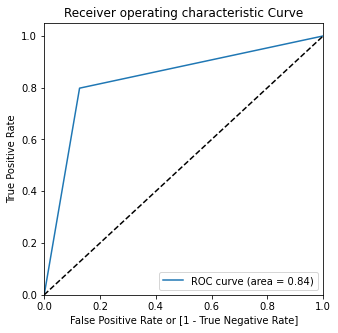

In [365]:
draw_roc(y_pred_final.Churn, y_pred_final.predicted)

In [366]:
# Let's create columns with different Churn probability cutoffs 
Churn_prob = [float(x)/10 for x in range(10)] 
for i in Churn_prob:
    y_pred_final[i]= y_pred_final.Churn_Prob.map(lambda x: 1 if x > i else 0)
y_pred_final.head()

,Churn,Churn_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
23292,1,0.969882,1,1,1,1,1,1,1,1,1,1,1
21048,0,0.088510,0,1,0,0,0,0,0,0,0,0,0
20880,1,0.727117,1,1,1,1,1,1,1,1,1,0,0
7281,0,0.212363,0,1,1,1,0,0,0,0,0,0,0
31559,1,0.866358,1,1,1,1,1,1,1,1,1,1,0


In [367]:
# Now let's calculate accuracy sensitivity and specificity for various Churn probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['Churn_Prob','accuracy','sensitivity','specitivity'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives


num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]

for i in num:
    cm1 = metrics.confusion_matrix(y_pred_final.Churn, y_pred_final[i])
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    specitivity = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensitivity = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensitivity,specitivity]

print(cutoff_df)

     Churn_Prob  accuracy  sensitivity  specitivity
0.0         0.0  0.503213     1.000000     0.000000
0.1         0.1  0.600188     0.988424     0.206932
0.2         0.2  0.726291     0.953864     0.495775
0.3         0.3  0.812816     0.907559     0.716848
0.4         0.4  0.844941     0.842356     0.847560
0.5         0.5  0.836118     0.800136     0.872564
0.6         0.6  0.819841     0.751277     0.889291
0.7         0.7  0.794654     0.680797     0.909984
0.8         0.8  0.751992     0.574055     0.932230
0.9         0.9  0.651589     0.345250     0.961890


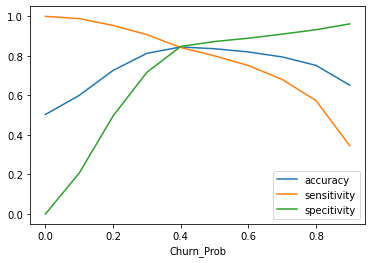

In [368]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='Churn_Prob', y=['accuracy','sensitivity','specitivity'])
plt.show()

In [369]:
def Find_Optimal_Cutoff(target, predicted):
    fpr, tpr, threshold = metrics.roc_curve(target, predicted)
    i = np.arange(len(tpr))
    roc = pd.DataFrame({'tf' : pd.Series(tpr-(1-fpr), index=i), 'threshold' : pd.Series(threshold, index=i)})
    roc_t = roc.iloc[(roc.tf-0).abs().argsort()[:1]]

    return list(roc_t['threshold'])

threshold = Find_Optimal_Cutoff(y_pred_final.Churn, 
                                         y_pred_final.Churn_Prob)
print("Threshold Value: ", threshold)

Threshold Value:  [0.3942969618729975]


#### From the curve above, 0.39 is the optimum point to take it as a cutoff probability

In [370]:
y_pred_final['final_predicted'] = y_pred_final.Churn_Prob.map(lambda x: 1 if x > round(threshold[0],2) else 0)

y_pred_final.head()

,Churn,Churn_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
23292,1,0.969882,1,1,1,1,1,1,1,1,1,1,1,1
21048,0,0.088510,0,1,0,0,0,0,0,0,0,0,0,0
20880,1,0.727117,1,1,1,1,1,1,1,1,1,0,0,1
7281,0,0.212363,0,1,1,1,0,0,0,0,0,0,0,0
31559,1,0.866358,1,1,1,1,1,1,1,1,1,1,0,1


Text(0.5, 1.0, 'Predictions of Customers who will or will not Churn')

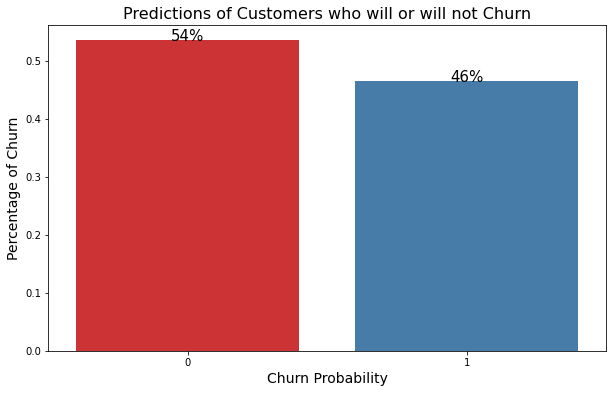

In [371]:
#Ploting barplot for target 
plt.figure(figsize=(10,6))
bar_graph = sns.barplot(y_pred_final['predicted'], y_pred_final['final_predicted'], palette='Set1', 
                        estimator=lambda x: len(x) / len(y_pred_final) )

#Annotating the graph
for p in bar_graph.patches:
        width, height = p.get_width(), p.get_height()
        x, y = p.get_xy() 
        bar_graph.text(x+width/2, y+height, '{:.0%}'.format(height), horizontalalignment='center',fontsize=15)

#Setting the labels for the graph
plt.xlabel('Churn Probability', fontsize=14)
plt.ylabel('Percentage of Churn', fontsize=14)
plt.title('Predictions of Customers who will or will not Churn', fontsize=16)

The bar graph between 'Percentage of Churn' and 'Churn Probability' says that 54% customers are satisfied with network but whereas 46% of customers are about to churn because they might be dissatisified with the network or thinking to leave the network because of other network's better offers. But we have to say that all this graph happening in the 'Good Phase' and 'Action Phase'. If the Network team focus on the 46% customers and can retain them through variuos plans and offers then network can be successful overcoming this issue.

### 6.f Gradient Boosting through RFE

In [372]:
X_rfe_train=X_log_train.loc[:,Final_columns]

In [373]:
X_rfe_trafin=X_log_train.loc[:,Final_columns]

In [374]:
X_rfe_test=X_log_test.loc[:,Final_columns]

In [375]:
X_rfe_tesfin=X_log_test.loc[:,Final_columns]

In [376]:
X_rfe_train=sca.fit_transform(X_rfe_train)
X_rfe_test=sca.transform(X_rfe_test)

In [377]:
# parameter grid
param_grid = {"learning_rate": [0.2, 0.6, 0.9],
              "subsample": [0.3, 0.6, 0.9]
             }

In [378]:
# Gradientboost with the tree as base estimator
GBC_rfe = GradientBoostingClassifier(max_depth=2, n_estimators=200)

In [379]:
# run grid search
folds = 3
grid_search_GBC_rfe = GridSearchCV(GBC_rfe, 
                               cv = folds,
                               param_grid=param_grid, 
                               scoring = 'roc_auc', 
                               n_jobs=8,
                               return_train_score=True,                         
                               verbose = 1)

grid_search_GBC_rfe.fit(X_rfe_train, y_rfe_train)

Fitting 3 folds for each of 9 candidates, totalling 27 fits


GridSearchCV(cv=3,
             estimator=GradientBoostingClassifier(max_depth=2,
                                                  n_estimators=200),
             n_jobs=8,
             param_grid={'learning_rate': [0.2, 0.6, 0.9],
                         'subsample': [0.3, 0.6, 0.9]},
             return_train_score=True, scoring='roc_auc', verbose=1)

In [380]:
cv_results = pd.DataFrame(grid_search_GBC_rfe.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_learning_rate,param_subsample,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
0,4.672978,0.120482,0.054781,0.016820,0.2,0.3,"{'learning_rate': 0.2, 'subsample': 0.3}",0.938203,0.941798,0.943442,0.941148,0.002188,6,0.948146,0.945546,0.944413,0.946035,0.001563
1,6.634192,0.249403,0.064657,0.001741,0.2,0.6,"{'learning_rate': 0.2, 'subsample': 0.6}",0.940096,0.944605,0.945196,0.943299,0.002278,5,0.949471,0.947621,0.946899,0.947997,0.001083
2,7.907239,0.058802,0.064993,0.002174,0.2,0.9,"{'learning_rate': 0.2, 'subsample': 0.9}",0.941608,0.945650,0.946971,0.944743,0.002281,2,0.950495,0.948580,0.947720,0.948931,0.001160
3,4.273764,0.014884,0.059339,0.000934,0.6,0.3,"{'learning_rate': 0.6, 'subsample': 0.3}",0.934528,0.936680,0.939778,0.936995,0.002155,8,0.945205,0.939763,0.942398,0.942455,0.002222
4,6.435012,0.104619,0.068992,0.002164,0.6,0.6,"{'learning_rate': 0.6, 'subsample': 0.6}",0.940300,0.944953,0.947079,0.944111,0.002831,3,0.952938,0.951154,0.950644,0.951579,0.000984


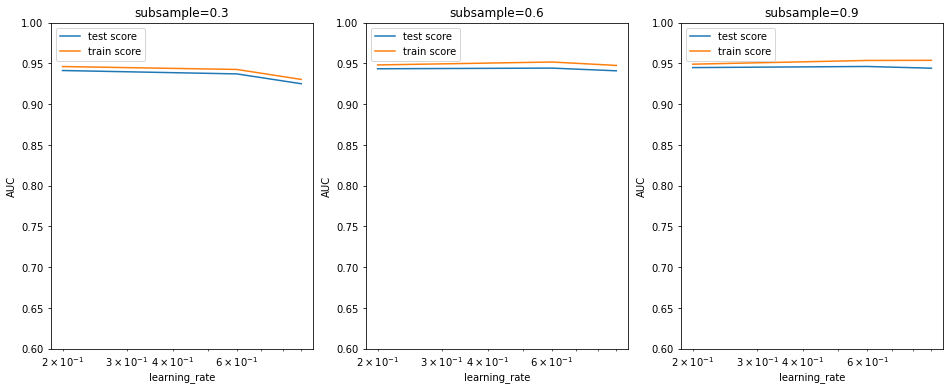

In [381]:
# # plotting
plt.figure(figsize=(16,6))


for n, subsample in enumerate(param_grid['subsample']):
    

    # subplot 1/n
    plt.subplot(1,len(param_grid['subsample']), n+1)
    df = cv_results[cv_results['param_subsample']==subsample]

    plt.plot(df["param_learning_rate"], df["mean_test_score"])
    plt.plot(df["param_learning_rate"], df["mean_train_score"])
    plt.xlabel('learning_rate')
    plt.ylabel('AUC')
    plt.title("subsample={0}".format(subsample))
    plt.ylim([0.60, 1])
    plt.legend(['test score', 'train score'], loc='upper left')
    plt.xscale('log')

In [382]:
grid_search_GBC_rfe.best_estimator_

GradientBoostingClassifier(learning_rate=0.6, max_depth=2, n_estimators=200,
                           subsample=0.9)

In [383]:
GBC_rfe=grid_search_GBC_rfe.best_estimator_

GBC_rfe.fit(X_rfe_train,y_rfe_train)

GradientBoostingClassifier(learning_rate=0.6, max_depth=2, n_estimators=200,
                           subsample=0.9)

In [384]:
# predict on test data
rfe_GBC_predictions_test = GBC_rfe.predict_proba(X_rfe_test)
rfe_GBC_predictions_test[:10]

array([[1.25730513e-01, 8.74269487e-01],
       [9.47937464e-01, 5.20625360e-02],
       [3.97054808e-01, 6.02945192e-01],
       [9.26833231e-01, 7.31667685e-02],
       [2.18597632e-02, 9.78140237e-01],
       [9.03377570e-01, 9.66224298e-02],
       [2.12901523e-01, 7.87098477e-01],
       [6.26879581e-02, 9.37312042e-01],
       [9.11986400e-04, 9.99088014e-01],
       [9.16567862e-01, 8.34321381e-02]])

In [385]:
rfe_GBC_rfe_acc_tes=GBC_rfe.score(X_rfe_test, y_rfe_test)
print("Accuracy of GradientBoost(RFE)for Test: ",rfe_GBC_rfe_acc_tes)

Accuracy of GradientBoost(RFE)for Test:  0.8895742311316713


In [386]:
# roc auc
rfe_roc_auc_GBC_test=metrics.roc_auc_score(y_rfe_test, rfe_GBC_predictions_test[:, 1])
print("ROC AUC under GradientBoost for Test",rfe_roc_auc_GBC_test)

ROC AUC under GradientBoost for Test 0.9490545638438244


In [387]:
tempResults = pd.DataFrame({'Model':['GradientBoost(RFE) for Test'],  
                            'Accuracy': [rfe_GBC_rfe_acc_tes], 'ROC-AUC':[rfe_roc_auc_GBC_test]})
results = pd.concat([results, tempResults])
results = results[['Model', 'Accuracy','ROC-AUC']]
results

,Model,Accuracy,ROC-AUC
0,Random Classifier for Test,0.723550,0.723532
0,Decision Tree classifier for Test,0.730832,0.730657
0,Logistic regression(PCA) for Test,0.774865,0.775003
0,Adaboost(PCA) for Test,0.777264,0.850364
0,GradientBoost(PCA) for Test,0.786088,0.854499
0,XGBoost(PCA) for Test,0.790628,0.861500
0,GradientBoost(RFE) for Test,0.889574,0.949055


### 6.g XG Boosting through RFE

In [388]:
# fit model on training data with default hyperparameters
xgb_rfe_model = XGBClassifier()
xgb_rfe_model.fit(X_rfe_train, y_rfe_train)

[19:18:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=4, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [389]:
# make predictions for test data
# use predict_proba since we need probabilities to compute auc
y_rfe_pred_test = xgb_rfe_model.predict_proba(X_rfe_test)
y_rfe_pred_test[:10]

array([[7.9730093e-02, 9.2026991e-01],
       [9.7863507e-01, 2.1364935e-02],
       [1.8441588e-01, 8.1558412e-01],
       [9.2772174e-01, 7.2278261e-02],
       [1.2284458e-02, 9.8771554e-01],
       [9.1354191e-01, 8.6458087e-02],
       [3.1454748e-01, 6.8545252e-01],
       [1.0648644e-01, 8.9351356e-01],
       [1.0919571e-04, 9.9989080e-01],
       [9.1855240e-01, 8.1447579e-02]], dtype=float32)

In [390]:
# evaluate predictions
roc_test = metrics.roc_auc_score(y_rfe_test, y_rfe_pred_test[:, 1])
print("AUC: %.2f%%" % (roc_test * 100.0))

AUC: 94.76%


In [391]:
# hyperparameter tuning with XGBoost

# creating a KFold object 
folds = 3

# specify range of hyperparameters
param_grid = {"base_estimator__max_depth" : [2, 5],
              'learning_rate': [0.2, 0.6], 
             'subsample': [0.3, 0.6, 0.9]}          


# specify model
xgb_rfe_model = XGBClassifier(max_depth=2, n_estimators=200)

# set up GridSearchCV()
xgb_rfe_model_cv = GridSearchCV(estimator = xgb_rfe_model, 
                        param_grid = param_grid, 
                        scoring= 'roc_auc', 
                        n_jobs=5,
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True)      



In [392]:
# fit the model
xgb_rfe_model_cv.fit(X_rfe_train, y_rfe_train)

Fitting 3 folds for each of 12 candidates, totalling 36 fits
[19:19:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "base_estimator__max_depth" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[19:19:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=2, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=200, n_jobs=None,
                                     num_parallel_tree=None, random_state=None,
                                     reg_alpha=None, reg_lambda=None,
                                     scale_pos_weight=None, subsample=None,
                                     tree_method=None, va

In [393]:
# cv results
rfe_cv_results = pd.DataFrame(xgb_rfe_model_cv.cv_results_)
rfe_cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_base_estimator__max_depth,param_learning_rate,param_subsample,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
0,3.314414,0.126368,0.021982,0.005896,2,0.2,0.3,"{'base_estimator__max_depth': 2, 'learning_rat...",0.939708,0.943031,0.944782,0.942507,0.002104,9,0.948340,0.946150,0.946095,0.946862,0.001046
1,3.341844,0.088073,0.025988,0.000836,2,0.2,0.6,"{'base_estimator__max_depth': 2, 'learning_rat...",0.940978,0.944482,0.945889,0.943783,0.002065,7,0.949632,0.947310,0.947120,0.948021,0.001142
2,3.306011,0.028996,0.022653,0.006037,2,0.2,0.9,"{'base_estimator__max_depth': 2, 'learning_rat...",0.941763,0.945628,0.946914,0.944768,0.002189,5,0.950087,0.947905,0.947805,0.948599,0.001053
3,3.337952,0.008240,0.021277,0.002050,2,0.6,0.3,"{'base_estimator__max_depth': 2, 'learning_rat...",0.940079,0.942110,0.943672,0.941954,0.001471,11,0.950881,0.948095,0.949116,0.949364,0.001150
4,3.409029,0.020408,0.019944,0.002157,2,0.6,0.6,"{'base_estimator__max_depth': 2, 'learning_rat...",0.941669,0.946635,0.947350,0.945218,0.002526,3,0.953772,0.951375,0.951180,0.952109,0.001179
5,3.956073,0.049846,0.024933,0.002821,2,0.6,0.9,"{'base_estimator__max_depth': 2, 'learning_rat...",0.943405,0.947258,0.948618,0.946427,0.002208,1,0.954857,0.952733,0.952460,0.953350,0.001072
6,4.026589,0.220819,0.019283,0.000471,5,0.2,0.3,"{'base_estimator__max_depth': 5, 'learning_rat...",0.939708,0.943031,0.944782,0.942507,0.002104,9,0.948340,0.946150,0.946095,0.946862,0.001046
7,3.670863,0.064891,0.018617,0.000940,5,0.2,0.6,"{'base_estimator__max_depth': 5, 'learning_rat...",0.940978,0.944482,0.945889,0.943783,0.002065,7,0.949632,0.947310,0.947120,0.948021,0.001142
8,3.324925,0.114723,0.021283,0.004280,5,0.2,0.9,"{'base_estimator__max_depth': 5, 'learning_rat...",0.941763,0.945628,0.946914,0.944768,0.002189,5,0.950087,0.947905,0.947805,0.948599,0.001053
9,3.306141,0.020182,0.022274,0.004178,5,0.6,0.3,"{'base_estimator__max_depth': 5, 'learning_rat...",0.940079,0.942110,0.943672,0.941954,0.001471,11,0.950881,0.948095,0.949116,0.949364,0.001150


In [394]:
# convert parameters to int for plotting on x-axis
rfe_cv_results['param_learning_rate'] = rfe_cv_results['param_learning_rate'].astype('float')
rfe_cv_results['param_max_depth'] = rfe_cv_results['param_base_estimator__max_depth'].astype('float')
rfe_cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_base_estimator__max_depth,param_learning_rate,param_subsample,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score,param_max_depth
0,3.314414,0.126368,0.021982,0.005896,2,0.2,0.3,"{'base_estimator__max_depth': 2, 'learning_rat...",0.939708,0.943031,0.944782,0.942507,0.002104,9,0.948340,0.946150,0.946095,0.946862,0.001046,2.0
1,3.341844,0.088073,0.025988,0.000836,2,0.2,0.6,"{'base_estimator__max_depth': 2, 'learning_rat...",0.940978,0.944482,0.945889,0.943783,0.002065,7,0.949632,0.947310,0.947120,0.948021,0.001142,2.0
2,3.306011,0.028996,0.022653,0.006037,2,0.2,0.9,"{'base_estimator__max_depth': 2, 'learning_rat...",0.941763,0.945628,0.946914,0.944768,0.002189,5,0.950087,0.947905,0.947805,0.948599,0.001053,2.0
3,3.337952,0.008240,0.021277,0.002050,2,0.6,0.3,"{'base_estimator__max_depth': 2, 'learning_rat...",0.940079,0.942110,0.943672,0.941954,0.001471,11,0.950881,0.948095,0.949116,0.949364,0.001150,2.0
4,3.409029,0.020408,0.019944,0.002157,2,0.6,0.6,"{'base_estimator__max_depth': 2, 'learning_rat...",0.941669,0.946635,0.947350,0.945218,0.002526,3,0.953772,0.951375,0.951180,0.952109,0.001179,2.0


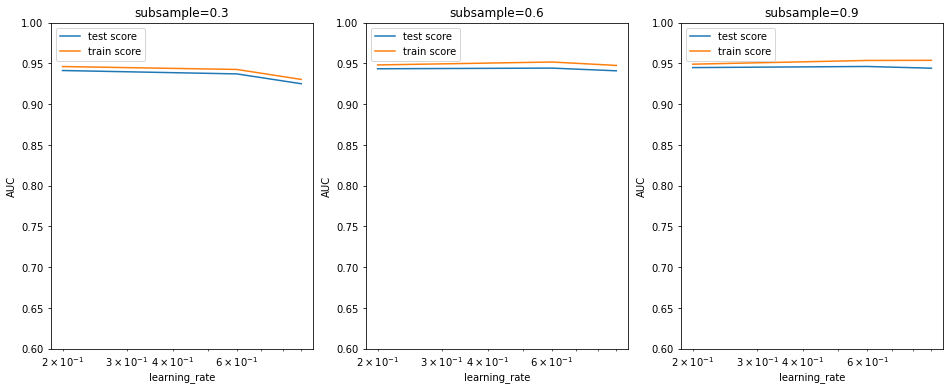

In [395]:
# # plotting
plt.figure(figsize=(16,6))

param_grid = {'learning_rate': [0.2, 0.6], 
             'subsample': [0.3, 0.6, 0.9]} 


for n, subsample in enumerate(param_grid['subsample']):
    

    # subplot 1/n
    plt.subplot(1,len(param_grid['subsample']), n+1)
    df = cv_results[cv_results['param_subsample']==subsample]

    plt.plot(df["param_learning_rate"], df["mean_test_score"])
    plt.plot(df["param_learning_rate"], df["mean_train_score"])
    plt.xlabel('learning_rate')
    plt.ylabel('AUC')
    plt.title("subsample={0}".format(subsample))
    plt.ylim([0.60, 1])
    plt.legend(['test score', 'train score'], loc='upper left')
    plt.xscale('log')

In [396]:
xgb_rfe_model_cv.best_estimator_

XGBClassifier(base_estimator__max_depth=2, base_score=0.5, booster='gbtree',
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              gamma=0, gpu_id=-1, importance_type='gain',
              interaction_constraints='', learning_rate=0.6, max_delta_step=0,
              max_depth=2, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=200, n_jobs=4,
              num_parallel_tree=1, random_state=0, reg_alpha=0, reg_lambda=1,
              scale_pos_weight=1, subsample=0.9, tree_method='exact',
              validate_parameters=1, verbosity=None)

In [397]:
# fit model on training data
xgb_rfemodel = xgb_rfe_model_cv.best_estimator_#(params = params)
xgb_rfemodel.fit(X_rfe_train, y_rfe_train)

[19:19:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "base_estimator__max_depth" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[19:19:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_estimator__max_depth=2, base_score=0.5, booster='gbtree',
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              gamma=0, gpu_id=-1, importance_type='gain',
              interaction_constraints='', learning_rate=0.6, max_delta_step=0,
              max_depth=2, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=200, n_jobs=4,
              num_parallel_tree=1, random_state=0, reg_alpha=0, reg_lambda=1,
              scale_pos_weight=1, subsample=0.9, tree_method='exact',
              validate_parameters=1, verbosity=None)

In [398]:
# predict
rfe_XGB_predictions_test = xgb_rfemodel.predict_proba(X_rfe_test)
rfe_XGB_predictions_test[:10]

array([[1.2931693e-01, 8.7068307e-01],
       [9.5933950e-01, 4.0660486e-02],
       [4.1399729e-01, 5.8600271e-01],
       [9.1342878e-01, 8.6571231e-02],
       [1.8846393e-02, 9.8115361e-01],
       [9.0203488e-01, 9.7965114e-02],
       [2.9315752e-01, 7.0684248e-01],
       [1.7485559e-02, 9.8251444e-01],
       [9.9420547e-05, 9.9990058e-01],
       [8.9886928e-01, 1.0113073e-01]], dtype=float32)

In [399]:
rfe_XGB_acc_test=xgb_rfemodel.score(X_rfe_test, y_rfe_test)
print("Accuracy of XGBoost(RFE)for Test: ",rfe_XGB_acc_test)

Accuracy of XGBoost(RFE)for Test:  0.8903452411548016


In [400]:
# roc auc
rfe_roc_auc_XGB_test=metrics.roc_auc_score(y_rfe_test, rfe_XGB_predictions_test[:, 1])
print("ROC AUC under XGBoost(RFE) for Test",rfe_roc_auc_XGB_test)

ROC AUC under XGBoost(RFE) for Test 0.9495000429494173


In [401]:
tempResults = pd.DataFrame({'Model':['XGBoost(RFE) for Test'],  
                            'Accuracy': [rfe_XGB_acc_test], 'ROC-AUC':[rfe_roc_auc_XGB_test]})
results = pd.concat([results, tempResults])
results = results[['Model', 'Accuracy','ROC-AUC']]
results

,Model,Accuracy,ROC-AUC
0,Random Classifier for Test,0.723550,0.723532
0,Decision Tree classifier for Test,0.730832,0.730657
0,Logistic regression(PCA) for Test,0.774865,0.775003
0,Adaboost(PCA) for Test,0.777264,0.850364
0,GradientBoost(PCA) for Test,0.786088,0.854499
0,XGBoost(PCA) for Test,0.790628,0.861500
0,GradientBoost(RFE) for Test,0.889574,0.949055
0,XGBoost(RFE) for Test,0.890345,0.949500


## 7. Analysis and Answers

Q) Which model is best and why? 

A)

As we can see the above table, we prefer XGBoosting Classifier is the best model when going through PCA or RFE feature engineering techniques. XGBoost acquires maximum area under curve as well as possess significant accuracy to explain features behaviour.

We also observe that the GradientBoosting classifier is also best next to XGBoosting as it holds good Accuracy and ROC-AUC values. Here LogisticRegression through RFE is gaining more weight over Logistic Regression through PCA.

In [402]:
# feature importance
importance = dict(zip(X_rfe_trafin.columns, xgb_rfemodel.feature_importances_))
importance

{'total_rech_num_6': 0.014175174,
 'total_rech_data_6': 0.09650113,
 'max_rech_data_8': 0.37639,
 'cat_loc_og_t2t_6_Medium': 0.012530116,
 'cat_loc_og_t2t_7_Medium': 0.09786902,
 'cat_loc_og_t2t_8_Medium': 0.02475819,
 'cat_loc_og_t2m_7_Medium': 0.075640574,
 'cat_total_og_6_Medium': 0.017682562,
 'cat_loc_ic_t2t_6_Medium': 0.038042154,
 'cat_loc_ic_t2t_7_Medium': 0.058388017,
 'cat_loc_ic_t2t_8_Medium': 0.09046958,
 'cat_loc_ic_t2m_6_Medium': 0.09755345}

<BarContainer object of 12 artists>

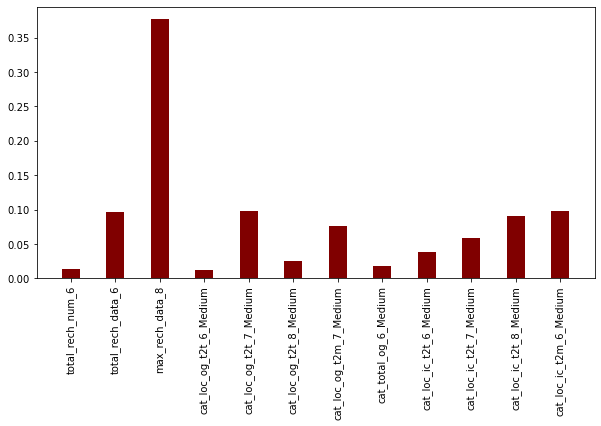

In [403]:
features=list(importance.keys())
fvalues=list(importance.values())
fig=plt.figure(figsize=(10,5))

#creating the bar plot
plt.xticks(rotation='vertical')
plt.bar(features, fvalues, color='maroon', width=0.4)

In [404]:
features=list(importance.keys())
features

['total_rech_num_6',
 'total_rech_data_6',
 'max_rech_data_8',
 'cat_loc_og_t2t_6_Medium',
 'cat_loc_og_t2t_7_Medium',
 'cat_loc_og_t2t_8_Medium',
 'cat_loc_og_t2m_7_Medium',
 'cat_total_og_6_Medium',
 'cat_loc_ic_t2t_6_Medium',
 'cat_loc_ic_t2t_7_Medium',
 'cat_loc_ic_t2t_8_Medium',
 'cat_loc_ic_t2m_6_Medium']

In [405]:
fvalues=list(importance.values())
fvalues

[0.014175174,
 0.09650113,
 0.37639,
 0.012530116,
 0.09786902,
 0.02475819,
 0.075640574,
 0.017682562,
 0.038042154,
 0.058388017,
 0.09046958,
 0.09755345]

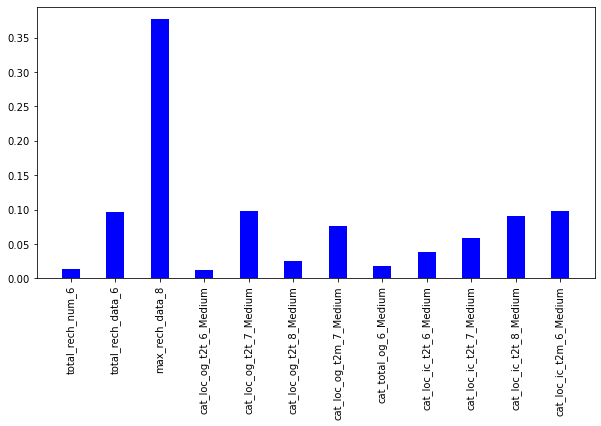

In [406]:
fig=plt.figure(figsize=(10,5))
plt.bar(features,fvalues,color='blue',width=0.4)
plt.xticks(features,rotation='vertical')
plt.show()

In [407]:
# All the final features displayed in descending order
sorted(importance.items(), key=lambda x:x[1],reverse=True)

[('max_rech_data_8', 0.37639),
 ('cat_loc_og_t2t_7_Medium', 0.09786902),
 ('cat_loc_ic_t2m_6_Medium', 0.09755345),
 ('total_rech_data_6', 0.09650113),
 ('cat_loc_ic_t2t_8_Medium', 0.09046958),
 ('cat_loc_og_t2m_7_Medium', 0.075640574),
 ('cat_loc_ic_t2t_7_Medium', 0.058388017),
 ('cat_loc_ic_t2t_6_Medium', 0.038042154),
 ('cat_loc_og_t2t_8_Medium', 0.02475819),
 ('cat_total_og_6_Medium', 0.017682562),
 ('total_rech_num_6', 0.014175174),
 ('cat_loc_og_t2t_6_Medium', 0.012530116)]

## Saving the Model

In [408]:
import pickle

#dump information to that file
pickle.dump(xgb_rfemodel,open('model.pkl','wb'))

#load a model
pickle.load(open('model.pkl','rb'))

XGBClassifier(base_estimator__max_depth=2, base_score=0.5, booster='gbtree',
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              gamma=0, gpu_id=-1, importance_type='gain',
              interaction_constraints='', learning_rate=0.6, max_delta_step=0,
              max_depth=2, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=200, n_jobs=4,
              num_parallel_tree=1, random_state=0, reg_alpha=0, reg_lambda=1,
              scale_pos_weight=1, subsample=0.9, tree_method='exact',
              validate_parameters=1, verbosity=None)

Q) What are the important features produced by the 'best' model?


A) 

As we are preferring XGBoosting classifier model over others,it is ranking the features that are most important for this project. As we can observe the above list of important features with their weights, and among them 'total_rech_data_6' i.e, total amount of data recharged by the customers in the 6th month i.e, "Action-Phase". This is very important feature because in the action phase customer behaviour says whether he/she will churn or not for the next month.The data usage by the customer shows his/her class in the network family.

The next important and weighted feature is 'max_rech_data_6', maximum amount of data recharged by the customers in the 6th month,'monthly_2g_6' is the 2G network consumed by the customer in the 6th month of the year. 2G network is still used by the old, classic and high valued customers for their 'stick-up' interests and they are asset to the T-network family.

Q) What proposal(s) you want to make before T-Network team? How you want to help them in retaining customers?

A)

T-Network is adviced to shed light on the above important features to carry out critical actions to retain high valued customers. For example, if we look at the most important features like 'total_rech_data_6','max_rech_data_6', if customers are allowed to consume data at lower prices or aged on network customers (customers who have been with T-network for long term) are given discounts on price plans with uninterrupted data provision may help network company to retain the valuable customers. 

If we observe carefully, maximum no.of features are of 6th month i.e 'Good Phase'. This means, we should have a very focussed observation on 6th month, start recording the customer's experiences at their early walk with the T-network.  And also behaviour of 'Medium' class customers in the 6th month and expecting their satisfaction and upgrading to 'High' Class.